<div class="alert alert-block alert-info">
    <B><H1>Capstone project </H1></B>
   
</div>

<div class="alert alert-block alert-success">
  Professional Certificate in Machine Learning and Artificial Intelligence - May 2023 offered via emeritus.org
</div>

<div class="alert alert-block alert-info">
    <B><H1>Business Objective</H1></B>
</div>

<div class="alert alert-block alert-success">
  Identify the probability that a diabetic patient will be readmitted with in less than 30 days after discharge from hospital
</div>

<div class="alert alert-block alert-info">
    <B><H3>About Data</H3></B>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li><a href="https://www.w3schools.com">Diabetic patients readmission for 1999 – 2008</a> available at UC Irvine Machine Learning Repository</li>
        <li>10 years, from 1999 to 2008, of clinical data of inpatient </li>
        <li>Collected for 130 US hospitals and integrated delivery networks  </li>
        <li>Data of patients 
            <ul>
                <li>Diagnosed with diabetes</li>
                <li>Underwent laboratory test</li>
                <li>Took medications during their stay</li>
                <li>Stayed up to 14 days</li>
            </ul>
        </li>
        <li> Sample size: 101766
            <ul> 
                <li>Features: 47 such as admission and discharge type, length of stay, diagnosis, lab tests and medication</li>
                <li>Features: 47 such as demographics, admission and discharge type, length of stay, diagnosis, lab tests and medication</li>
                <li>Has both Numerical and Categorical data</li>
                <li>Data does not contain null values but we have unknown/invalid and ? values</li>
            </ul>
        </li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    Clore,John, Cios,Krzysztof, DeShazo,Jon, and Strack,Beata. (2014). Diabetes 130-US hospitals for years 1999-2008. UCI Machine Learning Repository. https://doi.org/10.24432/C5230J.
</div>

In [205]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from time import process_time

from sklearn.preprocessing import OneHotEncoder, StandardScaler

from sklearn.compose import make_column_transformer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import accuracy_score, recall_score, precision_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve

from imblearn.over_sampling import  SMOTENC
from collections import Counter

from PIL import Image

<div class="alert alert-block alert-info">
    <B><H1>Reusable Functions</H1></B>
</div>

In [2]:
#Creating a function to print the % of NAN from the data frame

def printNaNPercent(df):
    #List the % of null values for columns that have null values
    null_columns_percent = df[df.columns[df.isnull().any()]].isnull().sum() * 100 / df.shape[0]
    print("\033[1m Columns with null values(NaN in data): \033[0m \n", null_columns_percent)

In [3]:
######## Get unique values for each Columns
def printUniqueValue(df):
    for col in df.columns:
        tabSize = ''
        tabSize += ' ' * (20 - len(col.strip()))
        print("----------------\n", "\033[1m" + col.strip() + ": \033[0m", tabSize, df[col].unique());

In [4]:
def FeatureStats(data, feature, printStats = True):
    #Get the total count by feature requested
    group_by_y = (data.groupby(feature).agg({'readmitted less than 30 days':'size'}).rename(columns={'readmitted less than 30 days':'count'}).reset_index())
    #Get the mean.. since the readmitted is changed to 1, the mean of all values will give the number of readmitted in less than 30 days
    group_by_y_mean = (data.groupby(feature).agg({'readmitted less than 30 days':'mean'}).rename(columns={'readmitted less than 30 days':'mean'}).reset_index())
    #Combining and creating new column of number subscribed. 
    group_by_y['mean'] = group_by_y_mean['mean']
    group_by_y['readmitted less than 30 days'] = group_by_y['mean'] * group_by_y['count']
    if printStats:
        print(group_by_y.sort_values(by=['count'], ascending=False))
    return group_by_y

In [5]:
#VIF function to see multicollinearity
#Making use of the Sample Code provide by Savio
def sk_vif(exogs, data):
    vif_dict = {}
    vif_df = pd.DataFrame(columns=['Feature', 'R^2', 'VIF'])
    for exog in exogs:
        not_exog = [i for i in exogs if i !=exog]
        # split the dataset, one independent variable against all others
        X, y = data[not_exog], data[exog]
        
        # fit the model and obtain R^2
        r_squared = LinearRegression().fit(X,y).score(X,y)
        #Defaulting VIF to 0 when not able to calculate becasue r_squared is equal to 1
        vif = 0
        if r_squared != 1: 
            # compute the VIF
            vif = 1/(1-r_squared)
            #vif_dict[exog] = vif
        new_row = {'Feature': exog, 'R^2': r_squared, 'VIF': vif} 
        #print(new_row)
        new_df = pd.DataFrame([new_row])
        vif_df = pd.concat([vif_df, new_df], axis=0, ignore_index=True)
        #vif_df.append(new_df, ignore_index=True)
    return vif_df

In [6]:
def catPlotMatrix(data, columnName, binwidth = 10, valueRotation = 60, ticksRotation = 75, subPlotTitleSize = 25, 
                  labelSize = 25, ticksFontSize = 22, barValueFontSize = 22):
    #plt.rcParams["axes.grid"] = True
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25
    fig, axes = plt.subplots(1, 2, figsize=(26, 13)) 
    # Percent Plot
    histplot = sns.histplot(data=data, x=columnName, ax=axes[0], binwidth=binwidth, stat='percent', edgecolor='white', 
                            linewidth=1.2, color = 'b')
    histplot.tick_params(axis='x', rotation=ticksRotation, labelsize = ticksFontSize)
    histplot.tick_params(axis='y', labelsize = ticksFontSize)
    histplot.set_xlabel(histplot.get_xlabel(), fontsize = labelSize)
    histplot.set_ylabel(histplot.get_ylabel(), fontsize = labelSize)   
    patches = histplot.patches
    for i in range(len(patches)):
        x = patches[i].get_x() + patches[i].get_width()/2
        y = patches[i].get_height()+.05
        histplot.annotate('{:.1f}%'.format(patches[i].get_height()), (x, y), ha='center', 
                          rotation=valueRotation, fontsize=barValueFontSize)
    histplot.set_title('% distribution', fontsize = subPlotTitleSize)
    
    # Count Plotc
    countplot = sns.histplot(data=data, x=columnName, ax=axes[1], binwidth=binwidth, stat='count', edgecolor='white', 
                            linewidth=1.2, color = 'b')
    countplot.tick_params(axis='x', rotation=ticksRotation, labelsize = ticksFontSize)
    countplot.tick_params(axis='y', labelsize = ticksFontSize)
    countplot.set_xlabel(countplot.get_xlabel(), fontsize = labelSize)
    countplot.set_ylabel(countplot.get_ylabel(), fontsize = labelSize)
    patches_c = countplot.patches
    for i in range(len(patches_c)):
        x = patches_c[i].get_x() + patches_c[i].get_width()/2
        y = patches_c[i].get_height()+.05
        countplot.annotate(patches_c[i].get_height(), (x, y), ha='center', rotation=valueRotation, 
                           fontsize=barValueFontSize)
    countplot.set_title('Count distribution',fontsize = subPlotTitleSize)

    
    fig.suptitle('Patients Feature: '+columnName, fontsize = subPlotTitleSize)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.5,
                    top=0.5,
                    wspace=0.4,
                    hspace=0.5)
    fig.tight_layout()
        
    disPlot = sns.displot(data, x=columnName, col = 'readmitted less than 30 days',stat='probability')
    disPlot.fig.subplots_adjust(top=.8)
    disPlot.tick_params(axis='x', rotation=ticksRotation)

    for axd in disPlot.axes.flat:
        for p in axd.patches:
            h = p.get_height()
            if h > 0: # skip empty bars
                txt = f'{h * 100:.2f} %'
                txt_x = p.get_x() + p.get_width() / 2
                txt_y = p.get_y() + h
                if h < .2 :
                    txt_y = p.get_y() + .2
                
                axd.text(txt_x, txt_y, txt, ha='center', va='center', rotation=valueRotation,
                         fontsize = barValueFontSize/2.6)
        if 'readmitted less than 30 days = 0' in axd.get_title():
            axd.set_title("Not admitted in less than 30 days", fontsize = subPlotTitleSize/2.6)
        else:
            axd.set_title("Admitted in less than 30 days", fontsize = subPlotTitleSize/2.6)
    plt.show()

In [7]:
def realPlotMatrix(data, columnName, valueRotation = 60, binwidth = 10,  showBarValues= True, subPlotTitleSize = 25, labelSize = 25, ticksFontSize = 22, barValueFontSize = 22):
    #plt.rcParams["axes.grid"] = True
    #plt.rcParams["axes.edgecolor"] = "0.15"
    #plt.rcParams["axes.linewidth"]  = 1.25
    fig, axes = plt.subplots(2, 2, figsize=(26, 20)) 
    # Percent Plot
    histplot = sns.histplot(data=data, x=columnName, ax=axes[0,0], binwidth=binwidth, stat='percent', edgecolor='white', 
                            linewidth=1.2, color = 'b')
    histplot.tick_params(axis='x', rotation=75, labelsize = ticksFontSize )
    histplot.tick_params(axis='y', labelsize = ticksFontSize )
    histplot.set_xlabel(histplot.get_xlabel(), fontsize = labelSize )
    histplot.set_ylabel(histplot.get_ylabel(), fontsize = labelSize )    
    patches = histplot.patches
    for i in range(len(patches)):
        x = patches[i].get_x() + patches[i].get_width()/2
        y = patches[i].get_height()+.05
        histplot.annotate('{:.1f}%'.format(patches[i].get_height()), (x, y), ha='center', rotation=valueRotation,fontsize=barValueFontSize)
    histplot.set_title('% distribution', fontsize = subPlotTitleSize)
    httl = histplot.title
    httl.set_position([.5, 1.2])
    
    # Count Plotc
    countplot = sns.histplot(data=data, x=columnName, ax=axes[0,1], binwidth=binwidth, stat='count', edgecolor='white', 
                            linewidth=1.2, color = 'b')
    countplot.tick_params(axis='x', rotation=75, labelsize = ticksFontSize )
    countplot.tick_params(axis='y', labelsize = ticksFontSize )
    #print(countplot.get_xlabel())
    countplot.set_xlabel(countplot.get_xlabel(), fontsize = labelSize )
    countplot.set_ylabel(countplot.get_ylabel(), fontsize = labelSize )
    #countplot.tick_params(axis='y', labelsize = ticksFontSize )
    patches_c = countplot.patches
    for i in range(len(patches_c)):
        x = patches_c[i].get_x() + patches_c[i].get_width()/2
        y = patches_c[i].get_height()+.05
        countplot.annotate(patches_c[i].get_height(), (x, y), ha='center', rotation=valueRotation, fontsize=barValueFontSize)
    countplot.set_title('Count distribution', fontsize = subPlotTitleSize)
    cttl = countplot.title
    cttl.set_position([.5, 1.5])

    bPlot = sns.boxplot(data=data, x='readmitted less than 30 days', y=columnName, ax=axes[1,0])
    bPlot.set_title('IQR using Box plot', fontsize = subPlotTitleSize)
    bPlot.tick_params(axis='x', labelsize = ticksFontSize )
    bPlot.tick_params(axis='y', labelsize = ticksFontSize )
    bPlot.set_xlabel(bPlot.get_xlabel(), fontsize = labelSize)
    bPlot.set_ylabel(bPlot.get_ylabel(), fontsize = labelSize )
    
    bttl = bPlot.title
    bttl.set_position([.5, 1.2])
    
    #fig.tight_layout()    
    
    fig.delaxes(axes.flatten()[3])
    fig.suptitle('Patients Feature: '+columnName, fontsize = subPlotTitleSize)
    
    plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.5,
                    top=0.5,
                    wspace=0.4,
                    hspace=0.5)
    fig.tight_layout()
    
    disPlot = sns.displot(data, x=columnName, col = 'readmitted less than 30 days',stat='probability')
    disPlot.fig.subplots_adjust(top=.8)
    disPlot.tick_params(axis='x', rotation=75)
    #disPlot.tick_params(axis='x', rotation=75, labelsize = ticksFontSize )
    #disPlot.tick_params(axis='y', labelsize = ticksFontSize )
    for axd in disPlot.axes.flat:
        if showBarValues: 
            for p in axd.patches:
                h = p.get_height()
                if h > 0: # skip empty bars
                    txt = f'{h * 100:.2f} %'
                    txt_x = p.get_x() + p.get_width() / 2
                    txt_y = p.get_y() + h
                    if h < .2 :
                        txt_y = p.get_y() + .2
                    axd.text(txt_x, txt_y, txt, ha='center', va='center', rotation=valueRotation)
        if 'readmitted less than 30 days = 0' in axd.get_title():
            axd.set_title("Not admitted in less than 30 days")
        else:
            axd.set_title("Admitted in less than 30 days")
    
    plt.show()

In [8]:
def evaluateModel(model, model_params, modelType, col_transformer, X_train, X_test, y_train, y_test, n_jobs_=4):
    ##Build the pipe line with Transformer and Model. 
    pipe          =  Pipeline([('transform', col_transformer),('model', model)])
    
    #Create the Grid for accuracy scorring 
    gridCV        =  GridSearchCV(pipe, param_grid=model_params, n_jobs=n_jobs_)
    start_time = process_time()
    
    #Fit for better accuracy 
    gridCV.fit(X_train, y_train)
    
    ## Retrive the results
    acc_best_params = list(gridCV.best_params_.values())
    acc_best_est    = gridCV.best_estimator_
    acc_score       = acc_best_est.score(X_test, y_test)
    
    # Predict on the test data
    acc_best_est_predict    = acc_best_est.predict(X_test)
    
    #Plot the Conussion matrix for the best model with accuraccy scoring, bbest model identified by recall scoring    
    fig, ax = plt.subplots(1, 2, figsize=(11,6), constrained_layout = True)
    #accuracy scoring
    accu_confusion_matrix  = confusion_matrix(y_test, acc_best_est_predict, labels=gridCV.classes_)
    ConfusionMatrixDisplay(confusion_matrix=accu_confusion_matrix ,display_labels = ['No', 'Yes']).plot(ax=ax[0])
    #disp.plot()
    ax[0].set_title("Best Model")
    
    #Build the scoring results to a data frame
    model_data = {'Model_Results': ['GridCV Accuracy Scoring Best Params',
                                    'Accuracy', 'Recall'
                                    #, 'Precision'
                                   ],
                  modelType: [acc_best_params, acc_score, 
                              recall_score(y_test, acc_best_est_predict)
                              #,  precision_score(y_test, acc_best_est_predict)
                             ]} 
    
    results_df = pd.DataFrame(model_data).set_index('Model_Results')
    
    #ROC curve for both the accuracy and recall best model
    RocCurveDisplay.from_predictions(y_test, acc_best_est_predict, ax = ax[1], label = 'Best Model')
    ax[1].grid()
    ax[1].plot(np.arange(0, 1.1, .1), np.arange(0, 1.1, .1), label = 'baseline');
    ax[1].set_title('RocCurveDisplay')
    ax[1].legend(loc='upper center', bbox_to_anchor=(0.5, 1.20));
    
    plt.suptitle(modelType)
    plt.show()
    return results_df, gridCV

In [9]:
# Function to predict at a threshold and plot the confusion matrix. 
def plotConfusionMatrixWithThreshold(X_test, y_test, threshold1, threshold2, gridCV, modelType):
    
    # Use the probability predict values and set the predictions bases on threshold
    threshold_preds_1  = np.where(gridCV.best_estimator_.predict_proba(X_test)[:, 1] >= threshold1, 1, 0)
    
    threshold_preds_2  = np.where(gridCV.best_estimator_.predict_proba(X_test)[:, 1] >= threshold2, 1, 0)

    #Plot the confussion matrix with predictions based on thresholds 
    fig, ax = plt.subplots(1, 2, figsize=(12, 5), constrained_layout = True)
    
    threshold_confusion_matrix_1  = confusion_matrix(y_test, threshold_preds_1, labels=gridCV.classes_)
    ConfusionMatrixDisplay(confusion_matrix=threshold_confusion_matrix_1,display_labels = ['No', 'Yes']).plot(ax=ax[0], values_format = '.1f')
    #disp.plot()
    ax[0].set_title(modelType+"\nConfusion Matrix with threshold: "+ str(threshold1), fontsize=10)
    
    threshold_confusion_matrix_2  = confusion_matrix(y_test, threshold_preds_2, labels=gridCV.classes_)
    ConfusionMatrixDisplay(confusion_matrix=threshold_confusion_matrix_2 ,display_labels = ['No', 'Yes']).plot(ax=ax[1], values_format = '.1f')
    #disp.plot()
    ax[1].set_title(modelType+"\nConfusion Matrix with threshold: "+ str(threshold2), fontsize=10)
    
    # Build the data frame with scores based on the threshold predicted out come 
    model_data = {'Model_Results': ['Accuracy Score - Threshold - '+str(threshold1),
                                    'Recall Score - Threshold - '+str(threshold1),
                                    'Precision Score - Threshold - '+str(threshold1),
                                    'Accuracy Score - Threshold - '+str(threshold2),
                                    'Recall Score - Threshold - '+str(threshold2),
                                    'Precision Score - Threshold - '+str(threshold2),
                                   ],
                  modelType: [accuracy_score(y_test, threshold_preds_1),
                              recall_score(y_test, threshold_preds_1),
                              precision_score(y_test, threshold_preds_1),
                              accuracy_score(y_test, threshold_preds_2),
                              recall_score(y_test, threshold_preds_2),
                              precision_score(y_test, threshold_preds_2)
                             ]} 
    
    
    results_df = pd.DataFrame(model_data).set_index('Model_Results')
    plt.show()
    
    return results_df, fig


<div class="alert alert-block alert-info">
    <B><H2>Loading Dataset</H2></B>
</div>

In [10]:
#Load the data 
patients_records = pd.read_csv('data/diabetic_data.csv')

In [11]:
patients_records.head(5)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [12]:
patients_records.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

<div class="alert alert-block alert-info">
    <B><H1>Data Understanding</H1></B>
</div>

In [13]:
printNaNPercent(patients_records)

 Columns with null values(NaN in data):  
 Series([], dtype: float64)


In [14]:
printUniqueValue(patients_records)

----------------
 encounter_id:           [  2278392    149190     64410 ... 443854148 443857166 443867222]
----------------
 patient_nbr:            [  8222157  55629189  86047875 ... 140199494 120975314 175429310]
----------------
 race:                   ['Caucasian' 'AfricanAmerican' '?' 'Other' 'Asian' 'Hispanic']
----------------
 gender:                 ['Female' 'Male' 'Unknown/Invalid']
----------------
 age:                    ['[0-10)' '[10-20)' '[20-30)' '[30-40)' '[40-50)' '[50-60)' '[60-70)'
 '[70-80)' '[80-90)' '[90-100)']
----------------
 weight:                 ['?' '[75-100)' '[50-75)' '[0-25)' '[100-125)' '[25-50)' '[125-150)'
 '[175-200)' '[150-175)' '>200']
----------------
 admission_type_id:      [6 1 2 3 4 5 8 7]
----------------
 discharge_disposition_id:   [25  1  3  6  2  5 11  7 10  4 14 18  8 13 12 16 17 22 23  9 20 15 24 28
 19 27]
----------------
 admission_source_id:    [ 1  7  2  4  5  6 20  3 17  8  9 14 10 22 11 25 13]
----------------
 time_in_hosp

<div class="alert alert-block alert-success">
    <ul>
        <li>There are no Null values</li>
        <li>Some features have ? or Unknown/Others/Invalid - Need to analyze each feature</li>
        <li>Some features to to many values - Need further analysis for each of them</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <ul>
        <li>We want to identify if a Patient is readmitted in less than 30 days</li>
        <li>Using the values of readmitted, creating a new feature that indicates if the patient is readmitted in less than 30 days </li>
    </ul>
</div>

In [15]:
patients_records['readmitted'].unique()

array(['NO', '>30', '<30'], dtype=object)

In [16]:
patients_records['readmitted less than 30 days'] = 0
patients_records.loc[patients_records["readmitted"] == '<30', 'readmitted less than 30 days'] = 1

In [17]:
patients_records['readmitted less than 30 days'].unique()

array([0, 1], dtype=int64)

#### Data distributions plots

<div class="alert alert-block alert-info">
    <B>Race</B>
</div>

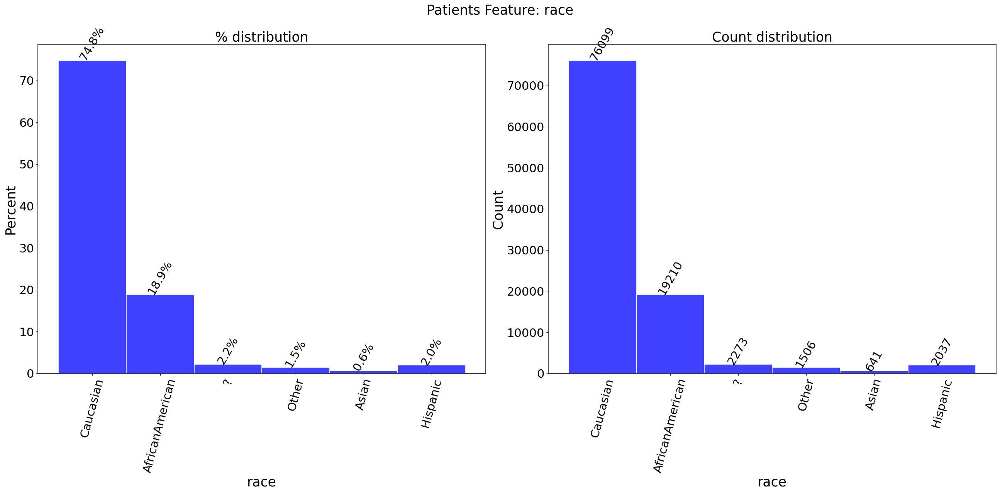

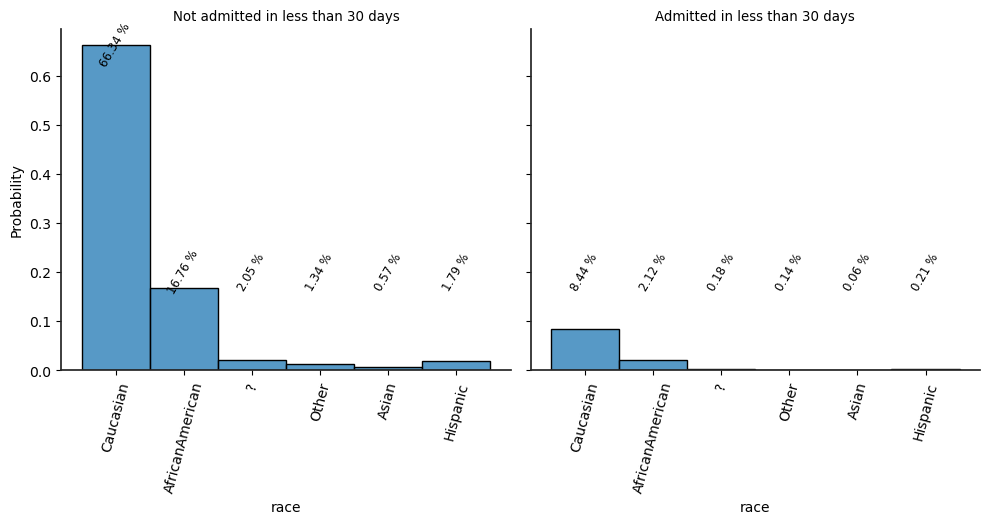

In [18]:
catPlotMatrix(patients_records, 'race', 60)

<div class="alert alert-block alert-info">
    <ul>
        <li>Over 90 % patients are Caucasian or African Americans</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>All others patients will be categorized as others. </li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Gender</B>
</div>

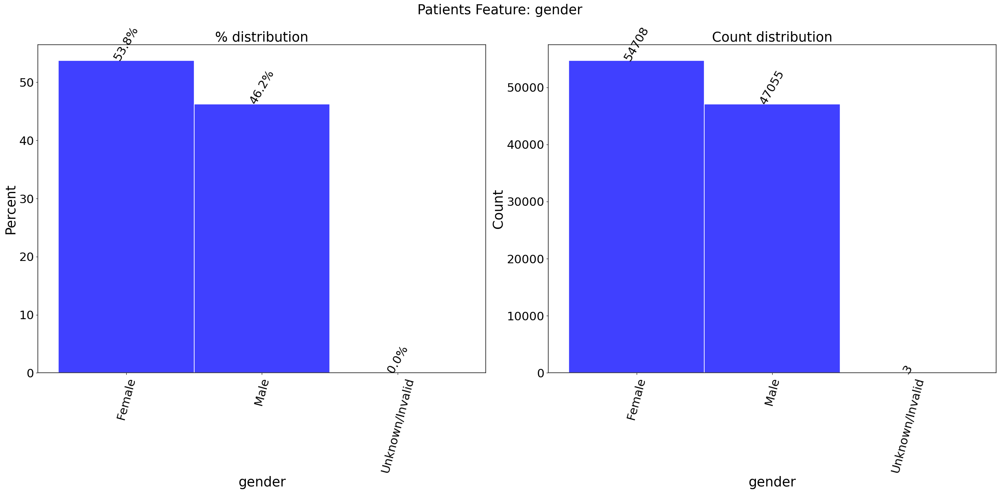

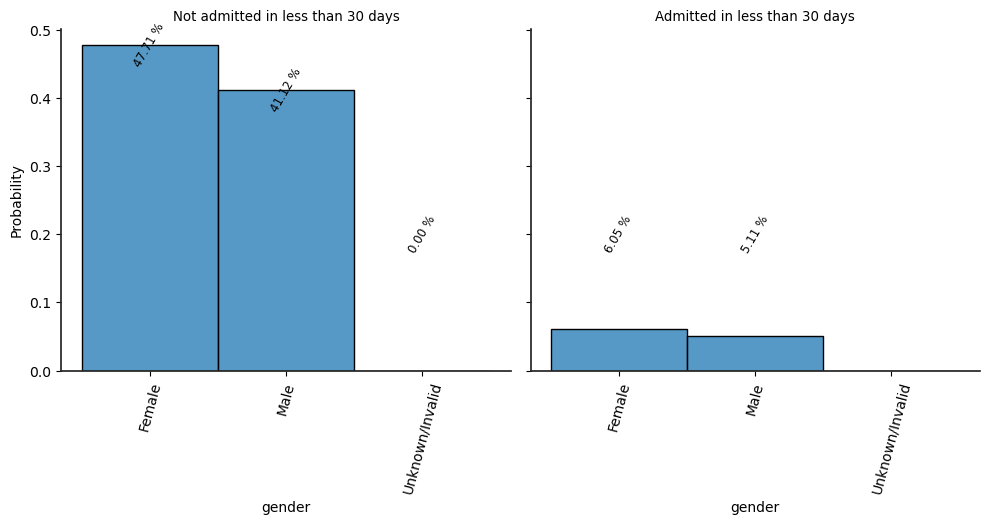

In [19]:
catPlotMatrix(patients_records, 'gender', valueRotation = 60)

<div class="alert alert-block alert-info">
    <ul>
        <li>3 patient with Unknown/Invalid value for gender</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>We can drop these patients records for modelling</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Age</B>
</div>

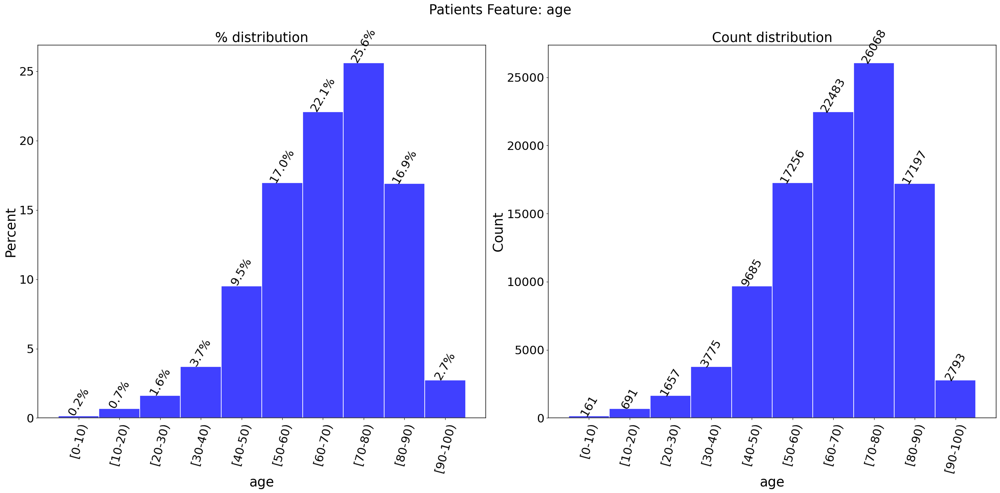

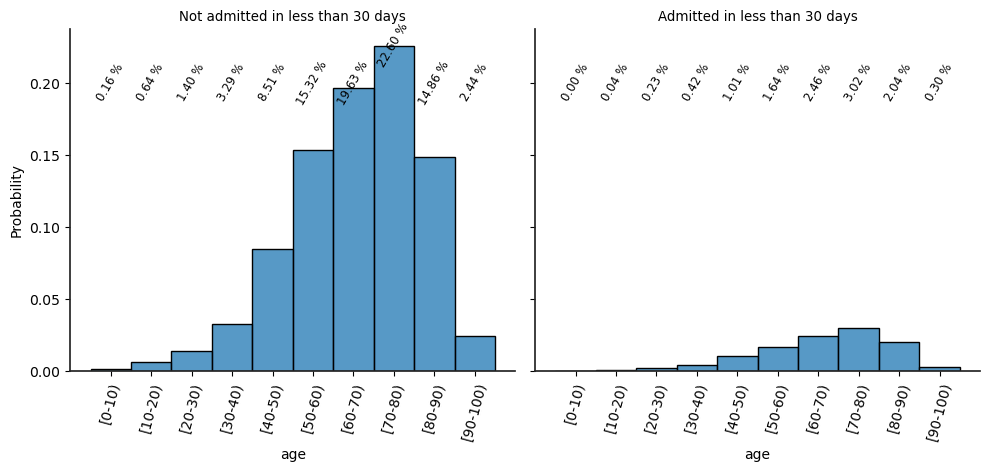

In [20]:
catPlotMatrix(patients_records, 'age')

<div class="alert alert-block alert-info">
    <ul>
        <li>Patients count under 10 is very less</li>
        <li>Patients under 10 admitted in less than 30 days is almost nill</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>Considering dropping patients under 10 year for modelling</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Weight</B>
</div>

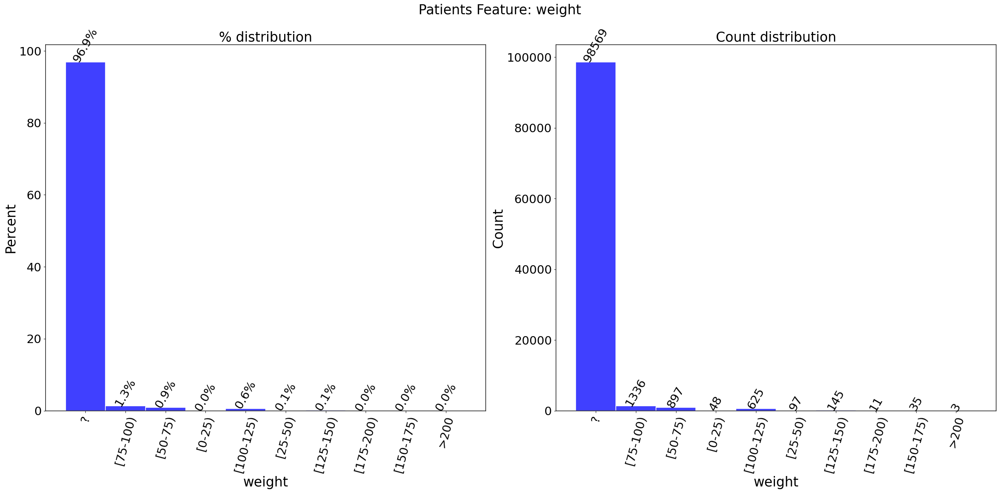

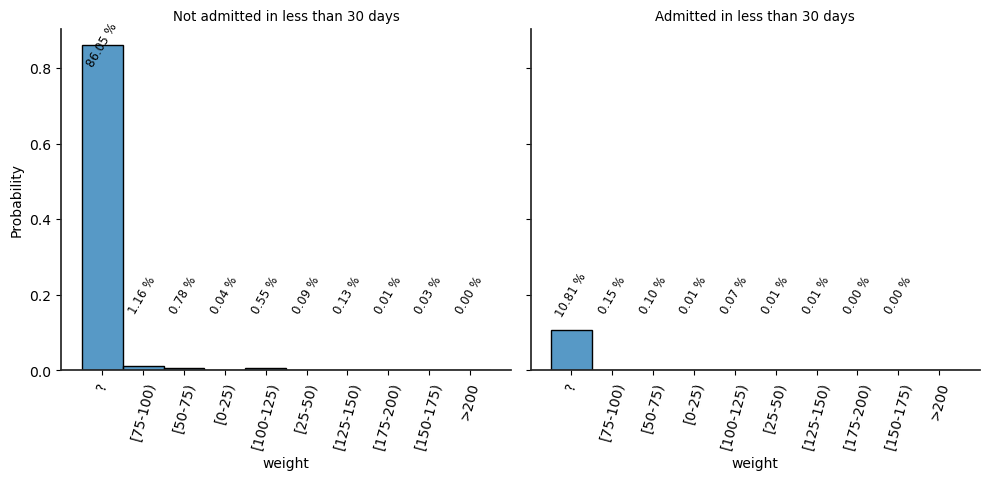

In [21]:
catPlotMatrix(patients_records, 'weight')

<div class="alert alert-block alert-info">
    <ul>
        <li>Weight information is avaiable for less then 3 percent of patients</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>Weight is not a good feature to be used from this data set</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Admission Type - Values are id values, we will use the id values for distribution</B>
</div>

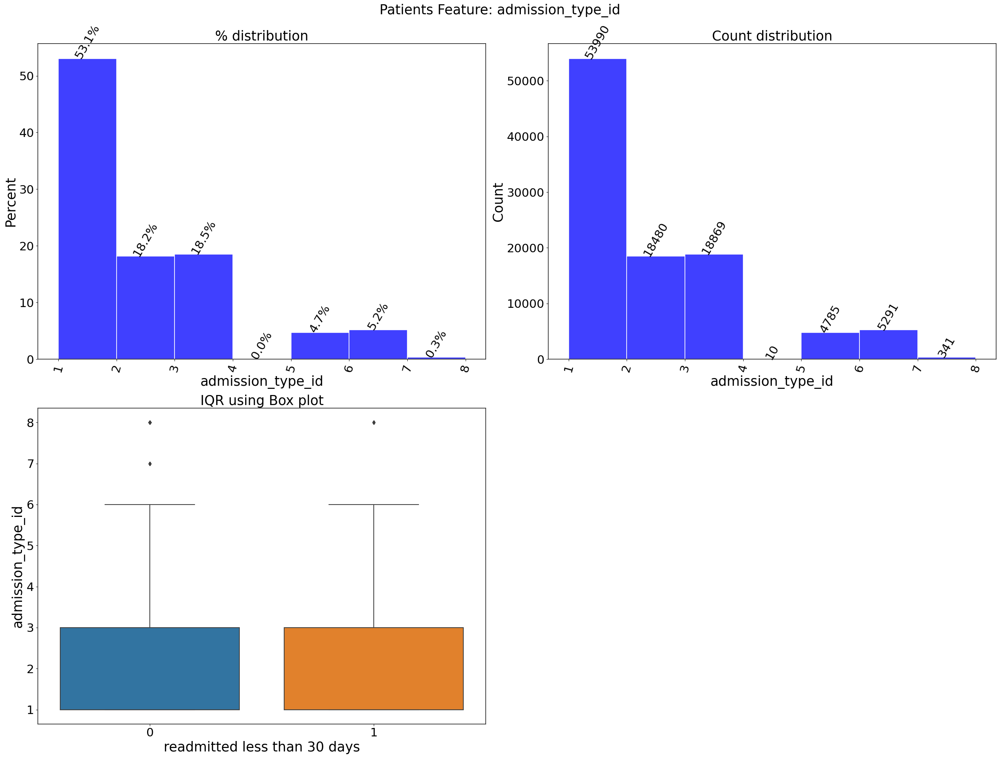

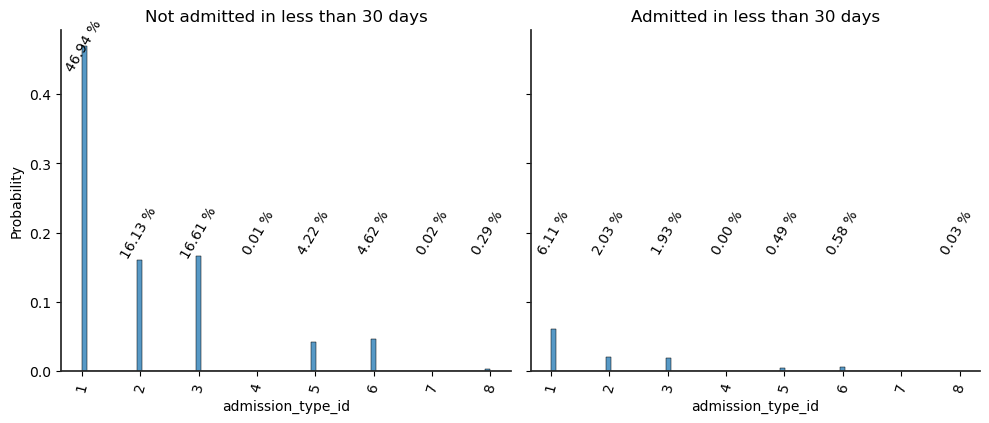

In [22]:
realPlotMatrix(patients_records, 'admission_type_id', 60, binwidth =1)

In [23]:
FeatureStats(patients_records, 'admission_type_id')

   admission_type_id  count      mean  readmitted less than 30 days
0                  1  53990  0.115225                        6221.0
2                  3  18869  0.103927                        1961.0
1                  2  18480  0.111797                        2066.0
5                  6   5291  0.110754                         586.0
4                  5   4785  0.103448                         495.0
7                  8    320  0.084375                          27.0
6                  7     21  0.000000                           0.0
3                  4     10  0.100000                           1.0


,admission_type_id,count,mean,readmitted less than 30 days
0,1,53990,0.115225,6221.0
1,2,18480,0.111797,2066.0
2,3,18869,0.103927,1961.0
3,4,10,0.100000,1.0
4,5,4785,0.103448,495.0
5,6,5291,0.110754,586.0
6,7,21,0.000000,0.0
7,8,320,0.084375,27.0


<div class="alert alert-block alert-info">
    Admission Id to Type Values
    <ul>
         <li>1->Emergency </li>
         <li>2->Urgent </li>
         <li>3->Elective </li>
         <li>4->Newborn </li>
         <li>5->Not Available</li>
         <li>6->NULL </li>
         <li>7->Trauma Center</li>
         <li>8->Not Mapped</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>4 - Newborn, there are only 10 records, we will drop this from the data set for modeling </li>
        <li>7 - Trauma Center, there are only 21 brecords, we will drop this from the data set for modeling </li>
        <li>5 - Not Available, 6 - NULL, 8 - Not Mapped: Indicates value are not available </li>
        <li>The above 3 are close to 10%, so we cannot simply drop them </li>
        <li>With dropping and re-categorizing, we will have 3 values for this feature</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Discharge Dispositiond - Values are id values, we will use the id values for distribution plots</B>
</div>

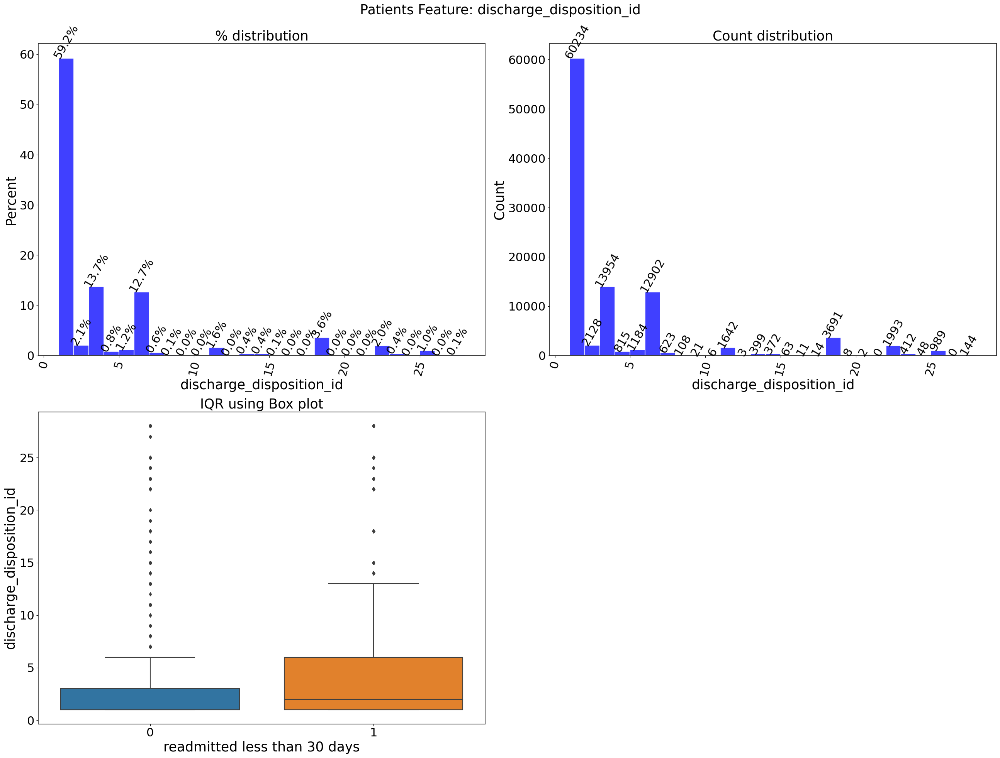

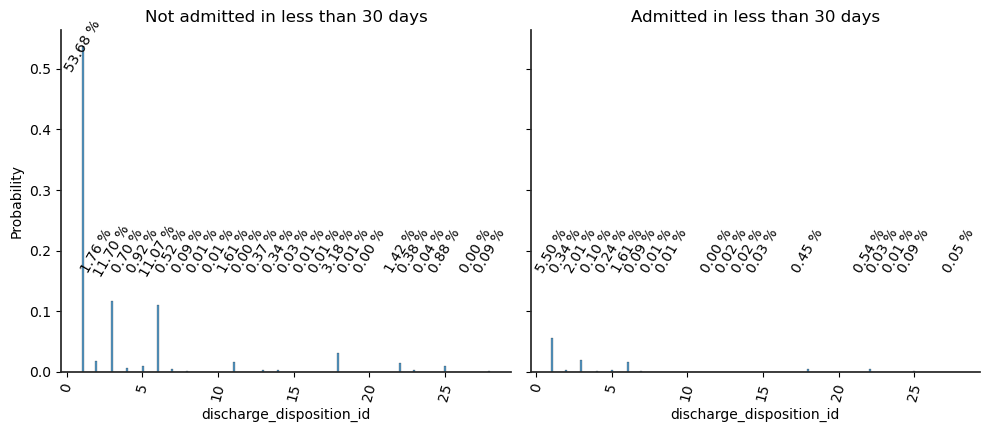

In [24]:
realPlotMatrix(patients_records, 'discharge_disposition_id', 60, binwidth =1)

In [25]:
FeatureStats(patients_records, 'discharge_disposition_id')

    discharge_disposition_id  count      mean  readmitted less than 30 days
0                          1  60234  0.093004                        5602.0
2                          3  13954  0.146625                        2046.0
5                          6  12902  0.126957                        1638.0
17                        18   3691  0.124357                         459.0
1                          2   2128  0.160714                         342.0
20                        22   1993  0.276969                         552.0
10                        11   1642  0.000000                           0.0
4                          5   1184  0.208615                         247.0
23                        25    989  0.093023                          92.0
3                          4    815  0.127607                         104.0
6                          7    623  0.144462                          90.0
21                        23    412  0.072816                          30.0
12          

,discharge_disposition_id,count,mean,readmitted less than 30 days
0,1,60234,0.093004,5602.0
1,2,2128,0.160714,342.0
2,3,13954,0.146625,2046.0
3,4,815,0.127607,104.0
4,5,1184,0.208615,247.0
5,6,12902,0.126957,1638.0
6,7,623,0.144462,90.0
7,8,108,0.138889,15.0
8,9,21,0.428571,9.0
9,10,6,0.000000,0.0


<div class="alert alert-block alert-info">
    Discharge Id to Type Values
    <ul> as
				<li>1->Discharged to home </li>
				<li>2->Discharged/transferred to another short term hospital </li>
				<li>3->Discharged/transferred to SNF </li>
				<li>4->Discharged/transferred to ICF </li>
				<li>5->Discharged/transferred to another type of inpatient care institution </li>
				<li>6->Discharged/transferred to home with home health service </li>
				<li>7->Left AMA </li>
				<li>8->Discharged/transferred to home under care of Home IV provider </li>
				<li>9->Admitted as an inpatient to this hospital </li>
				<li>10->Neonate discharged to another hospital for neonatal aftercare </li>
				<li>11->Expired </li>
				<li>12->Still patient or expected to return for outpatient services </li>
				<li>13->Hospice / home </li>
				<li>14->Hospice / medical facility </li>
				<li>15->Discharged/transferred within this institution to Medicare approved swing bed </li>
				<li>16->Discharged/transferred/referred another institution for outpatient services </li>
				<li>17->Discharged/transferred/referred to this institution for outpatient services </li>
				<li>18->NULL </li>
				<li>19->"Expired at home. Medicaid only-> hospice."</li>
				<li>20->"Expired in a medical facility. Medicaid only-> hospice."</li>
				<li>21->"Expired-> place unknown. Medicaid only-> hospice."</li>
				<li>22->Discharged/transferred to another rehab fac including rehab units of a hospital .</li>
				<li>23->Discharged/transferred to a long term care hospital.</li>
				<li>24->Discharged/transferred to a nursing facility certified under Medicaid but not certified under Medicare.</li>
				<li>25->Not Mapped</li>
				<li>26->Unknown/Invalid</li>
				<li>30->Discharged/transferred to another Type of Health Care Institution not Defined Elsewhere</li>
				<li>27->Discharged/transferred to a federal health care facility.</li>
				<li>28->Discharged/transferred/referred to a psychiatric hospital of psychiatric distinct part unit of a hospital</li>
				<li>29->Discharged/transferred to a Critical Access Hospital (CAH).</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li> 53 % of patients discharged to home</li>
        <li> Discharge Disposition Ids above 15 seems to be outliers. </li>
		<li> Discharge Disposition Ids 11, 19, 20, 21 are expired. </li>
        <li> Do not want to loose the data for expired</li>
        <li> Discharge Disposition Ids 18, 25, 26 do not have a valid value </li>
		<li> All other Ids are Transferred to some other care </li>
		<li> Create a new feature named discharged using this feature and its values</li>
		<li> The new feature will have 4 values: home, expired, referred, other</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Admission Source Id - Values are id values, we will use the id values for distribution plots</B>
</div>

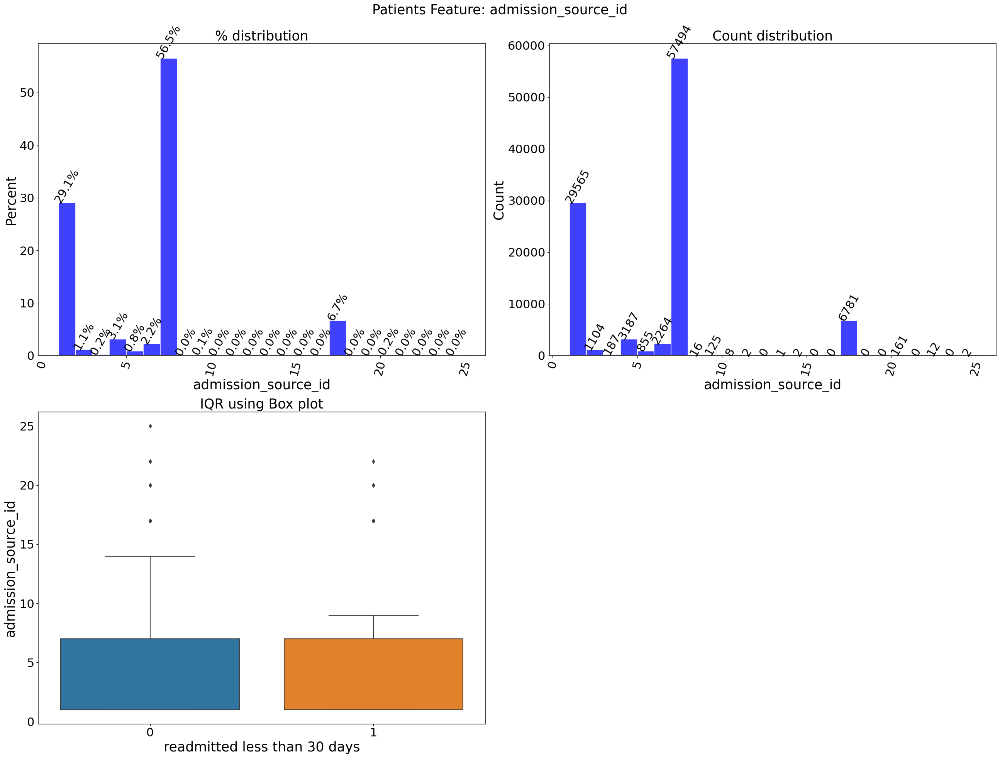

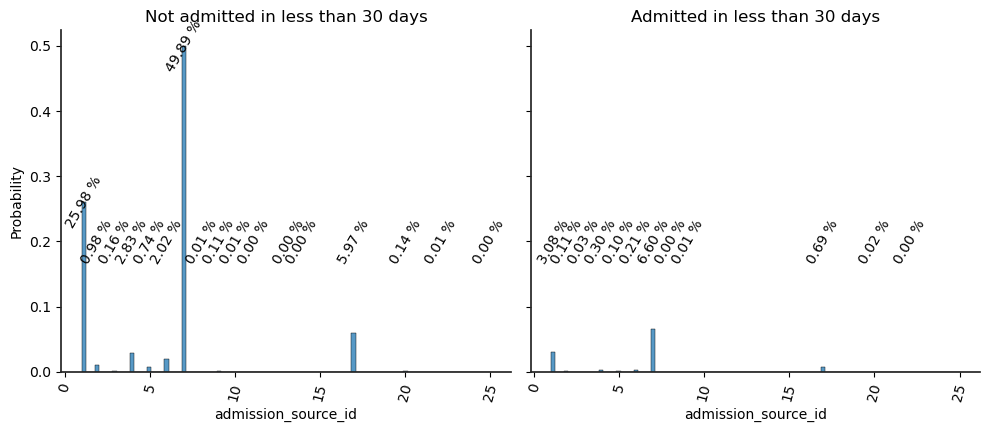

In [26]:
realPlotMatrix(patients_records, 'admission_source_id', 60, binwidth =1)

In [27]:
FeatureStats(patients_records, 'admission_source_id')

    admission_source_id  count      mean  readmitted less than 30 days
6                     7  57494  0.116882                        6720.0
0                     1  29565  0.105868                        3130.0
13                   17   6781  0.104114                         706.0
3                     4   3187  0.096956                         309.0
5                     6   2264  0.093640                         212.0
1                     2   1104  0.100543                         111.0
4                     5    855  0.118129                         101.0
2                     3    187  0.155080                          29.0
14                   20    161  0.136646                          22.0
8                     9    125  0.104000                          13.0
7                     8     16  0.125000                           2.0
15                   22     12  0.166667                           2.0
9                    10      8  0.000000                           0.0
10    

,admission_source_id,count,mean,readmitted less than 30 days
0,1,29565,0.105868,3130.0
1,2,1104,0.100543,111.0
2,3,187,0.155080,29.0
3,4,3187,0.096956,309.0
4,5,855,0.118129,101.0
5,6,2264,0.093640,212.0
6,7,57494,0.116882,6720.0
7,8,16,0.125000,2.0
8,9,125,0.104000,13.0
9,10,8,0.000000,0.0


<div class="alert alert-block alert-info">
    Admission Id to Type Values
    <ul> 
				<li>1-> Physician Referral</li>
				<li>2-> Clinic Referral</li>
				<li>3-> HMO Referral</li>
				<li>4-> Transfer from a hospital</li>
				<li>5-> Transfer from a Skilled Nursing Facility (SNF)</li>
				<li>6-> Transfer from another health care facility</li>
				<li>7-> Emergency Room</li>
				<li>8-> Court/Law Enforcement</li>
				<li>9-> Not Available</li>
				<li>10-> Transfer from critial access hospital</li>
				<li>11-> Normal Delivery</li>
				<li>12-> Premature Delivery</li>
				<li>13-> Sick Baby</li>
				<li>14-> Extramural Birth</li>
				<li>15-> Not Available</li>
				<li>17-> NULL</li>
				<li>18-> Transfer From Another Home Health Agency</li>
				<li>19-> Readmission to Same Home Health Agency</li>
				<li>20-> Not Mapped</li>
				<li>21-> Unknown/Invalid</li>
				<li>22-> Transfer from hospital inpt/same fac reslt in a sep claim</li>
				<li>23-> Born inside this hospital</li>
				<li>24-> Born outside this hospital</li>
				<li>25-> Transfer from Ambulatory Surgery Center</li>
				<li>26-> Transfer from Hospice</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li> 50 % of patients admitted from Emergency Rooms</li>
        <li> 25 % were refered by physicians</li>
		<li> Cant simply drop this as 2/3rd of the data for this features uses only 2 values</li>
        <li> Create a new feature named admission</li>
		<li> The new feature will have 3 values: emergency, physician referral, other</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Time in hospital</B>
</div>

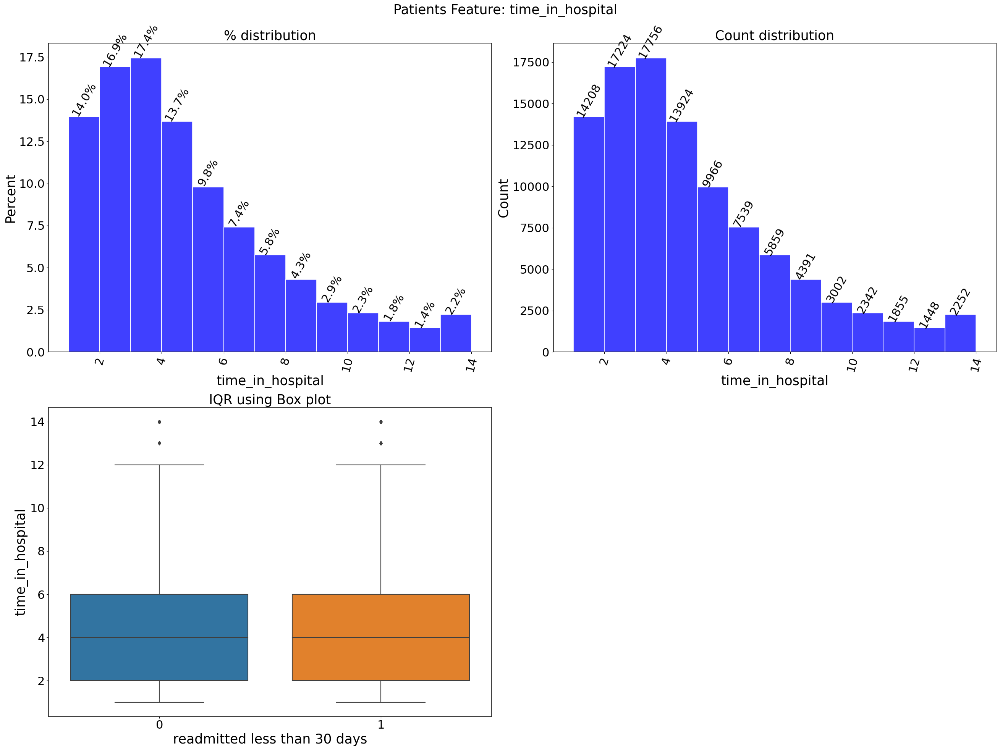

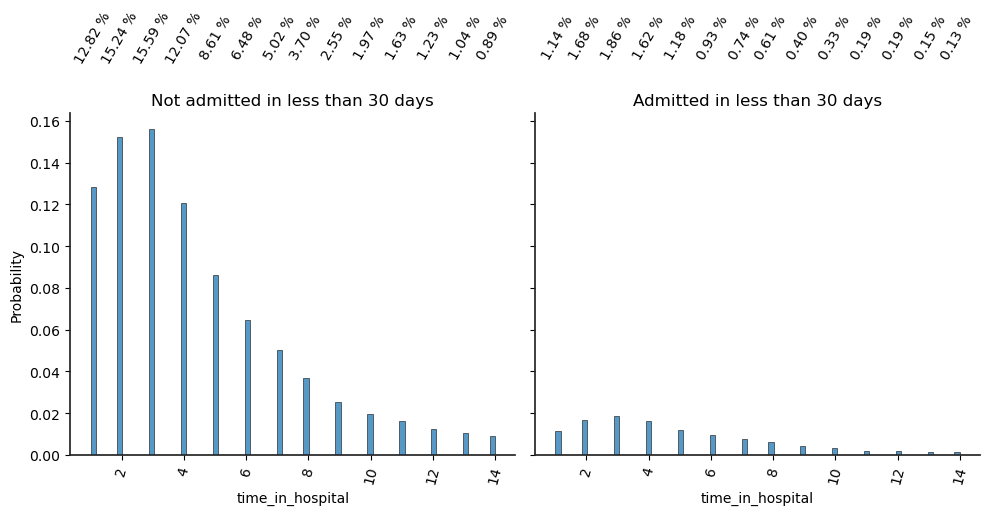

In [28]:
realPlotMatrix(patients_records, 'time_in_hospital', 60, binwidth =1)

<div class="alert alert-block alert-info">
    Admission Id to Type Values
    <ul> 
				<li>IQR indicates days over 12 seems outliers</li>
				<li># days over 12 is around 2 % of data and we dont want to drop</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li> Will not be making any data cleansing for the feature</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Payer Code</B>
</div>

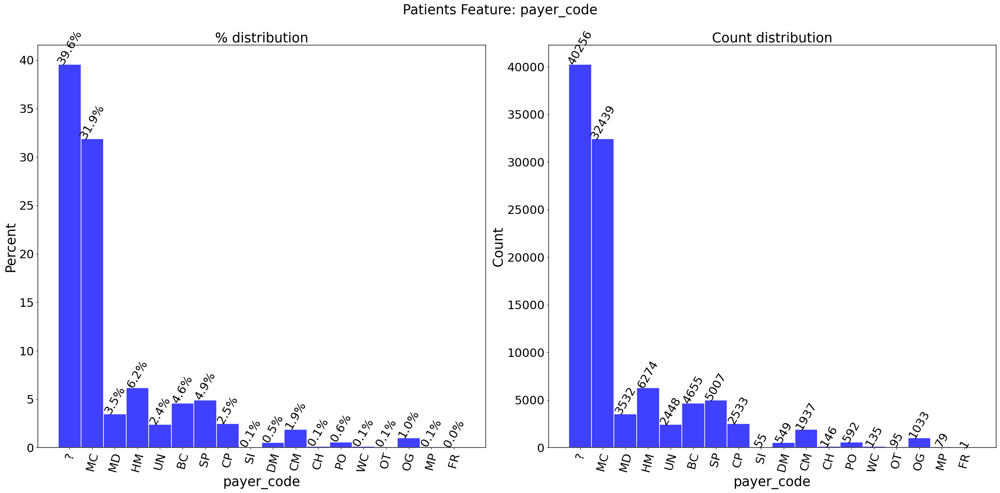

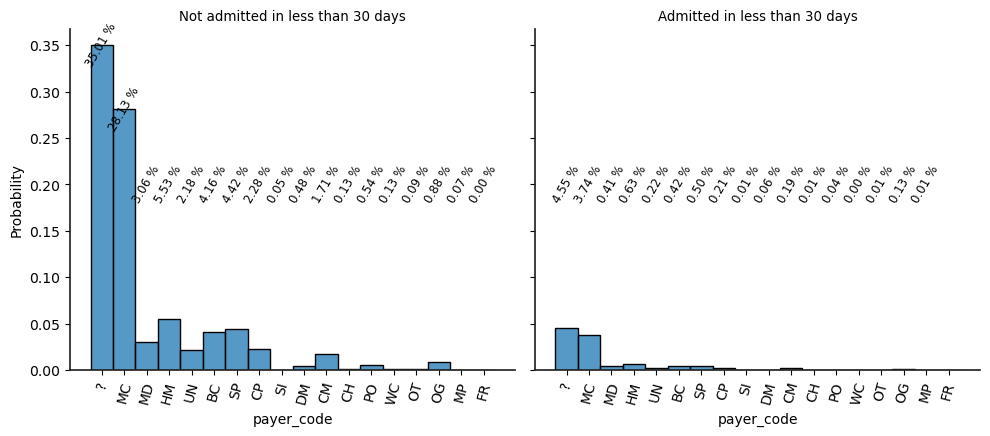

In [29]:
catPlotMatrix(patients_records, 'payer_code')

<div class="alert alert-block alert-info">
    Payer code
    <ul> 
				<li>40 % of data  do not have valid values</li>
				<li>32 % is MC - Medicare</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li> Because of 40% of data does not have valid values, we will drop the feature from modelling.</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Medical Specialty</B>
</div>

In [30]:
msStats = FeatureStats(patients_records, 'medical_specialty')
msStats.head(10)

         medical_specialty  count      mean  readmitted less than 30 days
0                        ?  49949  0.115738                        5781.0
19        InternalMedicine  14635  0.112470                        1646.0
9         Emergency/Trauma   7565  0.111831                         846.0
12  Family/GeneralPractice   7440  0.118683                         883.0
4               Cardiology   5352  0.079410                         425.0
..                     ...    ...       ...                           ...
47              Proctology      1  0.000000                           0.0
49    Psychiatry-Addictive      1  0.000000                           0.0
22         Neurophysiology      1  0.000000                           0.0
58          SportsMedicine      1  0.000000                           0.0
43            Perinatology      1  0.000000                           0.0

[73 rows x 4 columns]


,medical_specialty,count,mean,readmitted less than 30 days
0,?,49949,0.115738,5781.0
1,AllergyandImmunology,7,0.428571,3.0
2,Anesthesiology,12,0.083333,1.0
3,Anesthesiology-Pediatric,19,0.052632,1.0
4,Cardiology,5352,0.079410,425.0
5,Cardiology-Pediatric,7,0.142857,1.0
6,DCPTEAM,6,0.000000,0.0
7,Dentistry,4,0.000000,0.0
8,Dermatology,1,0.000000,0.0
9,Emergency/Trauma,7565,0.111831,846.0


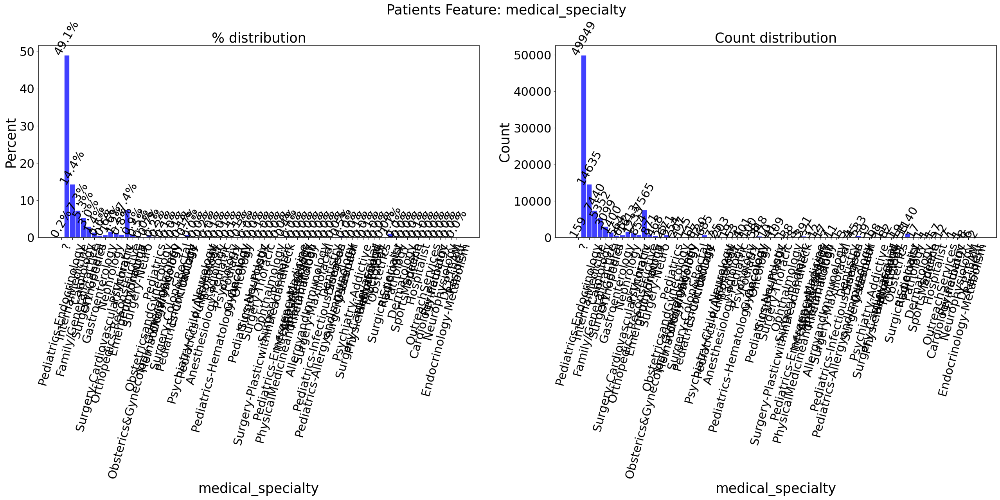

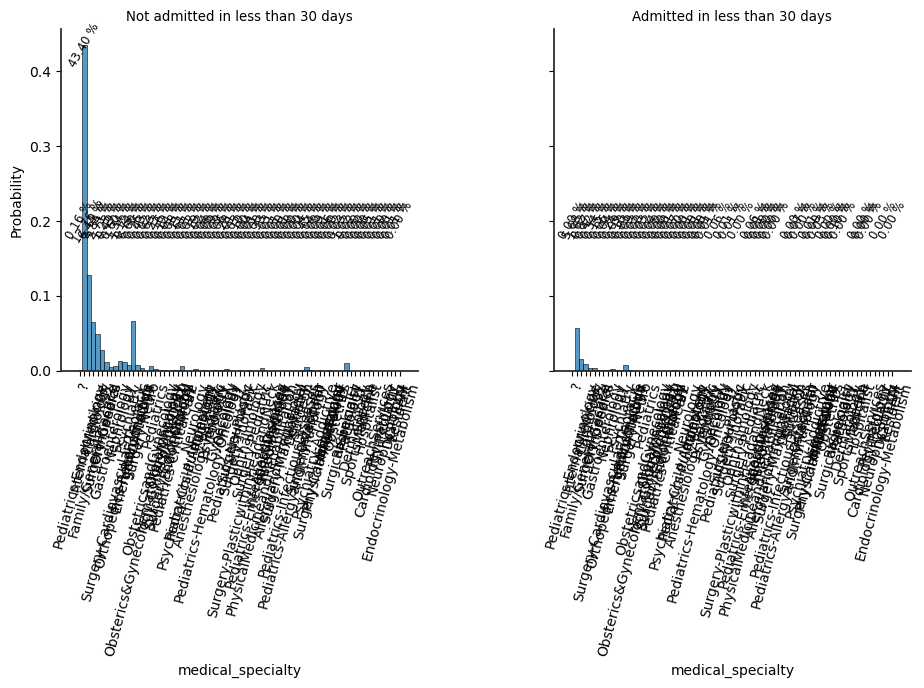

In [31]:
catPlotMatrix(patients_records, 'medical_specialty')

<div class="alert alert-block alert-info">
    Medical Specialty
    <ul> 
				<li>Close to 50 % of data do not have valid values</li>
				<li>72 different values</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li> Because of 50% of data does not have valid values, we will drop the feature from modelling.</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Number of Lab Procedures</B>
</div>

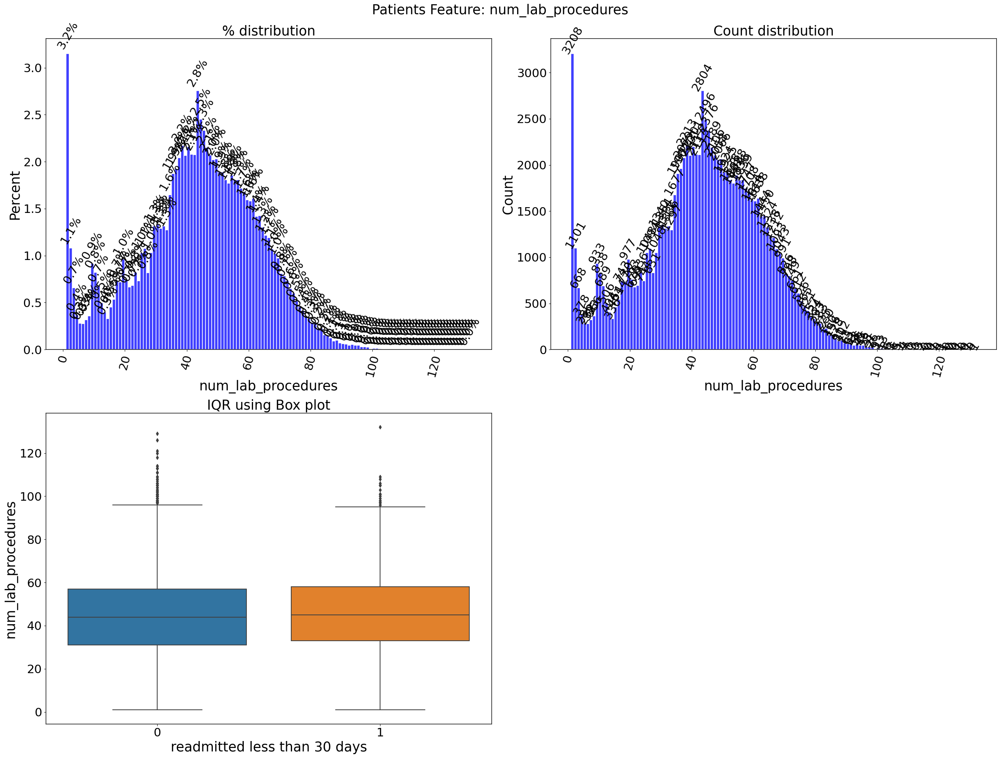

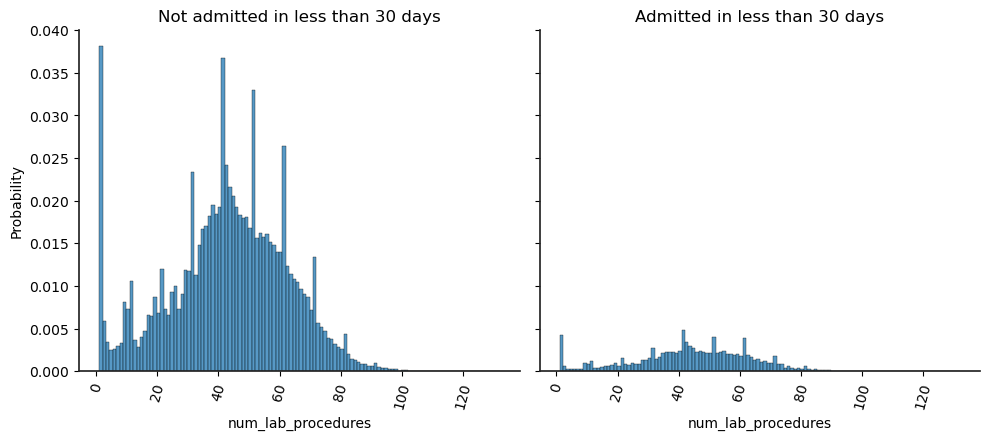

In [32]:
realPlotMatrix(patients_records, 'num_lab_procedures', 60, binwidth =1, showBarValues = False)

In [33]:
FeatureStats(patients_records, 'num_lab_procedures')

     num_lab_procedures  count      mean  readmitted less than 30 days
0                     1   3208  0.094140                         302.0
42                   43   2804  0.124465                         349.0
43                   44   2496  0.118990                         297.0
44                   45   2376  0.118266                         281.0
37                   38   2213  0.101672                         225.0
..                  ...    ...       ...                           ...
113                 120      1  0.000000                           0.0
114                 121      1  0.000000                           0.0
115                 126      1  0.000000                           0.0
116                 129      1  0.000000                           0.0
117                 132      1  1.000000                           1.0

[118 rows x 4 columns]


,num_lab_procedures,count,mean,readmitted less than 30 days
0,1,3208,0.094140,302.0
1,2,1101,0.114441,126.0
2,3,668,0.094311,63.0
3,4,378,0.063492,24.0
4,5,286,0.094406,27.0
...,...,...,...,...
113,120,1,0.000000,0.0
114,121,1,0.000000,0.0
115,126,1,0.000000,0.0
116,129,1,0.000000,0.0


<div class="alert alert-block alert-info">
    Number of Lab Procedures
    <ul> 
				<li>Patients have at least 1 procedure done</li>
				<li>Most patients seems to have got around 45 lab procedures</li>
                <li>Procedures over 98 seems out liers</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>Number of lab procedures over 98 seems outlier and will will drop patient records with more than 98 procedures from modelling.</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Number of Procedures</B>
</div>

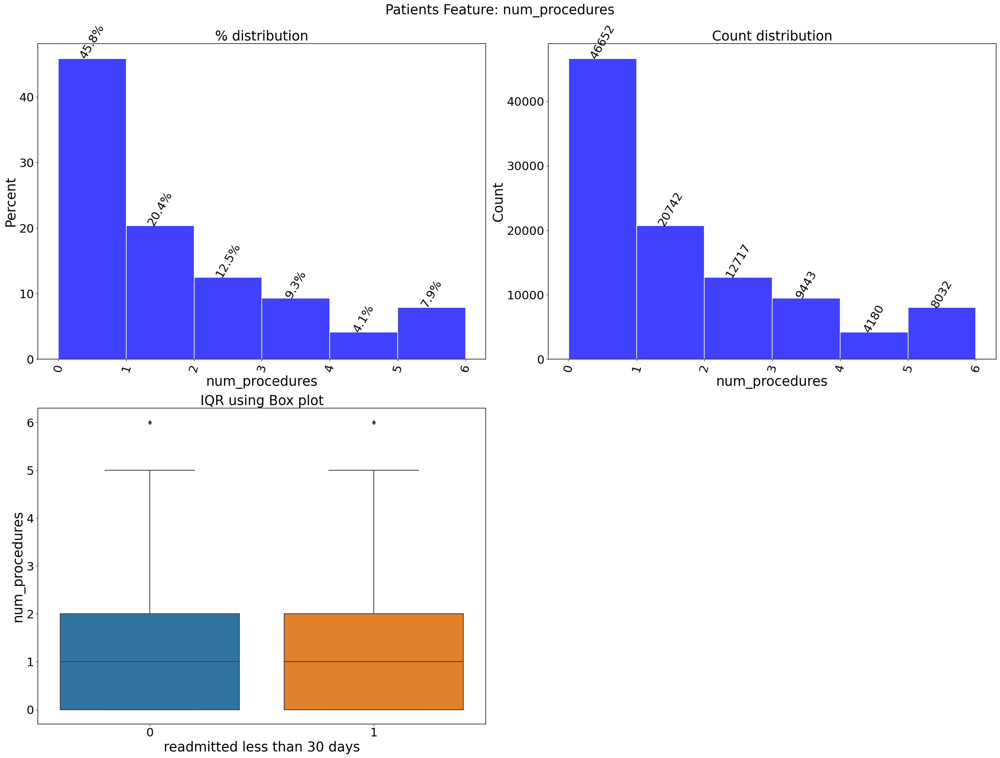

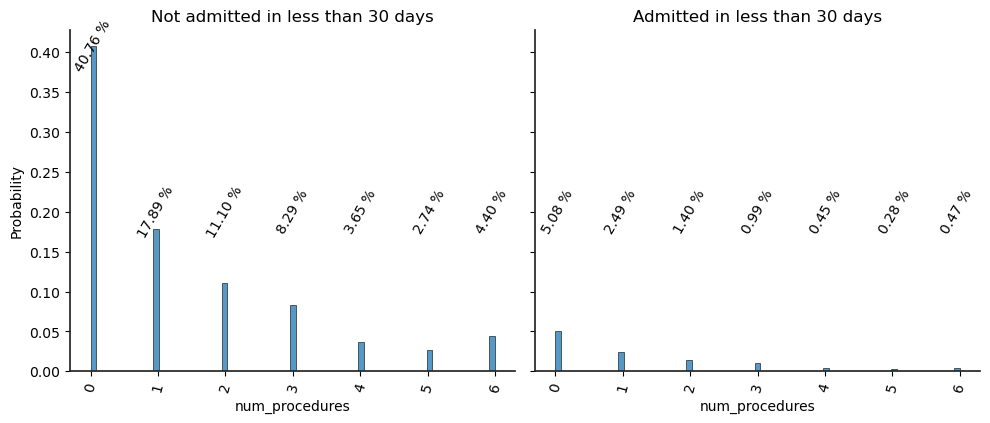

In [34]:
realPlotMatrix(patients_records, 'num_procedures', 60, binwidth =1)

In [35]:
FeatureStats(patients_records, 'num_procedures')

   num_procedures  count      mean  readmitted less than 30 days
0               0  46652  0.110778                        5168.0
1               1  20742  0.122071                        2532.0
2               2  12717  0.111819                        1422.0
3               3   9443  0.106852                        1009.0
6               6   4954  0.095882                         475.0
4               4   4180  0.110287                         461.0
5               5   3078  0.094217                         290.0


,num_procedures,count,mean,readmitted less than 30 days
0,0,46652,0.110778,5168.0
1,1,20742,0.122071,2532.0
2,2,12717,0.111819,1422.0
3,3,9443,0.106852,1009.0
4,4,4180,0.110287,461.0
5,5,3078,0.094217,290.0
6,6,4954,0.095882,475.0


<div class="alert alert-block alert-info">
    Number of Procedures
    <ul> 
				<li>40 % of patients have no procedure performed</li>
				<li>IQR indicates 6 procedures might be outliers</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>IQR indicates that 6 procedures could be outlier, about 5% of patients had 6 procedures</li>
        <li>No changes will be done for this data</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Number of Medications</B>
</div>

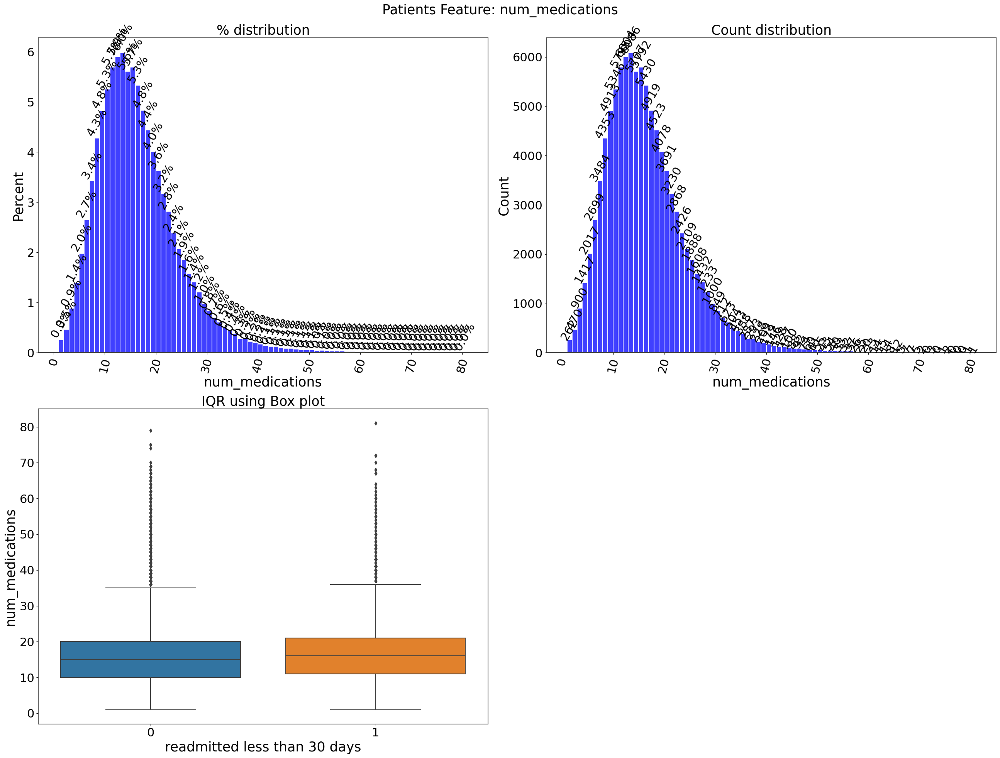

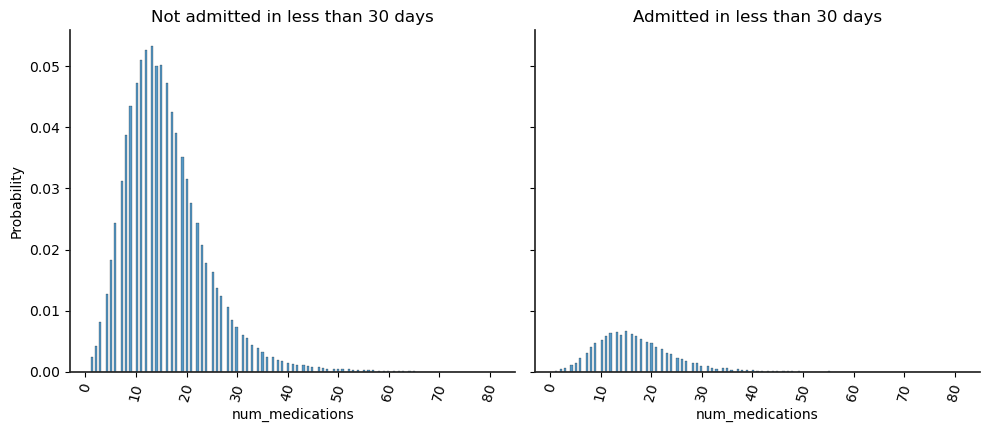

In [36]:
realPlotMatrix(patients_records, 'num_medications', 60, binwidth =1, showBarValues = False)

In [37]:
nmStats = FeatureStats(patients_records, 'num_medications', printStats = False)
nmStats.iloc[30:50]

,num_medications,count,mean,readmitted less than 30 days
30,31,712,0.130618,93.0
31,32,623,0.109149,68.0
32,33,504,0.099206,50.0
33,34,453,0.141280,64.0
34,35,388,0.164948,64.0
35,36,287,0.125436,36.0
36,37,293,0.153584,45.0
37,38,228,0.135965,31.0
38,39,209,0.105263,22.0
39,40,179,0.134078,24.0


<div class="alert alert-block alert-info">
    Number of Medications
    <ul> 
				<li>Most patients had 20 to 30 medications</li>
				<li>IQR indicates over 35 medications might be outliers</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>Looking at the other graphs, will drop patients records with 40 or over medications</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Number of diagnoses entered in to the system</B>
</div>

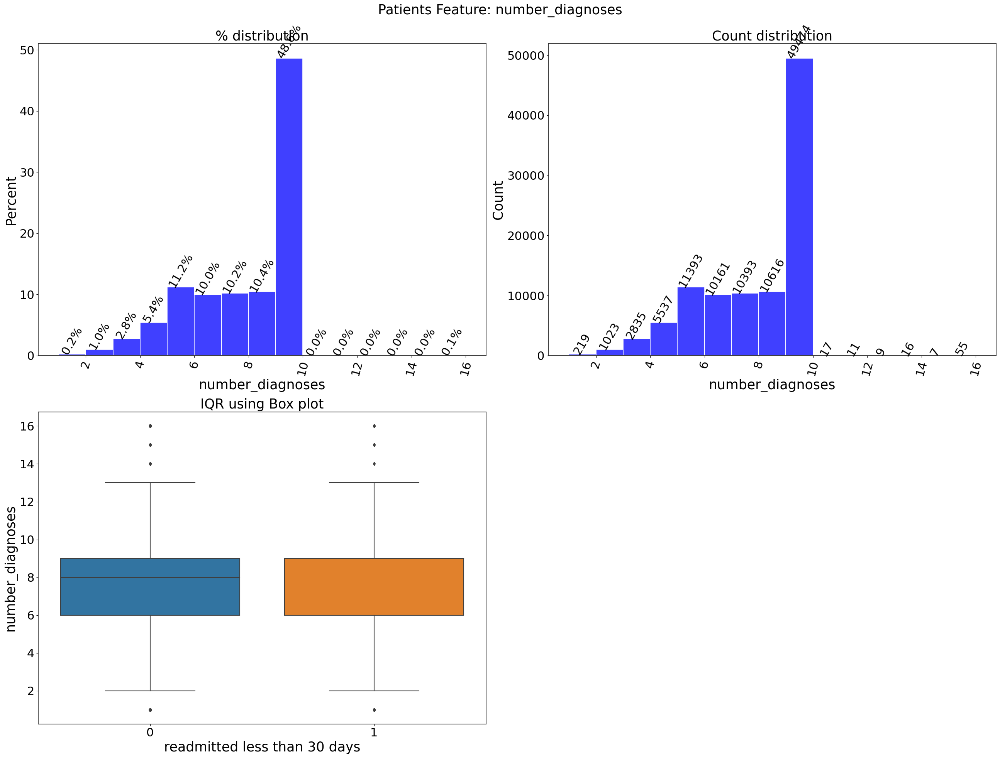

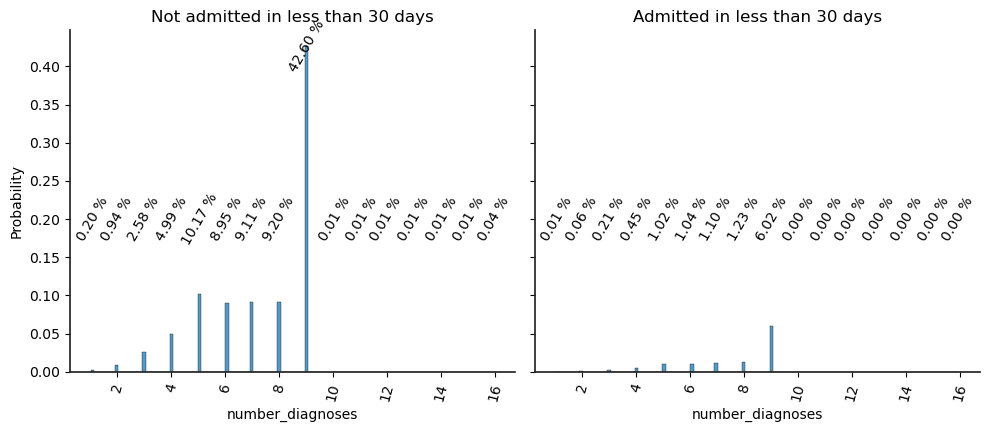

In [38]:
realPlotMatrix(patients_records, 'number_diagnoses', 60, binwidth =1, showBarValues = True)

In [39]:
noStats = FeatureStats(patients_records, 'number_diagnoses', printStats = False)
noStats.head(20)

,number_diagnoses,count,mean,readmitted less than 30 days
0,1,219,0.059361,13.0
1,2,1023,0.060606,62.0
2,3,2835,0.073721,209.0
3,4,5537,0.082536,457.0
4,5,11393,0.091547,1043.0
5,6,10161,0.104124,1058.0
6,7,10393,0.107669,1119.0
7,8,10616,0.118124,1254.0
8,9,49474,0.123802,6125.0
9,10,17,0.176471,3.0


<div class="alert alert-block alert-info">
    Number of Diagnoses entered in to the system
    <ul> 
				<li>50% of patients have 9 Diagnoses entered in to the system</li>
				<li>Number of Diagnoses below 2 and above 9 looks outliers</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>For this feature, we will not use the patients records with diagnoses - 1 or above 9</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Number of Outpatient visits in the last 1 year</B>
</div>

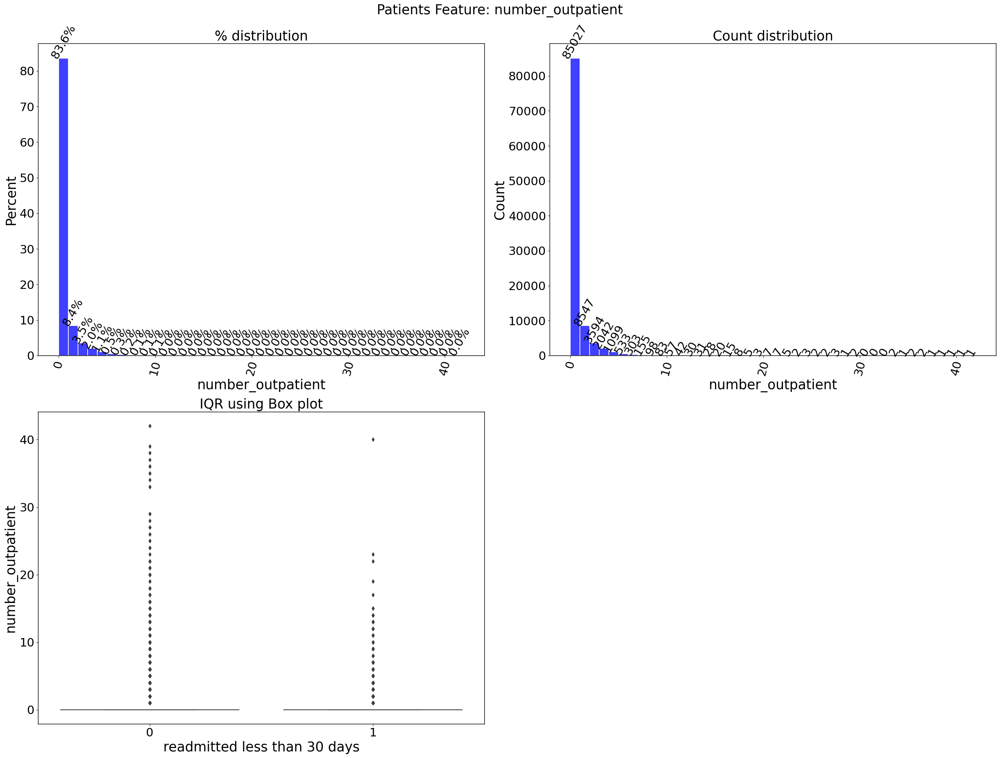

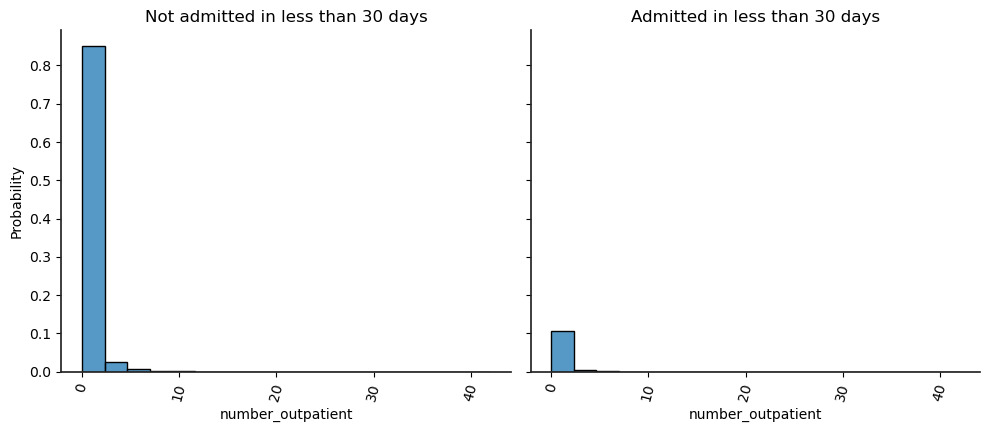

In [40]:
realPlotMatrix(patients_records, 'number_outpatient', 60, binwidth =1, showBarValues = False)

<div class="alert alert-block alert-info">
    <B>Number of Outpatient visits in the last 1 year</B>
</div>

In [41]:
noStats = FeatureStats(patients_records, 'number_outpatient', printStats = False)
noStats.head(10)

,number_outpatient,count,mean,readmitted less than 30 days
0,0,85027,0.106743,9076.0
1,1,8547,0.139230,1190.0
2,2,3594,0.137451,494.0
3,3,2042,0.122919,251.0
4,4,1099,0.151046,166.0
5,5,533,0.118199,63.0
6,6,303,0.132013,40.0
7,7,155,0.154839,24.0
8,8,98,0.051020,5.0
9,9,83,0.156627,13.0


<div class="alert alert-block alert-info">
    Number of Outpatient vists
    <ul> 
				<li>85 % of patients did not have out patient visits</li>
        <li>Mean (readmitted) is larger for patients with outpatient visits</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>Instead of droping this feature, we will convert this to categorical if the patient had a Outpatient visit or not</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Number of Emergency visits in the last 1 year</B>
</div>

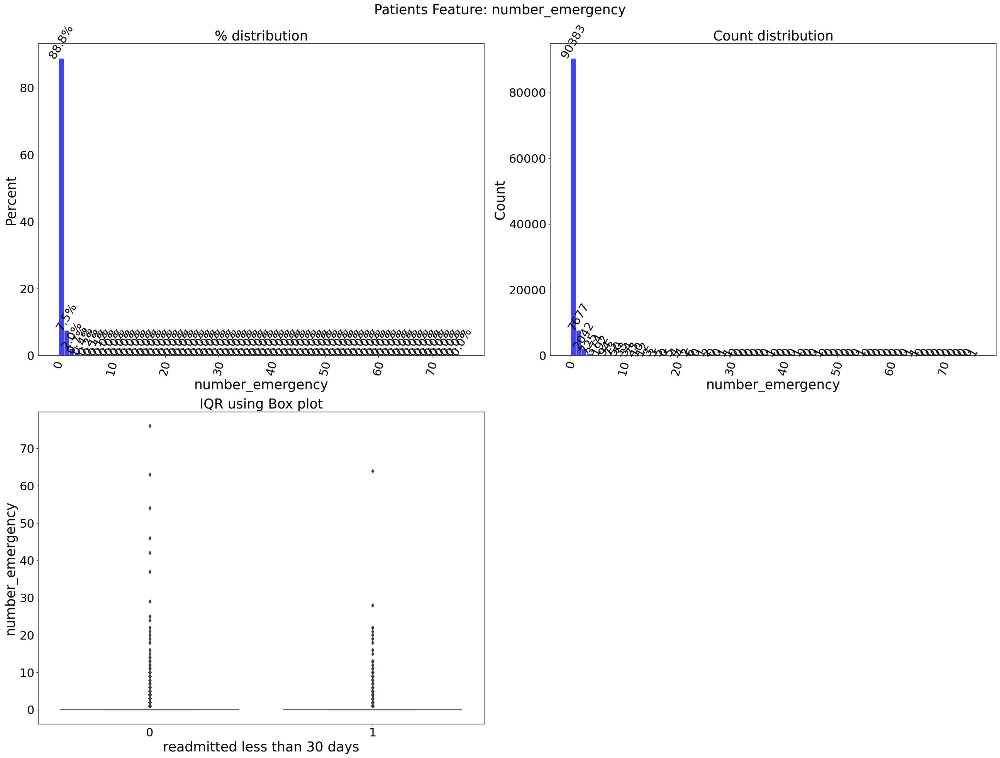

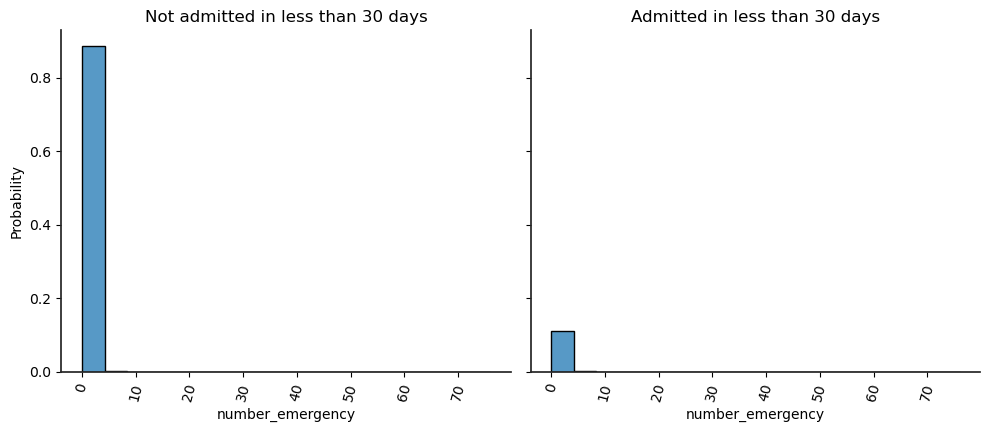

In [42]:
realPlotMatrix(patients_records, 'number_emergency', 60, binwidth =1, showBarValues = False)

In [43]:
noEStats = FeatureStats(patients_records, 'number_emergency', printStats = False)
noEStats.head(10)

,number_emergency,count,mean,readmitted less than 30 days
0,0,90383,0.104743,9467.0
1,1,7677,0.143546,1102.0
2,2,2042,0.182664,373.0
3,3,725,0.202759,147.0
4,4,374,0.307487,115.0
5,5,192,0.244792,47.0
6,6,94,0.234043,22.0
7,7,73,0.260274,19.0
8,8,50,0.320000,16.0
9,9,33,0.363636,12.0


<div class="alert alert-block alert-info">
    Number of Emergency vists
    <ul> 
		<li>90 % of patients did not have emergency visits</li>
        <li>But if vistied the Mean(readmitted) is larger for patients</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>Instead of droping this feature, we will convert this to categorical if the patient had a emergency visit or not</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Number of In Patient visits in the last 1 year</B>
</div>

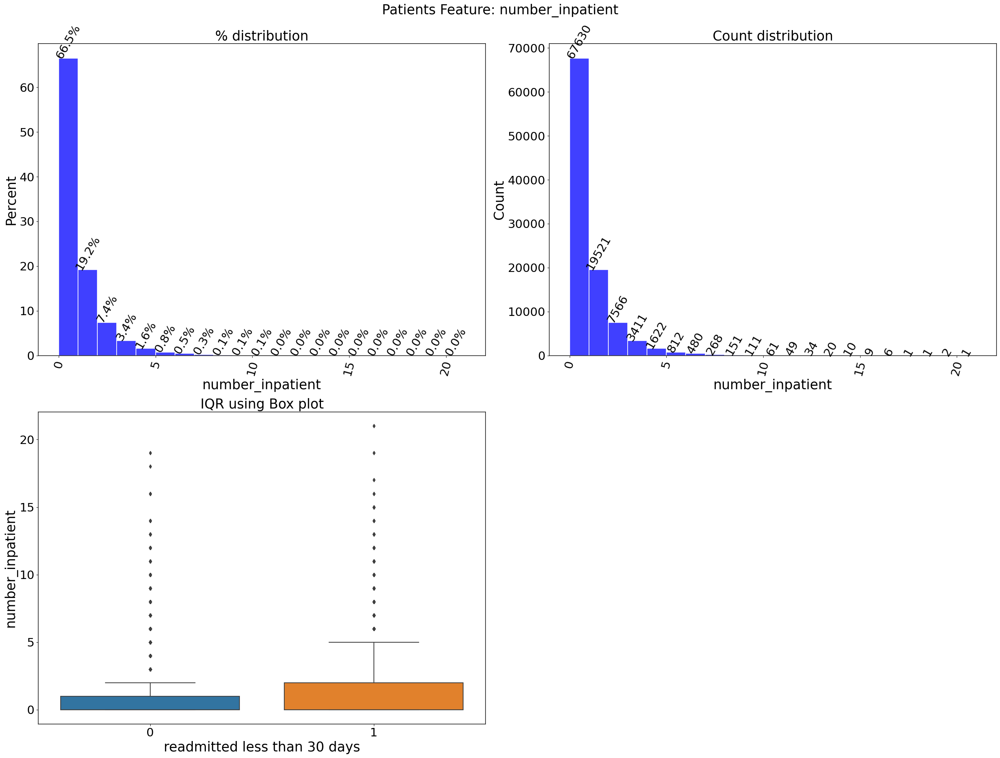

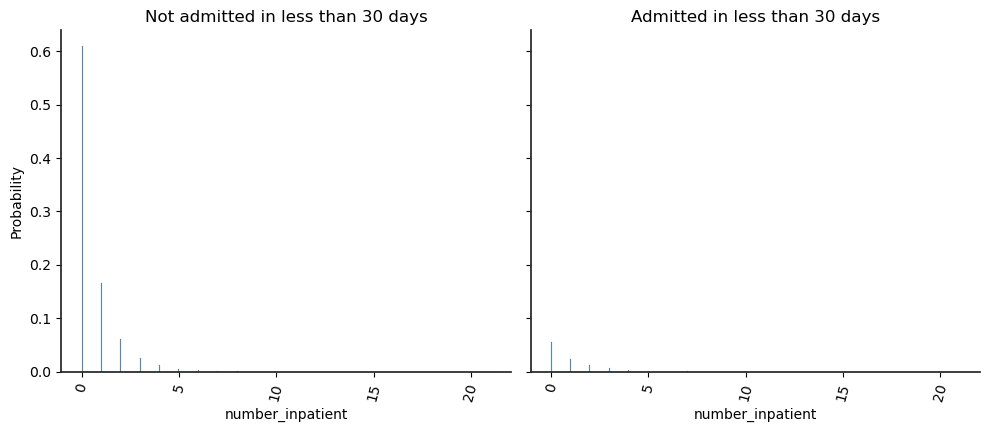

In [44]:
realPlotMatrix(patients_records, 'number_inpatient', 60, binwidth =1, showBarValues = False)

In [45]:
noIStats = FeatureStats(patients_records, 'number_inpatient', printStats = False)
noIStats.head(30)

,number_inpatient,count,mean,readmitted less than 30 days
0,0,67630,0.084371,5706.0
1,1,19521,0.129245,2523.0
2,2,7566,0.174333,1319.0
3,3,3411,0.202873,692.0
4,4,1622,0.236128,383.0
5,5,812,0.314039,255.0
6,6,480,0.345833,166.0
7,7,268,0.354478,95.0
8,8,151,0.443709,67.0
9,9,111,0.423423,47.0


<div class="alert alert-block alert-info">
    Number of Emergency vists
    <ul> 
		<li>60 % of patients did not have in patient visits</li>
        <li>But if vistied the Mean(readmitted) is larger for patients, much larger than outpatient and emergency</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>Convert this to categorical if the patient had a inpatient visit or not</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Maximum Glucose Serum </B>
</div>

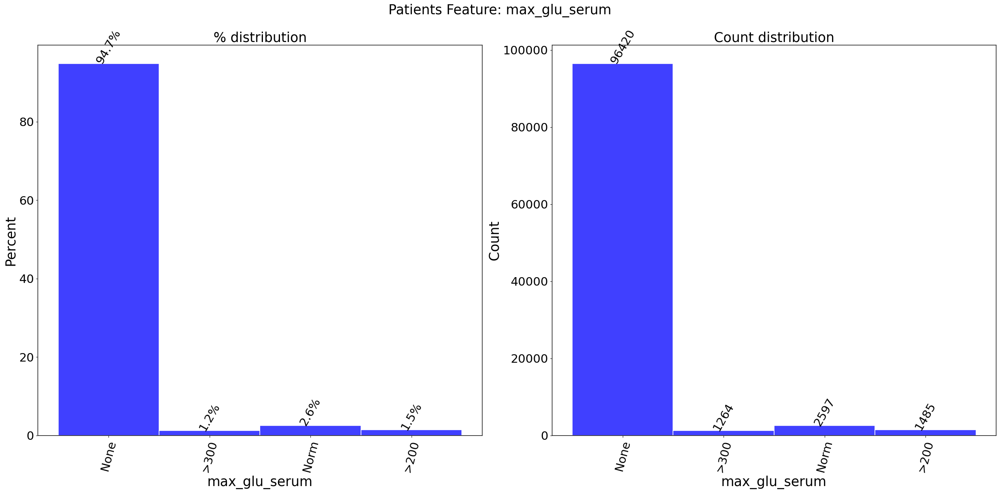

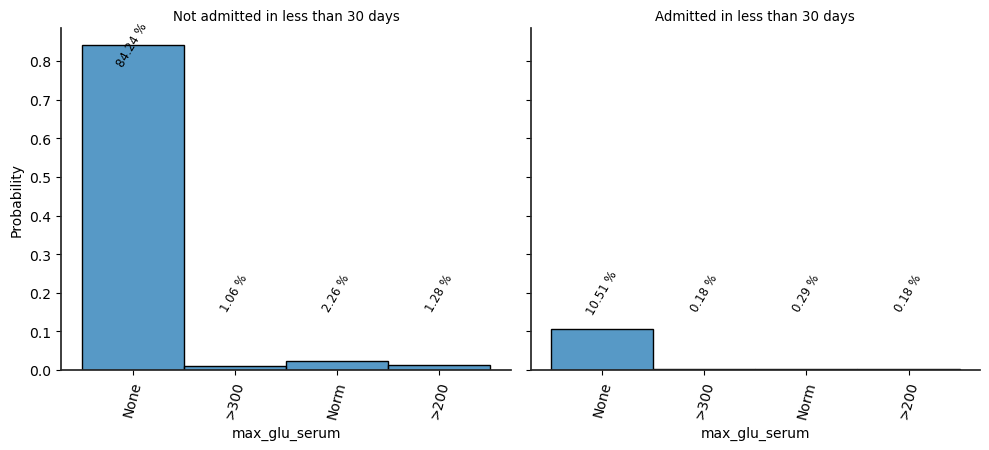

In [46]:
catPlotMatrix(patients_records, 'max_glu_serum')

In [47]:
mgsStats = FeatureStats(patients_records, 'max_glu_serum', printStats = False)
mgsStats

,max_glu_serum,count,mean,readmitted less than 30 days
0,>200,1485,0.124579,185.0
1,>300,1264,0.143196,181.0
2,None,96420,0.110931,10696.0
3,Norm,2597,0.113593,295.0


<div class="alert alert-block alert-info">
    Maximum Glucose Serum
    <ul> 
		<li>95 % of patients did not Clucose Serum tested</li>
        <li>Is this an indicator that the doctors decided that patients do not neeed this test and considered normal?</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>With out real insights or medical knoweledge on why the patients are not tested or simply missing, we cannot come to conclusion of did not test means the results are normal</li>
        <li> Thus we will drop this feature.</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>A1Cresult </B>
</div>

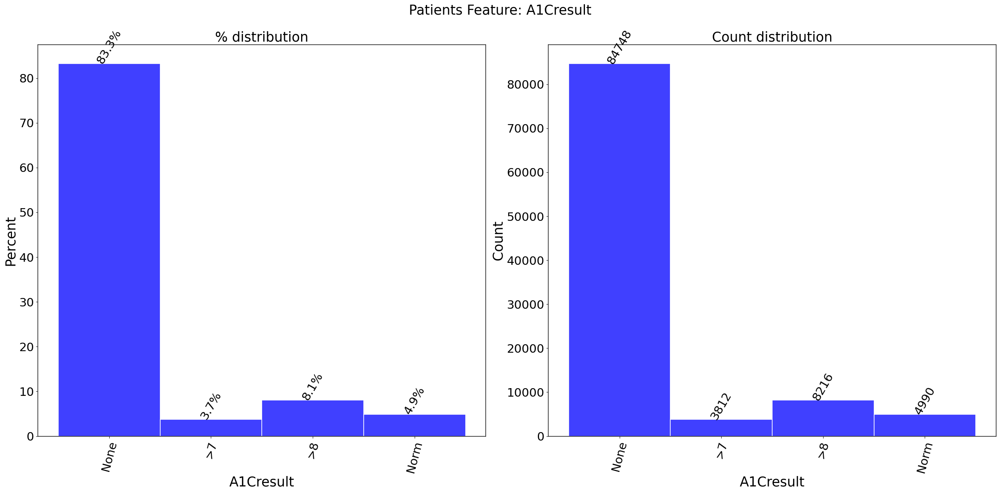

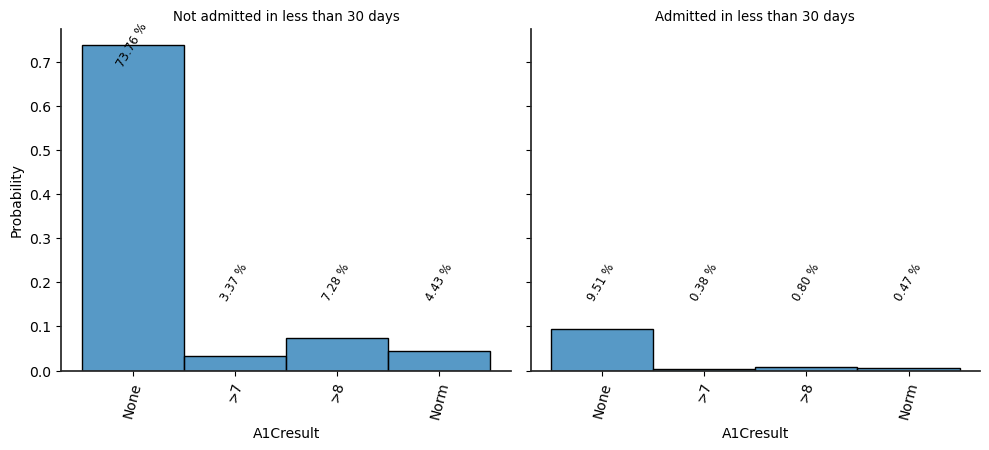

In [48]:
catPlotMatrix(patients_records, 'A1Cresult')

<div class="alert alert-block alert-info">
    A1Cresult
    <ul> 
		<li>85 % of patients did not have A1Cresults tested</li>
        <li>Is this an indicator that the doctors decided that patients do not neeed this test and considered normal?</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>With out real insights or medical knoweledge on why the patients are not tested or simply missing, we cannot come to conclusion of did not test means the results are normal</li>
        <li>Ws thining to drop this feature but feel like might be missing important information and thus thinking to keep this as are dropping the Glucose Serum</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Change in Diabetic Medication</B>
</div>

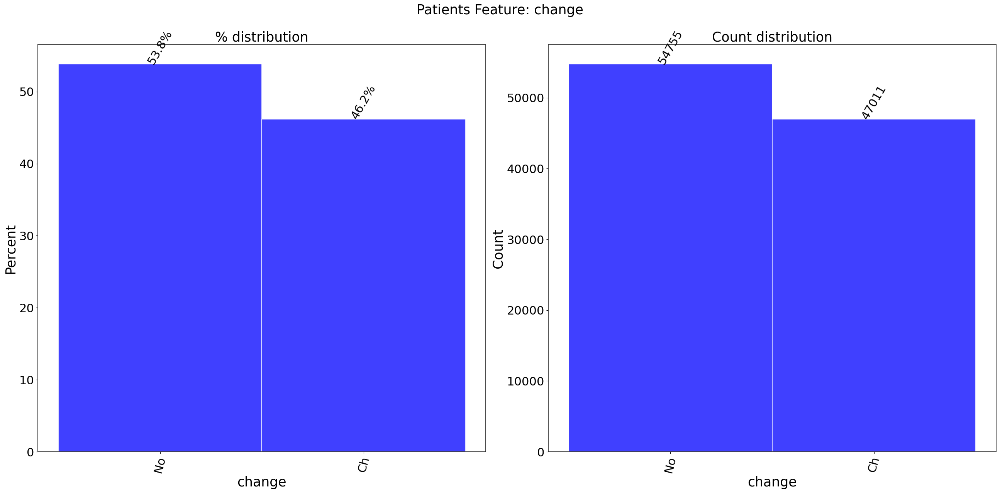

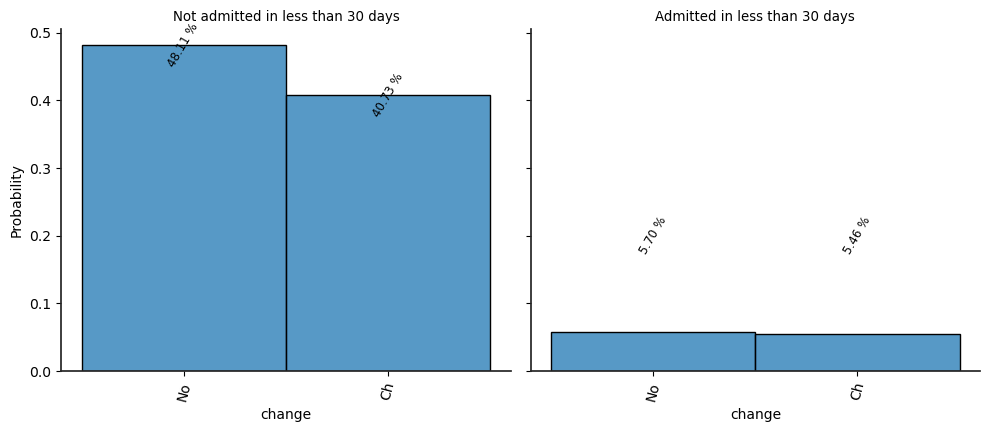

In [49]:
catPlotMatrix(patients_records, 'change')

<div class="alert alert-block alert-info">
    Change in Medication
    <ul> 
		<li>Evenly distributed data</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>No data changes for this feature</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Diabetic Medication prescribed</B>
</div>

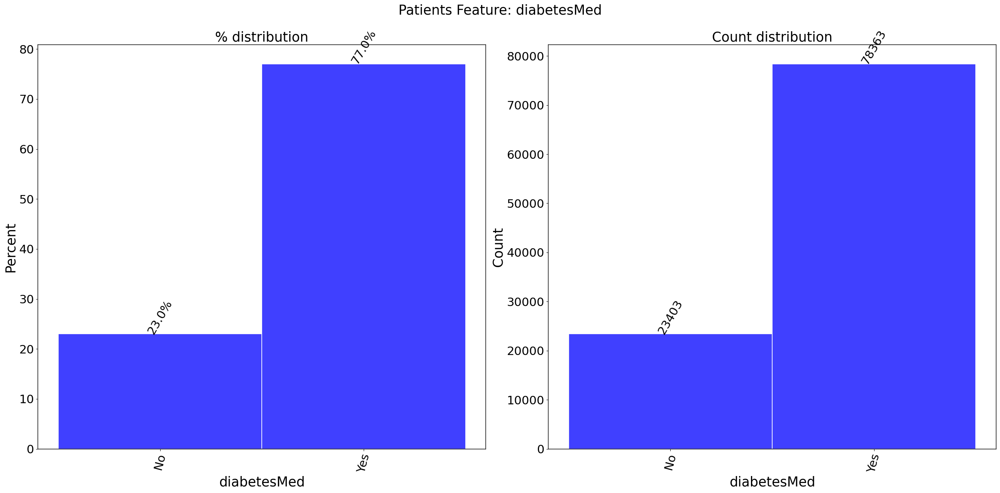

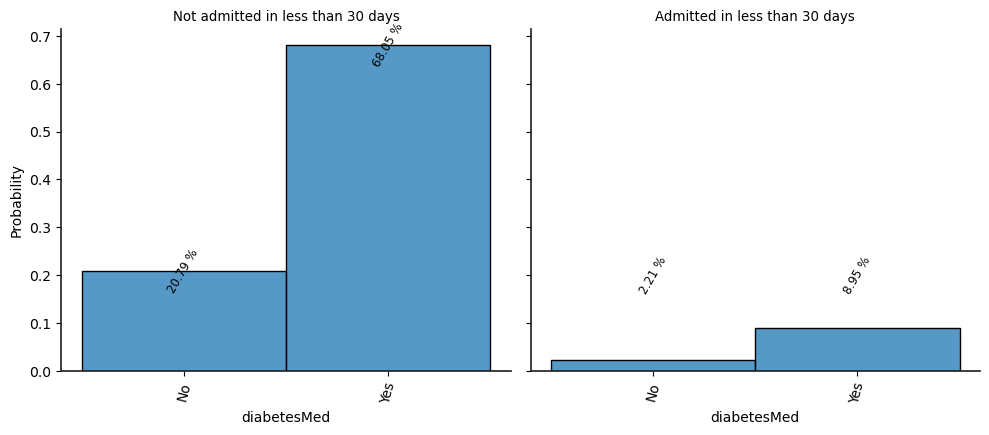

In [50]:
catPlotMatrix(patients_records, 'diabetesMed')

<div class="alert alert-block alert-info">
    Diabetic Medication Prescribed
    <ul> 
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
		<li>No data changes for this feature</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Metformin, Repaglinide, Nateglinide </B>
</div>

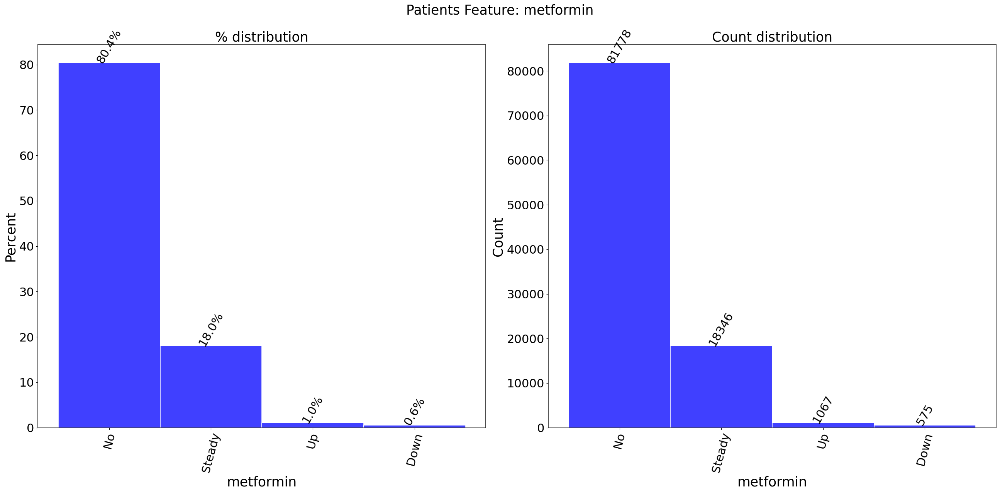

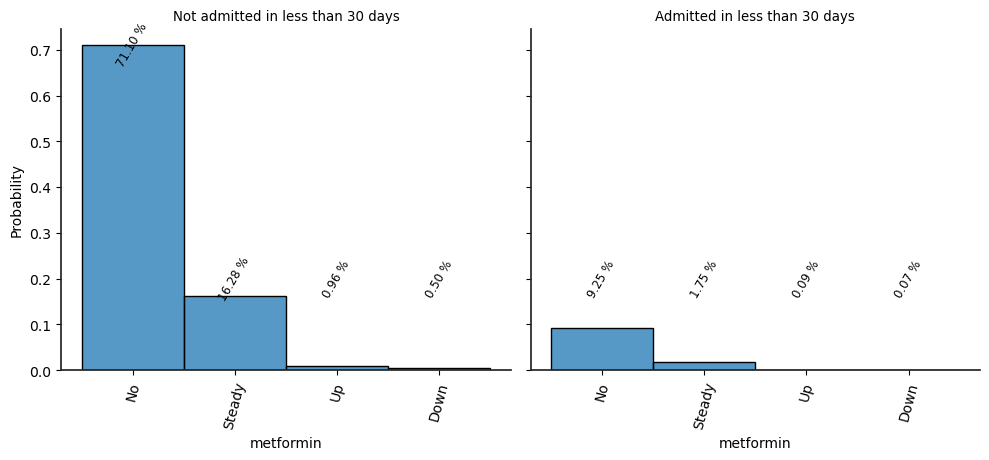

In [51]:
catPlotMatrix(patients_records, 'metformin')

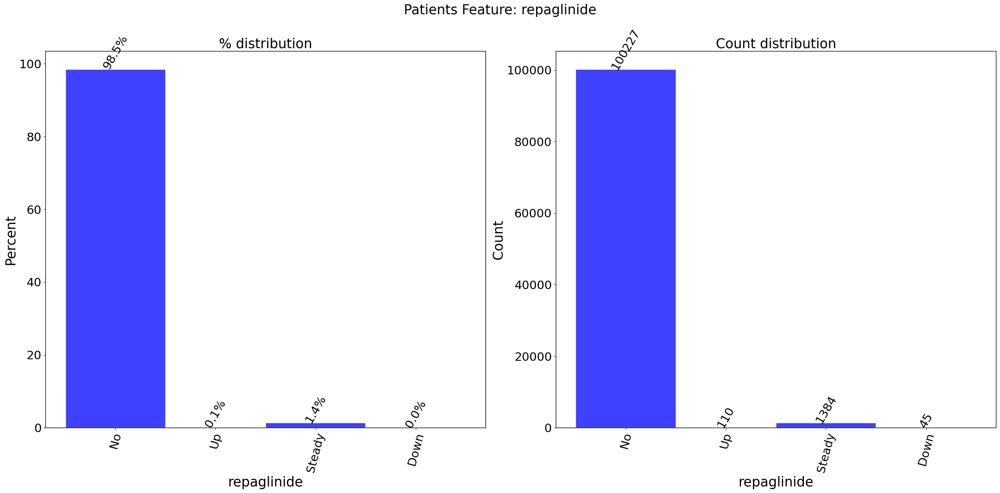

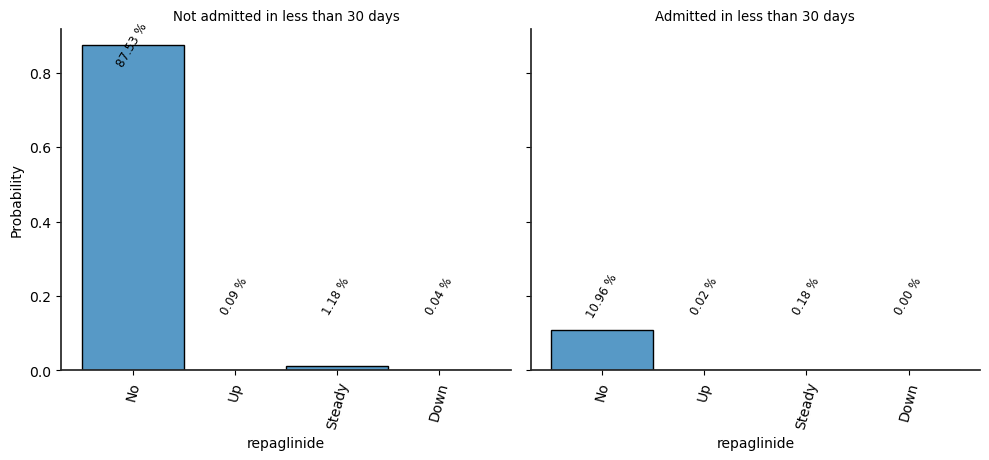

In [52]:
catPlotMatrix(patients_records, 'repaglinide')

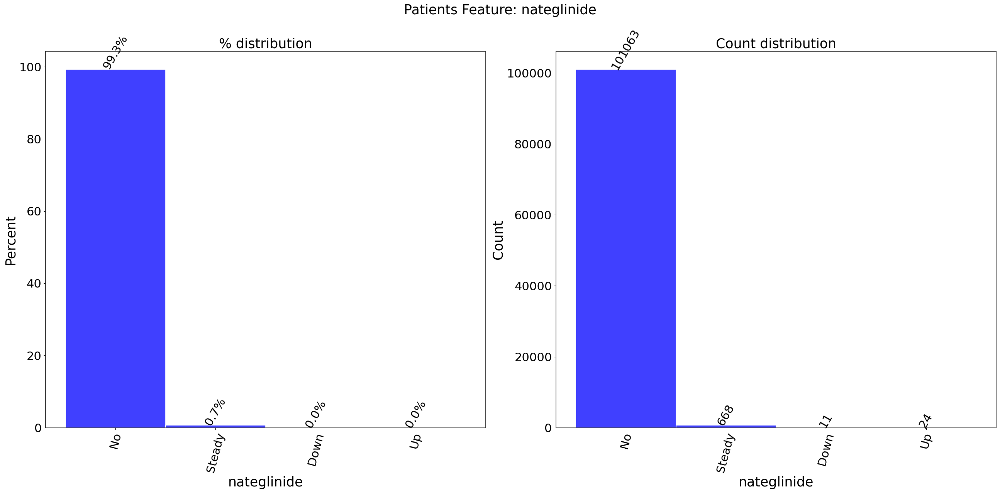

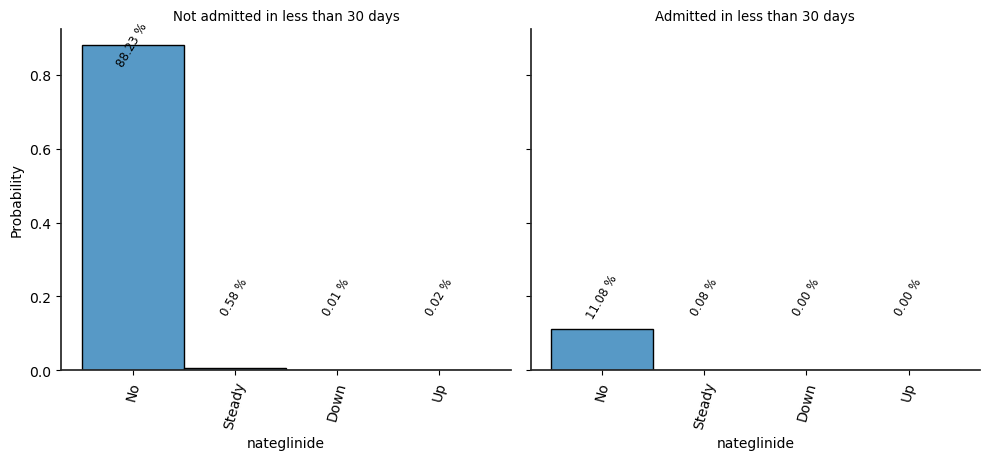

In [53]:
catPlotMatrix(patients_records, 'nateglinide')

<div class="alert alert-block alert-info">
    Medications Used
    <ul> 
		<li>Metformin, Repaglinide, Nateglinide </li>
        <li>A specific medication is not prescribed to most patients</li>
        <li>It evident that not all medication will be prescribed to patients</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>Was considering to Encode these a ordinal using 0 for No, 1 for Down, 2 for Steady a 3 for up</li>
        <li> Medication dosage Up/Down/Steady does not indicate the actuall dosage used, giving a numerical value could -ve impact regression modelling.</li>
        <li>Since volumes medication used are alos so low, will uses this feature as medication used or not</li>  
        <li>The data also included the same information for 20 more medication. Will convert all the medication features to indicate used or not.</li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Patient</B>
</div>

In [54]:
patientIDStats = FeatureStats(patients_records, 'patient_nbr', printStats = False)
patientIDStats.sort_values(by=['count'], ascending=False)

,patient_nbr,count,mean,readmitted less than 30 days
54474,88785891,40,0.575000,23.0
32927,43140906,28,0.785714,22.0
3515,1660293,23,0.478261,11.0
17018,23199021,23,0.304348,7.0
54057,88227540,23,0.521739,12.0
...,...,...,...,...
26948,34935156,1,0.000000,0.0
26949,34935795,1,0.000000,0.0
26950,34935804,1,0.000000,0.0
26951,34937658,1,0.000000,0.0


In [55]:
patients_records.loc[patients_records['patient_nbr'] == 88785891]

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,readmitted less than 30 days
38307,119039172,88785891,Caucasian,Female,[20-30),?,1,1,7,1,...,Up,No,No,No,No,No,Ch,Yes,>30,0
40252,125094312,88785891,Caucasian,Female,[20-30),?,1,1,7,1,...,Down,No,No,No,No,No,Ch,Yes,<30,1
40661,126171582,88785891,Caucasian,Female,[20-30),?,1,1,7,5,...,Up,No,No,No,No,No,Ch,Yes,>30,0
44515,137245596,88785891,Caucasian,Female,[20-30),?,3,1,7,2,...,Up,No,No,No,No,No,Ch,Yes,<30,1
45147,139425576,88785891,Caucasian,Female,[20-30),?,1,1,7,2,...,Up,No,No,No,No,No,Ch,Yes,<30,1
45986,141994242,88785891,Caucasian,Female,[20-30),?,2,1,7,4,...,Up,No,No,No,No,No,Ch,Yes,<30,1
50167,150986298,88785891,Caucasian,Female,[20-30),?,2,1,7,1,...,Up,No,No,No,No,No,Ch,Yes,<30,1
50393,151413846,88785891,Caucasian,Female,[20-30),?,1,1,7,4,...,Up,No,No,No,No,No,Ch,Yes,<30,1
50773,152188656,88785891,Caucasian,Female,[20-30),?,2,7,7,1,...,Up,No,No,No,No,No,Ch,Yes,<30,1
51519,153558456,88785891,Caucasian,Female,[20-30),?,2,1,7,1,...,Up,No,No,No,No,No,Ch,Yes,<30,1


<div class="alert alert-block alert-info">
    patient_nbr
    <ul> 
		<li>We have multiple patients with multiple records</li>
        <li>There is no date to indicate which is the last instance of patient entry</li>
        <li>As seen in one example of a patient, most features are not the same for the same patient</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>Instead of individual patient, we are going to model based on encouter </li>
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B>Diagnosis Codes</B>
</div>

<div class="alert alert-block alert-info">
    <ul> 
		<li>There 3 diagnosis codes features avaiable</li>
        <li>These features have 848, 923 and 954 different values</li>
        <li>Features also have null values</li>
    </ul>
</div>

<div class="alert alert-block alert-success">
    <ul>
        <li>OneHotencoding is probably not pratical with so may categorical values</li>
        <li>Clustering these features with medication could be usefull in real world</li>
        <li>For the purpose of the class project, dropping these features from modelling</li>  
    </ul>
</div>

<div class="alert alert-block alert-info">
    <B><H1>Data Preparation</H1></B>
</div>


<div class="alert alert-block alert-success">
    <B>Based on above observations, we are going to make the following data modifications</B>
    <ul>
        <li><B>Features that will not have any data modifications or cleaning</B>
            <ul>
                <li>A1Cresult</li>
                <li>Medication Change (change)</li>
                <li>Diabetic medication prescribed (diabetesMed)</li>
                <li>Number of Days between Admission and Discharge (time_in_hospital)</li>
                <li>Number of non lab procedures (num_procedures)</li>
            </ul>
        </li>
        <li><B>Features that will be dropped</B>
            <ul>
                <li>Encounter Id(encounter_id)      : This is just ID value</li>
                <li>Unique Patient Id(patient_nbr)  : We are modeling based on encounter and not based on individual patient</li>
                <li>Patient Weight (weight)</li>
                <li>Primary Secondary diagnosis codes (diag_2, diag_3)</li>
                <li>Admitting Physician specialty (medical_specialty)</li>
                <li>Max Glucose Serum Test results (max_glu_serum)</li>
                <li>Unique 23 Payer Codes (payer_code)</li>
            </ul>
        </li>
        <li><B>Drop outlier patient records</B>
            <ul>
                <li>Admission Type Id(admission_type_id): Drop new born patients and Trauma Center</li>
                <li>Number of diagnoses(number_diagnoses): Drop patient records with 1 or above 9 number of diagnoses</li>
                <li>Number of Lab procedures (num_lab_procedures): Drop patient with more than 98 procedures</li>
                <li>Patient Gender (gender): Drop patient with Unknown/Invalid race</li>
            </ul>
        </li>
        <li><B>Feature Value Changes</B>
             <ul>
                <li>Patient Age (age): Will be converted to Numerical values from 40 to 100, below 40 are assigned to 40</li>
                 <li>Patient Race (race): Patient other than African American or Caucasian will be changed to Other</li>
                <li>Number of medications administered (num_medications): Patients with more than 40 medications are updated to 40 medications</li>
                 <li>Patient admission info (admission_source_id): Feature compressed to 3 different values - Emergency, Physician referral, Other</li>
                 <li>Patient discharge info (discharge_disposition_id): Feature compressed to 4 different values - Home, Expired, Referred, Other</li>
                 <li>Number of Outpatient visits in last 1 year (number_outpatient): Changing from number to visited or not</li>
                 <li>Number of Inpatient visits in last 1 year (number_inpatient): Changing from number to visited or not</li>
                 <li>Number of Emergency visits in last 1 year (number_emergency): Changing from number to visited or not</li>
                 <li>Admission Type Id(admission_type_id): Not Available, NULL, Not Mapped changed to Other</li>
                 <li>Medications: 23 medication features are updated to either used or not</li>
            </ul>
        </li>
        <li><B>Classification Feature</B>
             <ul>
                 <li>Readmitted: Changed to 1 for readmitted in less than 30 days, otherwise 0</li>
            </ul>
        </li>
    </ul>
</div>

In [56]:
#ReLoad the data 
patients_records = pd.read_csv('data/diabetic_data.csv')

In [57]:
#Changed to 1 for readmitted in less than 30 days, otherwise 0
patients_records['readmitted less than 30 days'] = 0
patients_records.loc[patients_records["readmitted"] == '<30', 'readmitted less than 30 days'] = 1

In [58]:
# Dropping features that wont be used
# Dropping readmitted as we created new feature using this feature                                               
patients_records_cleaned = patients_records.drop(columns=['readmitted', 'encounter_id', 'patient_nbr',
                                                           'weight', 
                                                          #'diag_1', 
                                                          'diag_2', 'diag_3', 
                                                           'medical_specialty', 'max_glu_serum', 'payer_code'])

In [59]:
#Drop Patients with New Born Admission Type and Trauma Center
patients_records_cleaned = patients_records_cleaned[patients_records_cleaned['admission_type_id'] != 4]
patients_records_cleaned = patients_records_cleaned[patients_records_cleaned['admission_type_id'] != 7]

In [60]:
#Drop Patients with number of diagnoses equal to 1 and greater than 9
patients_records_cleaned = patients_records_cleaned[patients_records_cleaned['number_diagnoses'] != 1]
patients_records_cleaned = patients_records_cleaned[patients_records_cleaned['number_diagnoses'] < 10]

In [61]:
#Drop Patients with number of lab procedures greater than 98
patients_records_cleaned = patients_records_cleaned[patients_records_cleaned['num_lab_procedures'] <= 98]

In [62]:
#Drop Patients with gender value not avaiable
patients_records_cleaned = patients_records_cleaned[patients_records_cleaned['gender'] != 'Unknown/Invalid']

In [63]:
#Update and change the age
patients_records_cleaned['age_updated'] = 0
patients_records_cleaned['age_updated'] = np.where((patients_records_cleaned['age'] == '[0-10)')
                                                   | (patients_records_cleaned['age'] == '[10-20)')
                                                   | (patients_records_cleaned['age'] == '[20-30)')
                                                   | (patients_records_cleaned['age'] == '[30-40)'),                                           
                                           40, patients_records_cleaned['age_updated'])

patients_records_cleaned['age_updated'] = np.where((patients_records_cleaned['age'] == '[40-50)'),                                           
                                           50, patients_records_cleaned['age_updated'])

patients_records_cleaned['age_updated'] = np.where((patients_records_cleaned['age'] == '[50-60)'),                                           
                                           60, patients_records_cleaned['age_updated'])

patients_records_cleaned['age_updated'] = np.where((patients_records_cleaned['age'] == '[60-70)'),                                           
                                           70, patients_records_cleaned['age_updated'])

patients_records_cleaned['age_updated'] = np.where((patients_records_cleaned['age'] == '[70-80)'),                                           
                                           80, patients_records_cleaned['age_updated'])

patients_records_cleaned['age_updated'] = np.where((patients_records_cleaned['age'] == '[80-90)'),                                           
                                           90, patients_records_cleaned['age_updated'])

patients_records_cleaned['age_updated'] = np.where((patients_records_cleaned['age'] == '[90-100)'),                                           
                                           100, patients_records_cleaned['age_updated'])

patients_records_cleaned = patients_records_cleaned.drop(columns=['age'])

In [64]:
# A1Cresult changed to tested or not
patients_records_cleaned['A1Cresult_Tested'] = True
patients_records_cleaned['A1Cresult_Tested'] = np.where((patients_records_cleaned['A1Cresult'] == 'None'),                                           
                                           False, patients_records_cleaned['A1Cresult_Tested'])
patients_records_cleaned = patients_records_cleaned.drop(columns=['A1Cresult'])

In [65]:
# Patient other than African American or Caucasian change to Other
patients_records_cleaned['race'] = np.where((patients_records_cleaned['race'] != 'AfricanAmerican') 
                                           & (patients_records_cleaned['race'] != 'Caucasian'), 
                                           'Other', patients_records_cleaned['race'])

In [66]:
# Patient medications changed to 40 if they were administrated more than 40 medications
patients_records_cleaned['num_medications'] = np.where((patients_records_cleaned['num_medications'] > 40) , 
                                           40, patients_records_cleaned['num_medications'])

In [67]:
# Patient admission source is changed to only contain 3 values 
patients_records_cleaned['admission_source_type'] = 'Other'
patients_records_cleaned['admission_source_type'] = np.where((patients_records_cleaned['admission_source_id'] == 1),
                                                      'Physician Referral', 
                                                             patients_records_cleaned['admission_source_type'])
patients_records_cleaned['admission_source_type'] = np.where((patients_records_cleaned['admission_source_id'] == 7),
                                                      'Emergency', 
                                                             patients_records_cleaned['admission_source_type'])

patients_records_cleaned = patients_records_cleaned.drop(columns=['admission_source_id'])

In [68]:
# Patient admission type is changed to only contain 4 values 
patients_records_cleaned['admission_type'] = 'Other'
patients_records_cleaned['admission_type'] = np.where((patients_records_cleaned['admission_type_id'] == 1),
                                                      'Emergency', patients_records_cleaned['admission_type'])
patients_records_cleaned['admission_type'] = np.where((patients_records_cleaned['admission_type_id'] == 2),
                                                      'Urgent', patients_records_cleaned['admission_type'])
patients_records_cleaned['admission_type'] = np.where((patients_records_cleaned['admission_type_id'] == 3),
                                                      'Elective', patients_records_cleaned['admission_type'])
patients_records_cleaned = patients_records_cleaned.drop(columns=['admission_type_id'])

In [69]:
# Patient discharge_disposition_id type is changed to only contain 4 values 
patients_records_cleaned['discharge_disposition_type'] = 'Referred'
patients_records_cleaned['discharge_disposition_type'] = np.where(
    (patients_records_cleaned['discharge_disposition_id'] == 1),
    'Home', patients_records_cleaned['discharge_disposition_type'])

patients_records_cleaned['discharge_disposition_type'] = np.where(
    (patients_records_cleaned.discharge_disposition_id.isin([11, 19, 20, 21])),
    'Expired', patients_records_cleaned['discharge_disposition_type'])

patients_records_cleaned['discharge_disposition_type'] = np.where(
    (patients_records_cleaned.discharge_disposition_id.isin([18, 25, 26])),
    'Other', patients_records_cleaned['discharge_disposition_type'])

patients_records_cleaned = patients_records_cleaned.drop(columns=['discharge_disposition_id'])

In [70]:
# Using the count of outpatient visits to create new feature to indicate if patient visited outpatinet or not in the last one year
patients_records_cleaned['outpatient_visits'] = True
patients_records_cleaned['outpatient_visits'] = np.where((patients_records_cleaned['number_outpatient'] == 0),
                                                      False, patients_records_cleaned['outpatient_visits'])

patients_records_cleaned = patients_records_cleaned.drop(columns=['number_outpatient'])

In [71]:
# Using the count of inpatient visits to create new feature to indicate if patient had a inpatient visit in the last one year
patients_records_cleaned['inpatient_visits'] = True
patients_records_cleaned['inpatient_visits'] = np.where((patients_records_cleaned['number_inpatient'] == 0),
                                                      False, patients_records_cleaned['inpatient_visits'])

patients_records_cleaned = patients_records_cleaned.drop(columns=['number_inpatient'])

In [72]:
# Using the count of emergency visits to create new feature to indicate if patient had prior emergency visists in the last one year
patients_records_cleaned['emergency_visits'] = True
patients_records_cleaned['emergency_visits'] = np.where((patients_records_cleaned['number_emergency'] == 0),
                                                      False, patients_records_cleaned['emergency_visits'])

patients_records_cleaned = patients_records_cleaned.drop(columns=['number_emergency'])

In [73]:
# For each of the 23 medications change to medication used or not
medications = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 
              'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 
              'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose',
              'miglitol', 'troglitazone', 'tolazamide', 'examide',
              'citoglipton', 'insulin', 'glyburide-metformin',
              'glipizide-metformin', 'glimepiride-pioglitazone',
              'metformin-rosiglitazone', 'metformin-pioglitazone']

In [74]:
# For each of the 23 medications change to medication used or not
for medication in medications:
    med_used = medication + '_used'
    patients_records_cleaned[med_used] = True
    patients_records_cleaned[med_used] = np.where((patients_records_cleaned[medication] == 'No'),
                                                  False, patients_records_cleaned[med_used])
patients_records_cleaned = patients_records_cleaned.drop(columns=medications)

In [75]:
def classifDaig1(data, start, end, diaCalssification):

    data['diagnosis_1_classification'] = np.where((data['diagnosis_1'] >= start) & (data['diagnosis_1'] <= end),
                                                      diaCalssification, data['diagnosis_1_classification'])
    
#Creating diagnosis_1_classification using diag_1 feature
patients_records_cleaned = patients_records_cleaned[patients_records_cleaned['diag_1'] != '?']
patients_records_cleaned['diagnosis_1'] = patients_records_cleaned['diag_1']
patients_records_cleaned['diagnosis_1'].replace('E.*?$', '10000', inplace=True, regex=True)
patients_records_cleaned['diagnosis_1'].replace('V.*?$', '20000', inplace=True, regex=True)
patients_records_cleaned['diagnosis_1'] = pd.to_numeric(
    patients_records_cleaned['diagnosis_1'], downcast="float")

patients_records_cleaned['diagnosis_1_classification'] = np.nan

classifDaig1(patients_records_cleaned, 0, 139, 'INFECTIOUS')
classifDaig1(patients_records_cleaned, 140, 239, 'NEOPLASMS')
classifDaig1(patients_records_cleaned, 240, 279, 'ENMDI')
classifDaig1(patients_records_cleaned, 280, 319, 'MENTAL, BEHAVIORAL, NEURODEVELOPMENTAL')

classifDaig1(patients_records_cleaned, 320, 389, 'NERVOUS, SENSE ORGANS')
classifDaig1(patients_records_cleaned, 390, 459, 'CIRCULATORY')
classifDaig1(patients_records_cleaned, 460, 519, 'RESPIRATORY')
classifDaig1(patients_records_cleaned, 520, 579, 'DIGESTIVE')

classifDaig1(patients_records_cleaned, 580, 629, 'GENITOURINARY')
classifDaig1(patients_records_cleaned, 630, 679, 'PREGNANCY, CHILDBIRTH, PUERPERIUM')
classifDaig1(patients_records_cleaned, 680, 709, 'SKIN, SUBCUTANEOUS TISSUE')
classifDaig1(patients_records_cleaned, 710, 739, 'MUSCULOSKELETAL, CONNECTIVE TISSUE')

classifDaig1(patients_records_cleaned, 740, 759, 'CONGENITAL ANOMALIES')
classifDaig1(patients_records_cleaned, 760, 779, 'PERINATAL PERIOD')
classifDaig1(patients_records_cleaned, 780, 799, 'SYMPTOMS, SIGNS, ILL-DEFINED CONDITIONS')
classifDaig1(patients_records_cleaned, 800, 999, 'INJURY AND POISONING')

classifDaig1(patients_records_cleaned, 10000, 15000, 'SUPPLEMENTARY INJURY')
classifDaig1(patients_records_cleaned, 20000, 25000, 'SUPPLEMENTARY HEALTH')
patients_records_cleaned = patients_records_cleaned.drop(columns=['diagnosis_1','diag_1'])

<div class="alert alert-block alert-info">
    <B>Diagnosis Codes 1 Classsification Analysis</B>
</div>

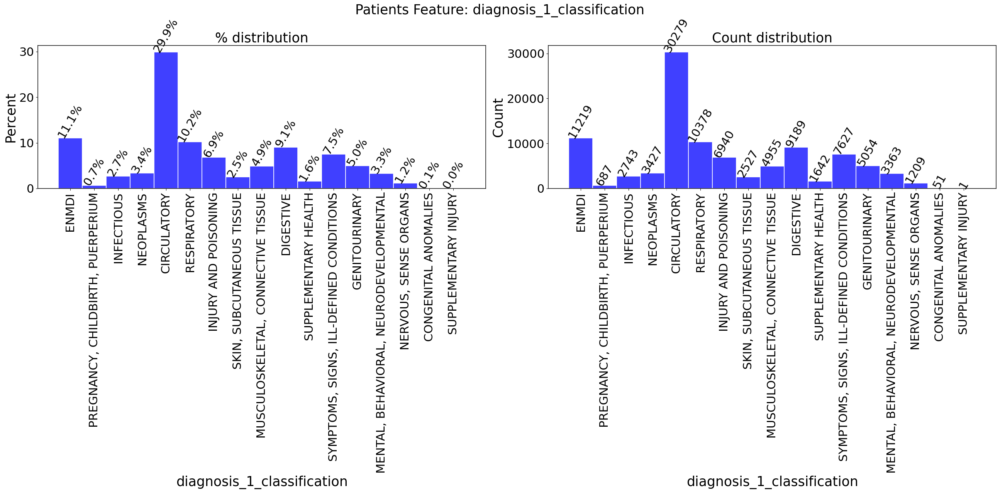

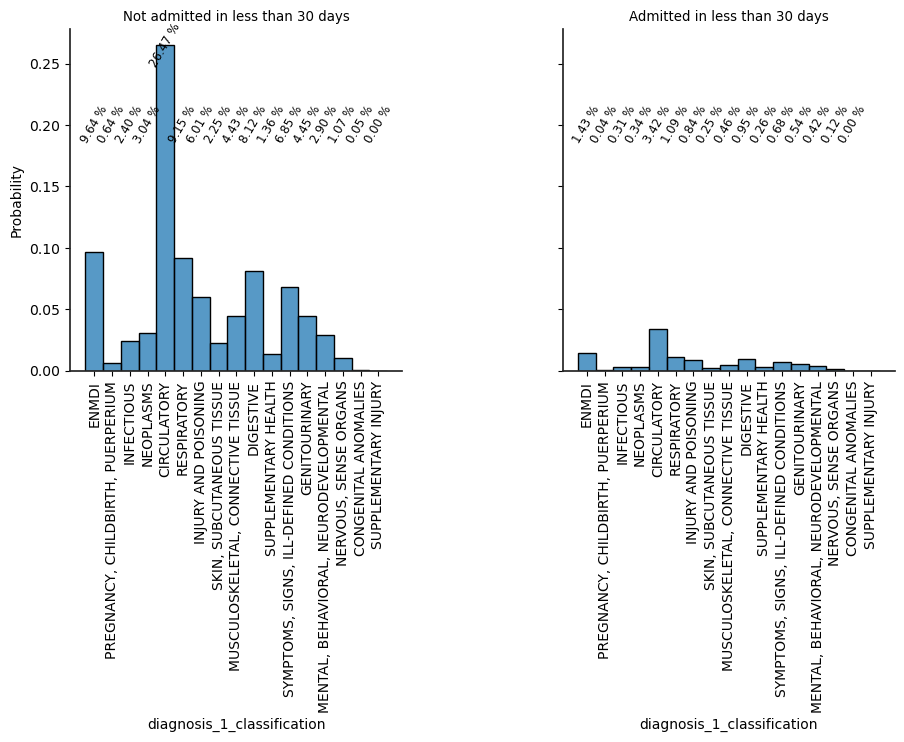

In [76]:
catPlotMatrix(patients_records_cleaned, 'diagnosis_1_classification', ticksRotation = 90)

In [77]:
diag1Stats = FeatureStats(patients_records_cleaned, 'diagnosis_1_classification', printStats = False)
diag1Stats.sort_values(by=['count'], ascending=False)

,diagnosis_1_classification,count,mean,readmitted less than 30 days
0,CIRCULATORY,30279,0.114370,3463.0
3,ENMDI,11219,0.129245,1450.0
12,RESPIRATORY,10378,0.106764,1108.0
2,DIGESTIVE,9189,0.104799,963.0
16,"SYMPTOMS, SIGNS, ILL-DEFINED CONDITIONS",7627,0.090075,687.0
6,INJURY AND POISONING,6940,0.122622,851.0
4,GENITOURINARY,5054,0.108231,547.0
8,"MUSCULOSKELETAL, CONNECTIVE TISSUE",4955,0.094854,470.0
9,NEOPLASMS,3427,0.100963,346.0
7,"MENTAL, BEHAVIORAL, NEURODEVELOPMENTAL",3363,0.126078,424.0


<div class="alert alert-block alert-info">
    Diagnosis_1 Classification
    <ul> 
		<li>CIRCULATORY is close to 30%</li>
        <li>Classifications less than 4% are changed to others</li>
    </ul>
</div>



In [78]:
patients_records_cleaned['diagnosis_1_classification'] = np.where(
    (patients_records_cleaned['diagnosis_1_classification'] == 'SUPPLEMENTARY INJURY')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'NEOPLASMS')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'MENTAL, BEHAVIORAL, NEURODEVELOPMENTA')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'INFECTIOUS')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'SKIN, SUBCUTANEOUS TISSUE')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'SUPPLEMENTARY HEALTH')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'NERVOUS, SENSE ORGANS')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'PREGNANCY, CHILDBIRTH, PUERPERIUM')
    | (patients_records_cleaned['diagnosis_1_classification'] == 'CONGENITAL ANOMALIES'),
    "OTHER", patients_records_cleaned['diagnosis_1_classification'])

patients_records_cleaned['diagnosis_1_classification'].unique()

array(['ENMDI', 'OTHER', 'CIRCULATORY', 'RESPIRATORY',
       'INJURY AND POISONING', 'MUSCULOSKELETAL, CONNECTIVE TISSUE',
       'DIGESTIVE', 'SYMPTOMS, SIGNS, ILL-DEFINED CONDITIONS',
       'GENITOURINARY', 'MENTAL, BEHAVIORAL, NEURODEVELOPMENTAL'],
      dtype=object)

<div class="alert alert-block alert-info">
    <B>Reviewing Medications Used or Not</B>
</div>

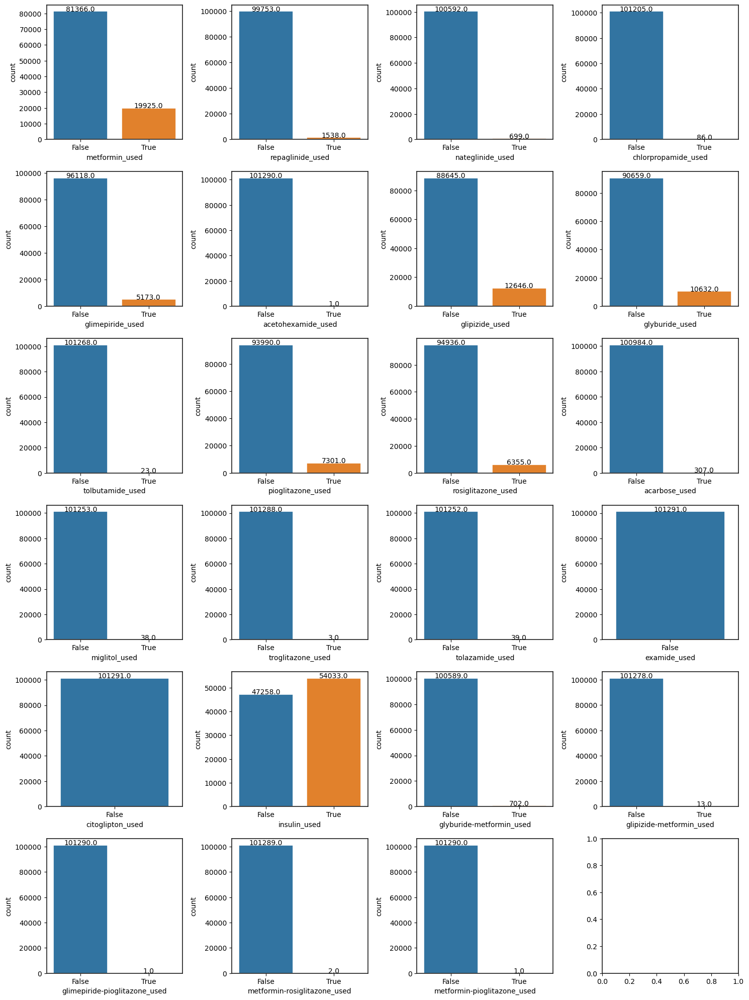

In [79]:
fig, axes = plt.subplots(6, 4, figsize=(15, 20)) 
row = 0
col = 0
for medication in medications:
    med_used = medication + '_used'
    countplot = sns.countplot(data=patients_records_cleaned, x=med_used, ax=axes[row, col], edgecolor='white', linewidth=1.2)
    patches_c = countplot.patches
    for i in range(len(patches_c)):
        x = patches_c[i].get_x() + patches_c[i].get_width()/2
        y = patches_c[i].get_height()+.05
        countplot.annotate(patches_c[i].get_height(), (x, y), ha='center', 
                           #rotation=valueRotation, 
                           #fontsize=barValueFontSize
                          )
    col = col +1
    if (col == 4):
        col = 0
        row = row + 1
    
fig.tight_layout()
plt.show()

<div class="alert alert-block alert-success">
    <ul>
        <li>Want to compare modelling results where medications used are miniuml</li>
        <li>Will drop these medicaitons
            <ul>
            <li>chlorpropamide 
            <li>acetohexamide 
            <li>pioglitazone
            <li>rosiglitazone 
            <li>miglitol
            <li>troglitazone
            <li>tolazamide
            <li>examide
            <li>citoglipton
            <li>glipizide-metformin
            <li>glimepiride-pioglitazone
            <li>metformin-rosiglitazone
            <li>metformin-pioglitazone
        </ul>
    </li>
    </ul>
</div>

In [80]:
medication_to_drop = ['chlorpropamide_used', 'acetohexamide_used', 'pioglitazone_used', 'rosiglitazone_used', 
                      'miglitol_used', 'troglitazone_used', 'tolazamide_used', 'examide_used', 
                      'citoglipton_used', 'glipizide-metformin_used', 'glimepiride-pioglitazone_used', 
                      'metformin-rosiglitazone_used', 'metformin-pioglitazone_used']
patients_records_cleaned = patients_records_cleaned.drop(columns=medication_to_drop)

<div class="alert alert-block alert-info">
    <B>Patient encounter records Before and After Data clean up</B>
</div>

In [81]:
#Number of patients in original data
num_patient_encounters = len(patients_records)
print ('Number of patient encounter records before clean up:', num_patient_encounters )
cleaned_num_patient_encounters = len(patients_records_cleaned)
print ('Number of patient encounter records after clean up :', cleaned_num_patient_encounters )
#num_dropped = num_patient_encounters - cleaned_num_patient_encounters
print ('Number of patient encounter dropped with clean up  :', num_patient_encounters - cleaned_num_patient_encounters )
print ('Percent of patient encounter dropped with clean up :', 
       round(1 - cleaned_num_patient_encounters/num_patient_encounters, 5 ))

Number of patient encounter records before clean up: 101766
Number of patient encounter records after clean up : 101291
Number of patient encounter dropped with clean up  : 475
Percent of patient encounter dropped with clean up : 0.00467


In [82]:
patients_records_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101291 entries, 1 to 101765
Data columns (total 29 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   race                          101291 non-null  object
 1   gender                        101291 non-null  object
 2   time_in_hospital              101291 non-null  int64 
 3   num_lab_procedures            101291 non-null  int64 
 4   num_procedures                101291 non-null  int64 
 5   num_medications               101291 non-null  int64 
 6   number_diagnoses              101291 non-null  int64 
 7   change                        101291 non-null  object
 8   diabetesMed                   101291 non-null  object
 9   readmitted less than 30 days  101291 non-null  int64 
 10  age_updated                   101291 non-null  int64 
 11  A1Cresult_Tested              101291 non-null  bool  
 12  admission_source_type         101291 non-null  object
 13 

<div class="alert alert-block alert-info">
    <B>Calculating variance-inflation-factor</B>
</div>

In [83]:
print("Calculating variance-inflation-factor for numerical data") 
patients_records_cleaned_ohe =  pd.get_dummies(patients_records_cleaned);
vif_df = sk_vif(patients_records_cleaned_ohe.columns, patients_records_cleaned_ohe).sort_values(by='VIF', ascending = False)
print(vif_df)

Calculating variance-inflation-factor for numerical data
                                              Feature       R^2       VIF
19                                       insulin_used  0.611460  2.573737
3                                     num_medications  0.458441  1.846522
0                                    time_in_hospital  0.357122  1.555505
2                                      num_procedures  0.278616  1.386224
11                                     metformin_used  0.265465  1.361405
1                                  num_lab_procedures  0.261567  1.354220
16                                     glyburide_used  0.240025  1.315833
15                                     glipizide_used  0.233308  1.304304
6                                         age_updated  0.225651  1.291407
4                                    number_diagnoses  0.198796  1.248122
14                                   glimepiride_used  0.114180  1.128898
7                                    A1Cresult_Tested  

<div class="alert alert-block alert-info">
    <B>Correlation Matrix</B>
</div>

Text(0.5, 1.0, 'Features Correlating for readmitted less than 30 days')

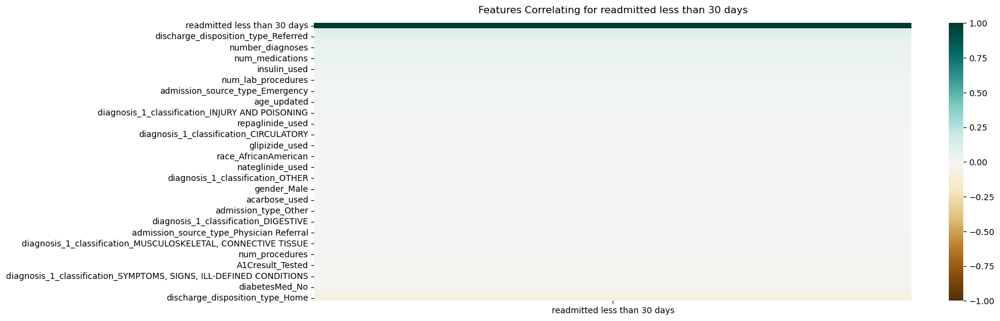

In [84]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(patients_records_cleaned_ohe.corr()[['readmitted less than 30 days']].sort_values(by='readmitted less than 30 days', ascending=False), 
                      vmin=-1, vmax=1, cmap='BrBG')
heatmap.set_title('Features Correlating for readmitted less than 30 days', fontdict={'fontsize':12}, pad=12)

Text(0.5, 1.0, 'Correlation Heatmap')

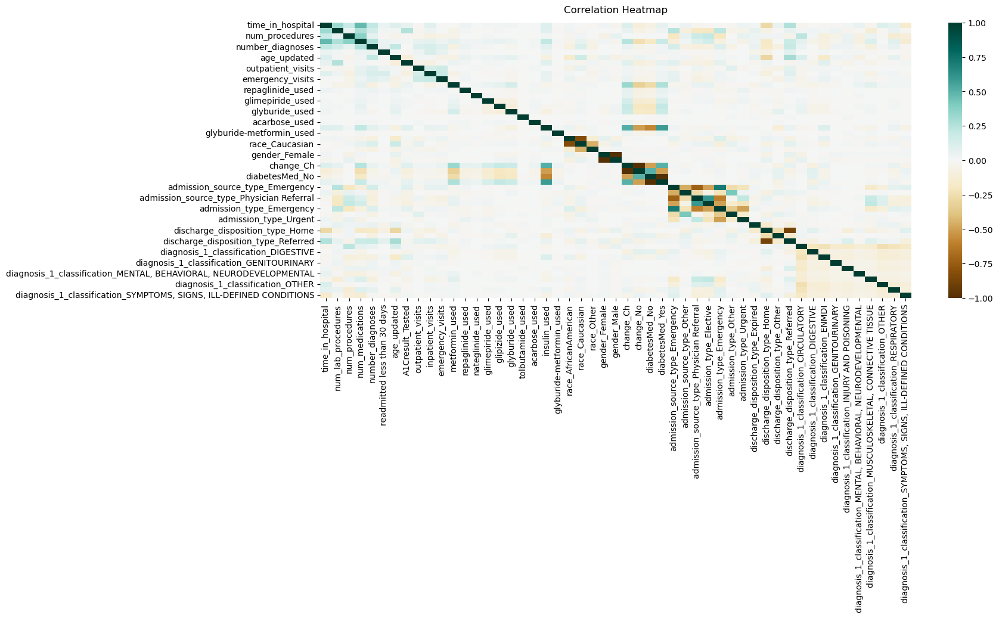

In [85]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(patients_records_cleaned_ohe.corr(), vmin=-1, vmax=1, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

Text(0.5, 1.0, 'Correlation Heatmap')

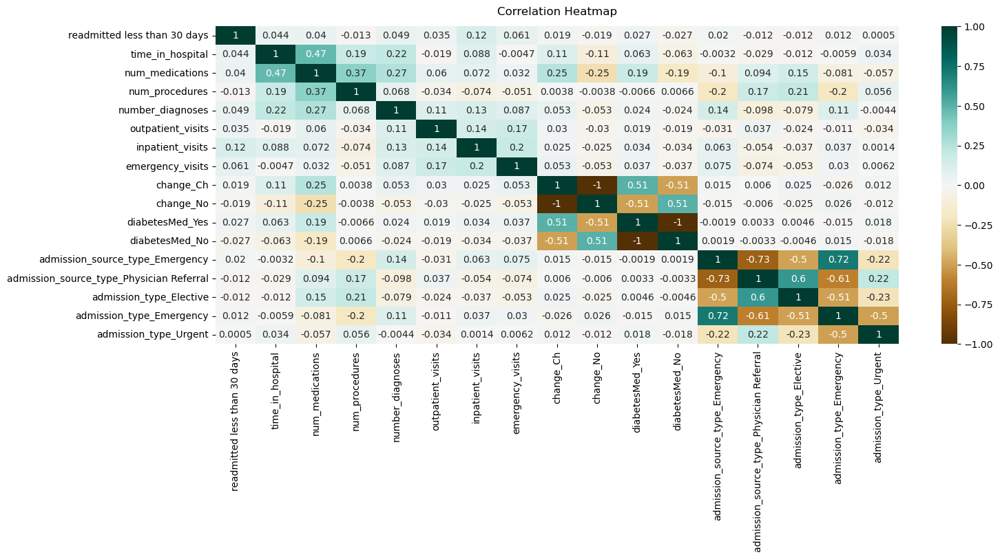

In [86]:
plt.figure(figsize=(16, 6))
corr_columns = patients_records_cleaned_ohe[['readmitted less than 30 days', 'time_in_hospital',
                                             'num_medications', 'num_procedures', 'number_diagnoses',
                                            'outpatient_visits','inpatient_visits','emergency_visits',
                                            'change_Ch','change_No', 'diabetesMed_Yes', 'diabetesMed_No',
                                            'admission_source_type_Emergency', 'admission_source_type_Physician Referral',
                                            'admission_type_Elective', 'admission_type_Emergency', 'admission_type_Urgent']]
heatmap = sns.heatmap(corr_columns.corr(), vmin=-1, vmax=1, cmap='BrBG',annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

<div class="alert alert-block alert-success">
    <ul>
        <li>Insulin Used, Number of Medicatoins and Time in Hospital in the order are 3 highly influsing factors</li>
        <li>We do not see any feature highly correlated based on Multicollinearity using variance-inflation-factor </li>
        <li>Based on corellation heat map, admission_type and admission_source_type seems to be some what corelated. We will drop admission_source_type</li>
    </ul>
</div>

In [87]:
patients_records_cleaned = patients_records_cleaned.drop(columns=['admission_source_type'])

In [88]:
patients_records_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101291 entries, 1 to 101765
Data columns (total 28 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   race                          101291 non-null  object
 1   gender                        101291 non-null  object
 2   time_in_hospital              101291 non-null  int64 
 3   num_lab_procedures            101291 non-null  int64 
 4   num_procedures                101291 non-null  int64 
 5   num_medications               101291 non-null  int64 
 6   number_diagnoses              101291 non-null  int64 
 7   change                        101291 non-null  object
 8   diabetesMed                   101291 non-null  object
 9   readmitted less than 30 days  101291 non-null  int64 
 10  age_updated                   101291 non-null  int64 
 11  A1Cresult_Tested              101291 non-null  bool  
 12  admission_type                101291 non-null  object
 13 

In [89]:
#Save the cleaned data
patients_records_cleaned.to_csv('data/diabetic_data_cleaned.csv', index = False)

<div class="alert alert-block alert-info">
    <B><H1>Modelling</H1></B>
</div>


<div class="alert alert-block alert-info">
    <H3>Without Diagnosis Classifier</H2>
</div>

In [90]:
#Reload the cleaned data 
patients_records_cleaned = pd.read_csv('data/diabetic_data_cleaned.csv')

patients_records_cleaned = patients_records_cleaned.drop(['diagnosis_1_classification'], axis = 1)


In [91]:
#Splliting data for train and test
X_train_dc, X_test_dc, y_train_dc, y_test_dc = train_test_split(
    patients_records_cleaned.drop(['readmitted less than 30 days'], axis = 1),
    patients_records_cleaned['readmitted less than 30 days'], 
    random_state=24, test_size = 0.3)


In [92]:
 cat_features = ['race', 'gender', 'A1Cresult_Tested', 'change', 'diabetesMed', 'admission_type', 
                'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 
                'discharge_disposition_type', 'outpatient_visits', 'inpatient_visits', 'emergency_visits',
              'metformin_used', 'repaglinide_used', 'nateglinide_used', 'glimepiride_used', 
              'glipizide_used', 'glyburide_used', 'tolbutamide_used', 'acarbose_used',
              'insulin_used', 'glyburide-metformin_used']

cat_cols = []
for col in X_train_dc.columns:
    if X_train_dc[col].dtype == 'object': 
        cat_cols.append(True)
    else:
        cat_cols.append(False)
        
print('Before oversampleing: ', Counter(y_train_dc))
oversample = SMOTENC(categorical_features=cat_cols, random_state=24)
X_train_dc, y_train_dc = oversample.fit_resample(X_train_dc, y_train_dc)
print('After oversampleing: ', Counter(y_train_dc))

Before oversampleing:  Counter({0: 62984, 1: 7919})
After oversampleing:  Counter({0: 62984, 1: 62984})


In [93]:
# Creating a column transformer
column_transformer_dc = make_column_transformer(
    (OneHotEncoder(drop="if_binary"),
     patients_records_cleaned.select_dtypes(include='object').columns),
    verbose_feature_names_out=False,
    remainder=StandardScaler())

<div class="alert alert-block alert-info">
    <B>KNeighborsClassifier</B>
</div>

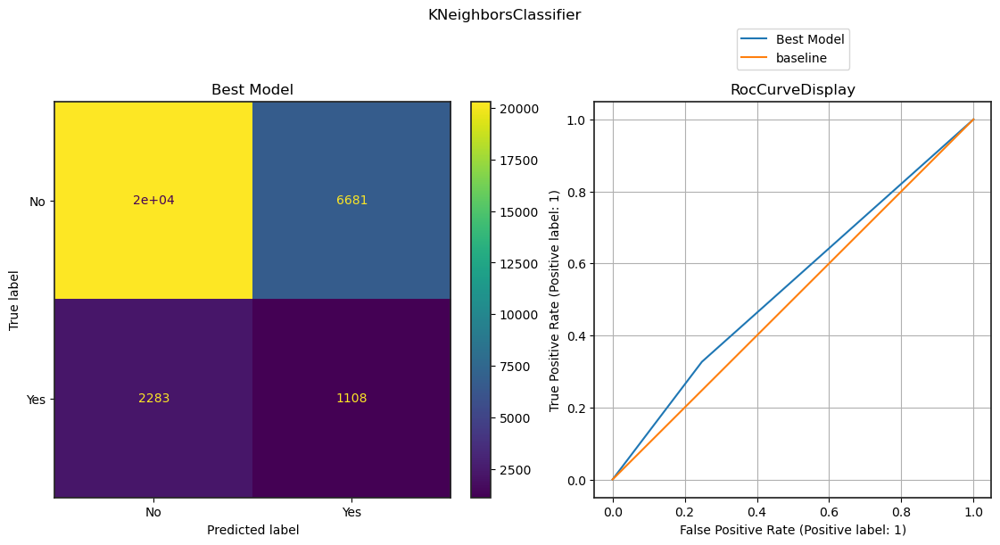

In [94]:
#Using the evaluateModel to GridSearchCV for KNeighborsClassifier 
knn_params =  {'model__n_neighbors': list(range(1, 100, 1)), 'model__weights': ['distance', 'uniform']}
knn_results_df_ndc, knn_grid_ndc = evaluateModel(
    KNeighborsClassifier(), knn_params, 'KNeighborsClassifier', column_transformer_dc,
                               X_train_dc, X_test_dc, y_train_dc, y_test_dc)

In [95]:
#print the KNN modeling results
knn_results_df_ndc

,KNeighborsClassifier
Model_Results,
GridCV Accuracy Scoring Best Params,"[4, distance]"
Accuracy,0.705015
Recall,0.326747


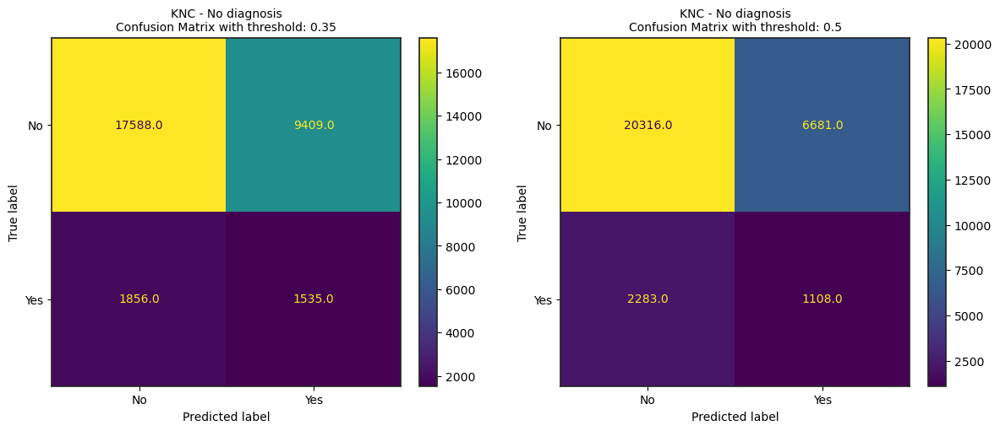

In [200]:
# Plot 
knn_threshold_ndc_df, knn_cm_fig_ndc = plotConfusionMatrixWithThreshold(X_test_dc, y_test_dc, 0.35, 0.5,
                                                   knn_grid_ndc, 'KNC - No diagnosis')

In [201]:
knn_threshold_ndc_df

,KNC - No diagnosis
Model_Results,
Accuracy Score - Threshold - 0.35,0.629294
Recall Score - Threshold - 0.35,0.452669
Precision Score - Threshold - 0.35,0.140260
Accuracy Score - Threshold - 0.5,0.705015
Recall Score - Threshold - 0.5,0.326747
Precision Score - Threshold - 0.5,0.142252


<div class="alert alert-block alert-info">
    <B>LogisticRegression</B>
</div>

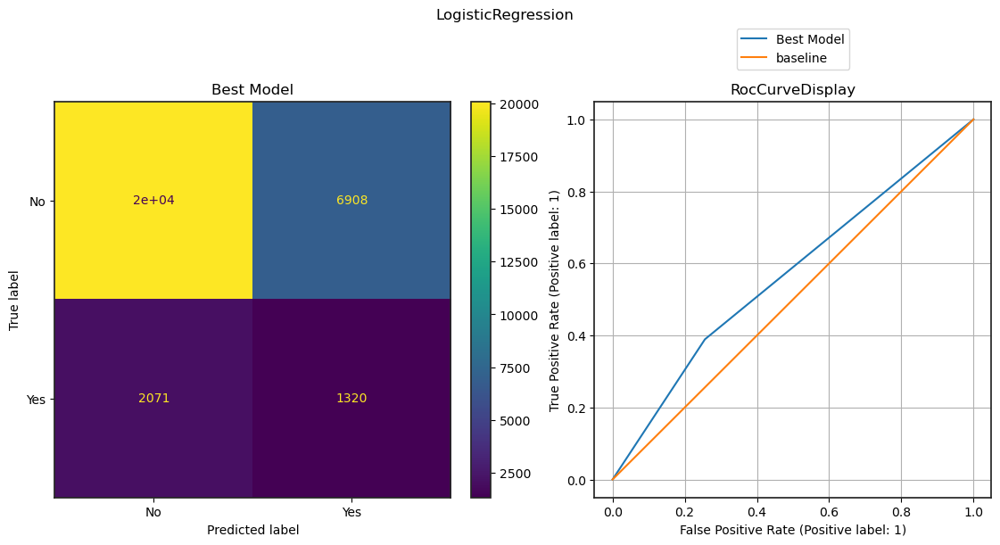

In [98]:
#Using the evaluateModel to GridSearchCV for LogisticRegression 

lr_params = {'model__max_iter': list(range(400, 800, 50)),
          'model__class_weight': [None, 'balanced'] }

lr_results_ndc_df, lr_grid_ndc = evaluateModel(
    LogisticRegression(random_state=42), lr_params, 'LogisticRegression', column_transformer_dc,
                X_train_dc, X_test_dc, y_train_dc, y_test_dc)

In [99]:
#print the LogisticRegression modeling results and scores
lr_results_ndc_df

,LogisticRegression
Model_Results,
GridCV Accuracy Scoring Best Params,"[None, 400]"
Accuracy,0.704522
Recall,0.389266


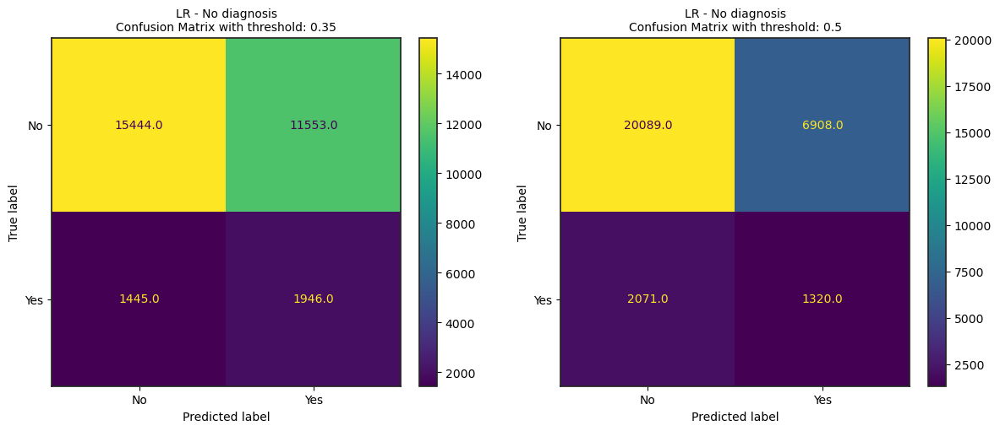

In [171]:
lr_threshold_ndc_df, lr_cm_fig_ndc = plotConfusionMatrixWithThreshold(X_test_dc, y_test_dc, 0.35, 0.5,
                                                   lr_grid_ndc, 'LR - No diagnosis')

In [172]:
lr_threshold_ndc_df

,LR - No diagnosis
Model_Results,
Accuracy Score - Threshold - 0.35,0.572265
Recall Score - Threshold - 0.35,0.573872
Precision Score - Threshold - 0.35,0.144159
Accuracy Score - Threshold - 0.5,0.704522
Recall Score - Threshold - 0.5,0.389266
Precision Score - Threshold - 0.5,0.160428


<div class="alert alert-block alert-info">
    <B>DecisionTreeClassifier</B>
</div>

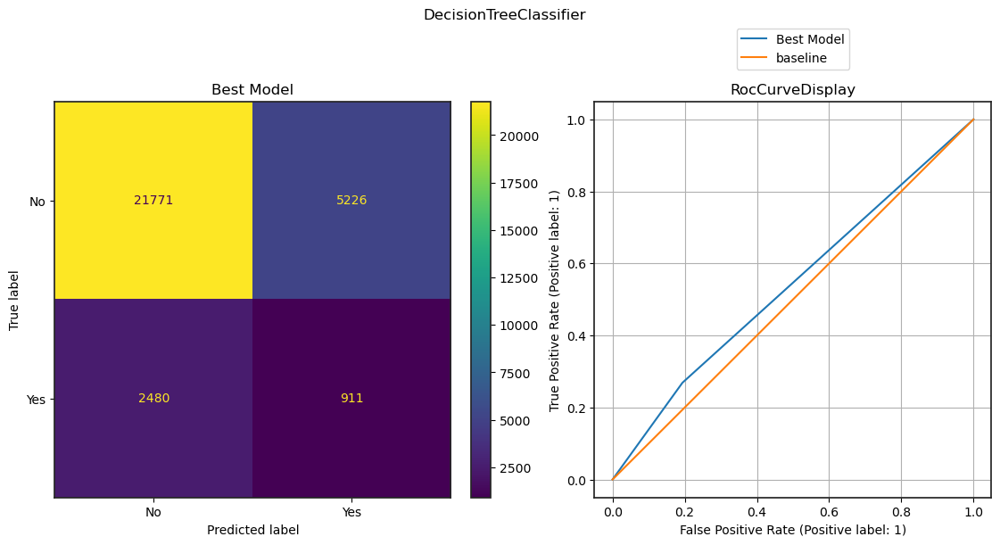

In [102]:
#Using the evaluateModel to GridSearchCV for DecisionTreeClassifier 
dt_params = {'model__min_samples_split': [2, 4, 6 ],
             'model__criterion': ['gini', 'entropy', 'log_loss' ],
             'model__min_samples_leaf': [2, 4, 6],
             'model__random_state': [15, 20, 42], 
             'model__splitter': ['best','random']
         }

dt_results_ndc_df, dt_grid_ndc = evaluateModel(
    DecisionTreeClassifier(), dt_params, 'DecisionTreeClassifier', column_transformer_dc,
                X_train_dc, X_test_dc, y_train_dc, y_test_dc, 8)


In [103]:
#print the DecisionTreeClassifier modeling results and scores
dt_results_ndc_df

,DecisionTreeClassifier
Model_Results,
GridCV Accuracy Scoring Best Params,"[entropy, 2, 2, 15, best]"
Accuracy,0.746413
Recall,0.268652


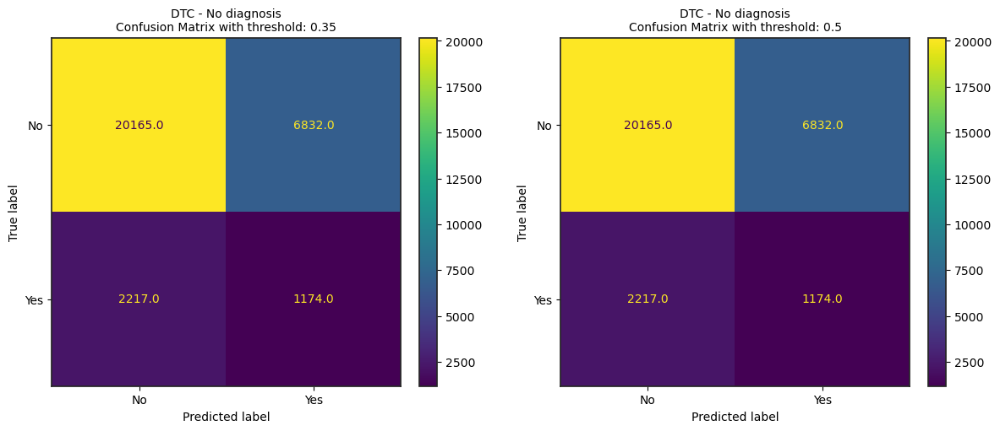

In [177]:
dt_threshold_ndc_df, dt_cm_fig_ndc = plotConfusionMatrixWithThreshold(X_test_dc, y_test_dc, 0.35, 0.5,
                                                   dt_grid_ndc, 'DTC - No diagnosis') 

In [178]:
dt_threshold_ndc_df

,DTC - No diagnosis
Model_Results,
Accuracy Score - Threshold - 0.35,0.702218
Recall Score - Threshold - 0.35,0.346211
Precision Score - Threshold - 0.35,0.146640
Accuracy Score - Threshold - 0.5,0.702218
Recall Score - Threshold - 0.5,0.346211
Precision Score - Threshold - 0.5,0.146640


<div class="alert alert-block alert-info">
    <H3>No Medication (Except Insulin)</H3>
</div>

In [106]:
#Reload the cleaned data 
patients_records_cleaned = pd.read_csv('data/diabetic_data_cleaned.csv')

#drop the medications except insuli
patients_records_cleaned = patients_records_cleaned.drop(['metformin_used', 'repaglinide_used', 'nateglinide_used', 
                                                          'glimepiride_used', 'glipizide_used', 'glyburide_used', 
                                                          'tolbutamide_used', 'acarbose_used' , 
                                                          'glyburide-metformin_used'], axis = 1)

In [107]:
#Splliting data for train and test
X_train_nm, X_test_nm, y_train_nm, y_test_nm = train_test_split(patients_records_cleaned.drop(['readmitted less than 30 days'], axis = 1), 
                                                    patients_records_cleaned['readmitted less than 30 days'],
                                                                random_state=24, test_size = 0.3)


In [108]:
 cat_features = ['race', 'gender', 'A1Cresult_Tested', 'change', 'diabetesMed', 'admission_type', 
                'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 
                'discharge_disposition_type', 'outpatient_visits', 'inpatient_visits', 'emergency_visits',
                'insulin_used', 'diagnosis_1_classification']

cat_cols = []
for col in X_train_nm.columns:
    if X_train_nm[col].dtype == 'object': 
        cat_cols.append(True)
    else:
        cat_cols.append(False)
        
print('Before oversampleing: ', Counter(y_train_nm))
oversample = SMOTENC(categorical_features=cat_cols, random_state=24)
X_train_nm, y_train_nm = oversample.fit_resample(X_train_nm, y_train_nm)
print('After oversampleing: ', Counter(y_train_nm))

Before oversampleing:  Counter({0: 62984, 1: 7919})
After oversampleing:  Counter({0: 62984, 1: 62984})


In [109]:
# Creating a column transformer
column_transformer_nm = make_column_transformer(
    (OneHotEncoder(drop="if_binary"),
     patients_records_cleaned.select_dtypes(include='object').columns),
    verbose_feature_names_out=False,
    remainder=StandardScaler())


<div class="alert alert-block alert-info">
    <B>KNeighborsClassifier</B>
</div>

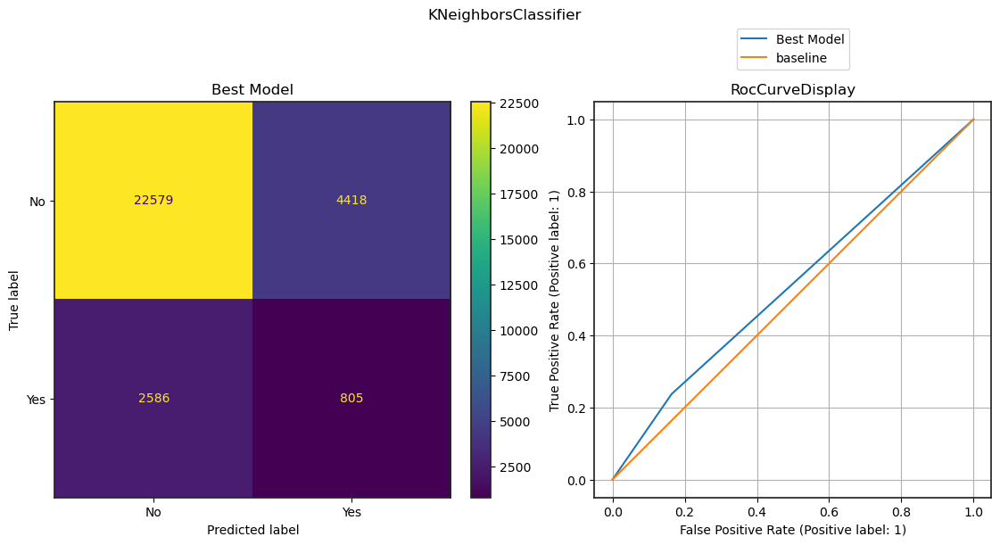

In [110]:
#Using the evaluateModel to GridSearchCV for KNeighborsClassifier 
knn_params =  {'model__n_neighbors': list(range(1, 100, 1)), 'model__weights': ['distance', 'uniform']}
knn_results_df_nm, knn_grid_nm = evaluateModel(
    KNeighborsClassifier(), knn_params, 'KNeighborsClassifier', column_transformer_nm,
                               X_train_nm, X_test_nm, y_train_nm, y_test_nm)  

In [111]:
#print the KNN modeling results
knn_results_df_nm

,KNeighborsClassifier
Model_Results,
GridCV Accuracy Scoring Best Params,"[2, uniform]"
Accuracy,0.769514
Recall,0.237393


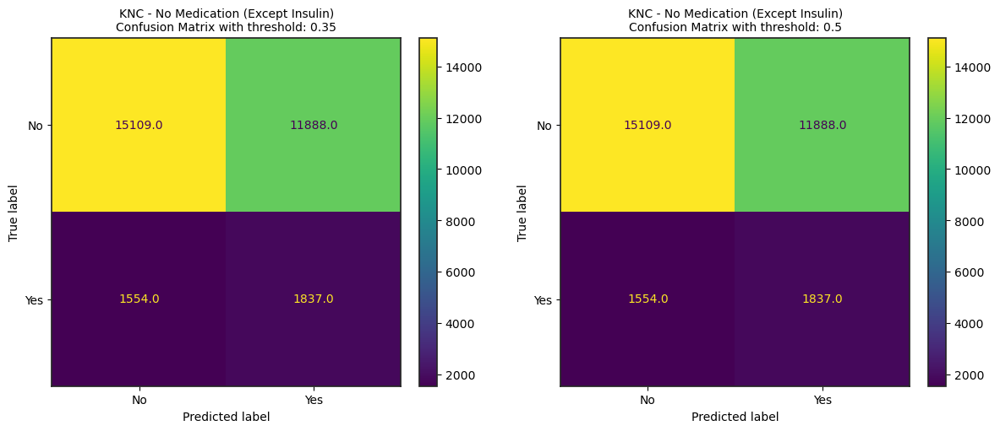

In [179]:
# Plot 
knn_threshold_nm_df, knn_cm_fig_nm = plotConfusionMatrixWithThreshold(X_test_nm, y_test_nm, 0.35, 0.5,
                                                   knn_grid_nm, 'KNC - No Medication (Except Insulin)')

In [180]:
knn_threshold_nm_df

,KNC - No Medication (Except Insulin)
Model_Results,
Accuracy Score - Threshold - 0.35,0.557654
Recall Score - Threshold - 0.35,0.541728
Precision Score - Threshold - 0.35,0.133843
Accuracy Score - Threshold - 0.5,0.557654
Recall Score - Threshold - 0.5,0.541728
Precision Score - Threshold - 0.5,0.133843


<div class="alert alert-block alert-info">
    <B>LogisticRegression</B>
</div>

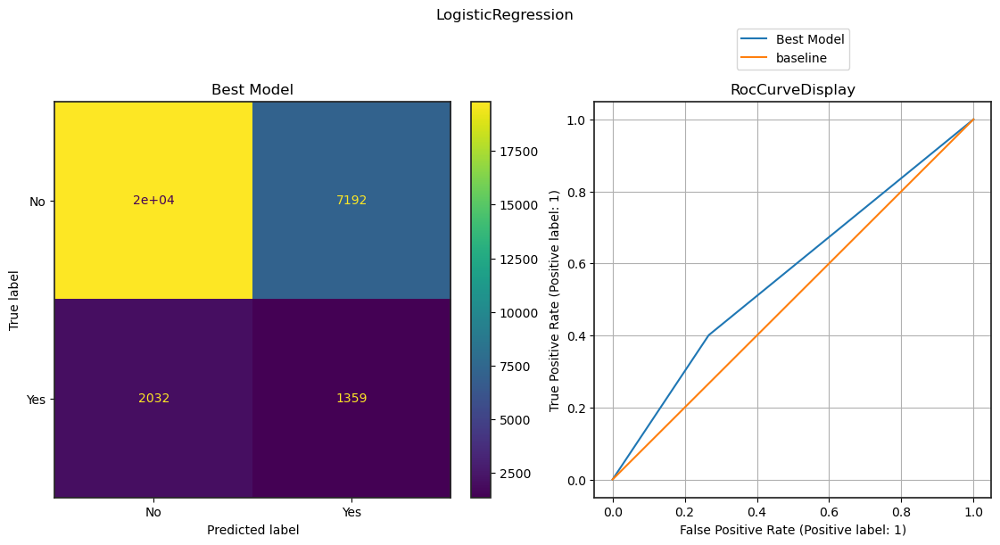

In [114]:
#Using the evaluateModel to GridSearchCV for LogisticRegression 

lr_params = {'model__max_iter': list(range(400, 800, 50)),  
          'model__class_weight': [None, 'balanced'] }


lr_results_nm_df, lr_grid_nm = evaluateModel(
    LogisticRegression(random_state=42), lr_params, 'LogisticRegression', column_transformer_nm,
                X_train_nm, X_test_nm, y_train_nm, y_test_nm)

In [115]:
#print the LogisticRegression modeling results and scores
lr_results_nm_df

,LogisticRegression
Model_Results,
GridCV Accuracy Scoring Best Params,"[None, 400]"
Accuracy,0.696459
Recall,0.400767


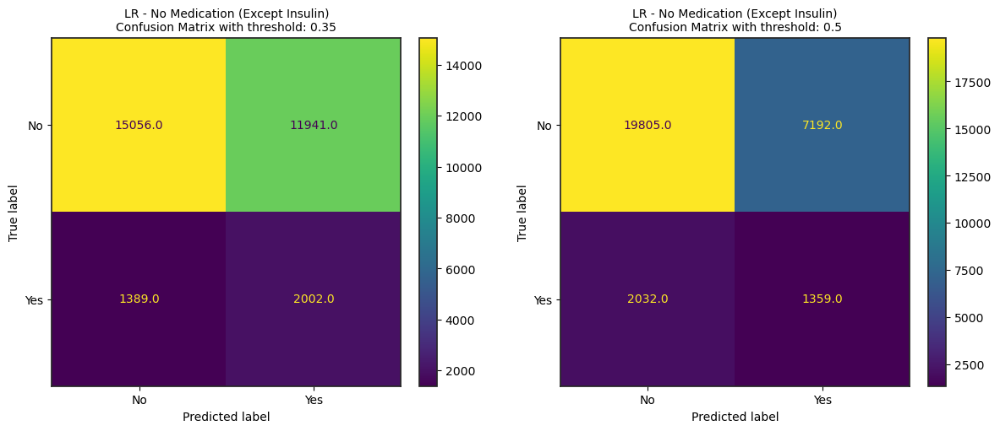

In [181]:
lr_threshold_nm_df, lr_cm_fig_nm = plotConfusionMatrixWithThreshold(X_test_nm, y_test_nm, 0.35, 0.5,
                                                   lr_grid_nm, 'LR - No Medication (Except Insulin)')

In [182]:
lr_threshold_nm_df

,LR - No Medication (Except Insulin)
Model_Results,
Accuracy Score - Threshold - 0.35,0.561340
Recall Score - Threshold - 0.35,0.590386
Precision Score - Threshold - 0.35,0.143585
Accuracy Score - Threshold - 0.5,0.696459
Recall Score - Threshold - 0.5,0.400767
Precision Score - Threshold - 0.5,0.158929


<div class="alert alert-block alert-info">
    <B>DecisionTreeClassifier</B>
</div>

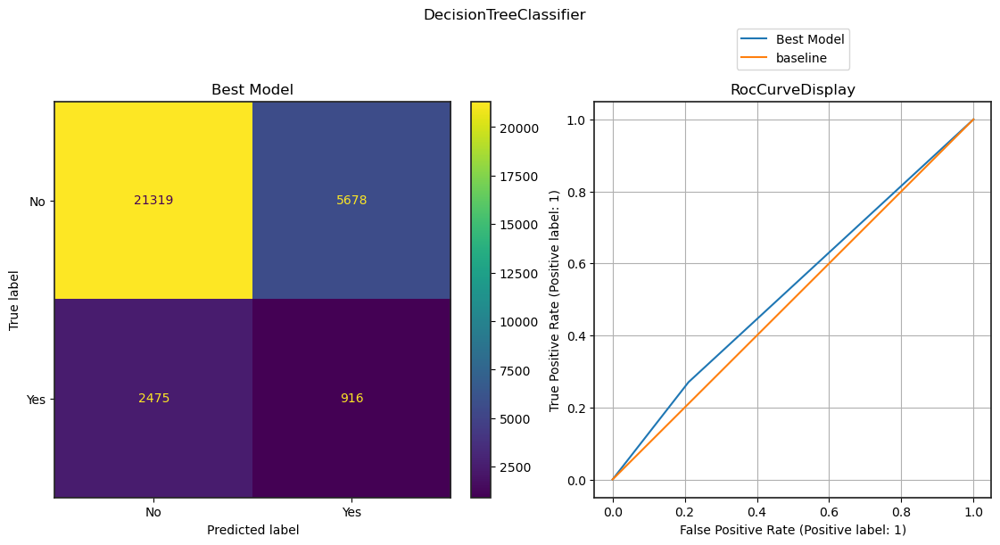

In [118]:
#Using the evaluateModel to GridSearchCV for DecisionTreeClassifier 
dt_params = {'model__min_samples_split': [2, 4, 6 ],
             'model__criterion': ['gini', 'entropy', 'log_loss' ],
             'model__min_samples_leaf': [2, 4, 6],
             'model__random_state': [15, 20, 42], 
             'model__splitter': ['best','random']
            }

dt_results_nm_df, dt_grid_nm = evaluateModel(
    DecisionTreeClassifier(), dt_params, 'DecisionTreeClassifier', column_transformer_nm,
                X_train_nm, X_test_nm, y_train_nm, y_test_nm, 8)


In [119]:
#print the DecisionTreeClassifier modeling results and scores
dt_results_nm_df

,DecisionTreeClassifier
Model_Results,
GridCV Accuracy Scoring Best Params,"[entropy, 2, 2, 20, best]"
Accuracy,0.731703
Recall,0.270127


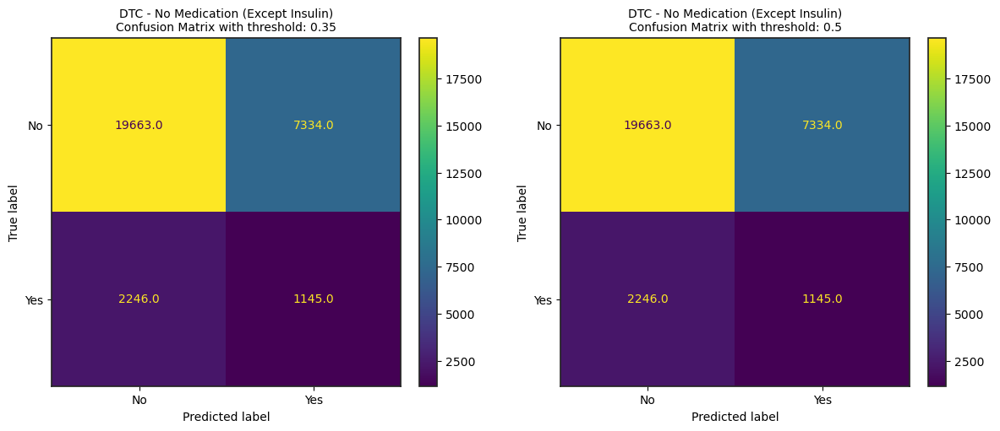

In [183]:
dt_threshold_nm_df, dt_cm_fig_nm = plotConfusionMatrixWithThreshold(X_test_nm, y_test_nm, 0.35, 0.5,
                                                   dt_grid_nm, 'DTC - No Medication (Except Insulin)') 

In [184]:
dt_threshold_nm_df

,DTC - No Medication (Except Insulin)
Model_Results,
Accuracy Score - Threshold - 0.35,0.684744
Recall Score - Threshold - 0.35,0.337659
Precision Score - Threshold - 0.35,0.135040
Accuracy Score - Threshold - 0.5,0.684744
Recall Score - Threshold - 0.5,0.337659
Precision Score - Threshold - 0.5,0.135040


<div class="alert alert-block alert-info">
    <H3>Without Medication (Except Insulin), Without Diagnosis Classifier</H2>
</div>

In [122]:
#Reload the cleaned data 
patients_records_cleaned = pd.read_csv('data/diabetic_data_cleaned.csv')

#Drop Diagnosis 1 Classification and Medications
patients_records_cleaned = patients_records_cleaned.drop(['metformin_used', 'repaglinide_used', 'nateglinide_used', 
                                                          'glimepiride_used', 'glipizide_used', 'glyburide_used', 
                                                          'tolbutamide_used', 'acarbose_used' , 
                                                          'glyburide-metformin_used', 'diagnosis_1_classification'], axis = 1)


In [123]:
#Splliting data for train and test
X_train_nmdc, X_test_nmdc, y_train_nmdc, y_test_nmdc = train_test_split(patients_records_cleaned.drop(['readmitted less than 30 days'], axis = 1), 
                                                    patients_records_cleaned['readmitted less than 30 days'],
                                                                         random_state=24, test_size = 0.3)



In [124]:
 cat_features = ['race', 'gender', 'A1Cresult_Tested', 'change', 'diabetesMed', 'admission_type', 
                'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 
                'discharge_disposition_type', 'outpatient_visits', 'inpatient_visits', 'emergency_visits',
                 'insulin_used']

cat_cols = []
for col in X_train_nmdc.columns:
    if X_train_nmdc[col].dtype == 'object': 
        cat_cols.append(True)
    else:
        cat_cols.append(False)
        
print('Before oversampleing: ', Counter(y_train_nmdc))
oversample = SMOTENC(categorical_features=cat_cols, random_state=24)
X_train_nmdc, y_train_nmdc = oversample.fit_resample(X_train_nmdc, y_train_nmdc)
print('After oversampleing: ', Counter(y_train_nmdc))

Before oversampleing:  Counter({0: 62984, 1: 7919})
After oversampleing:  Counter({0: 62984, 1: 62984})


In [125]:
# Creating a column transformer
column_transformer_nmdc = make_column_transformer(
    (OneHotEncoder(drop="if_binary"),
     patients_records_cleaned.select_dtypes(include='object').columns),
    verbose_feature_names_out=False,
    remainder=StandardScaler())


<div class="alert alert-block alert-info">
    <B>KNeighborsClassifier</B>
</div>

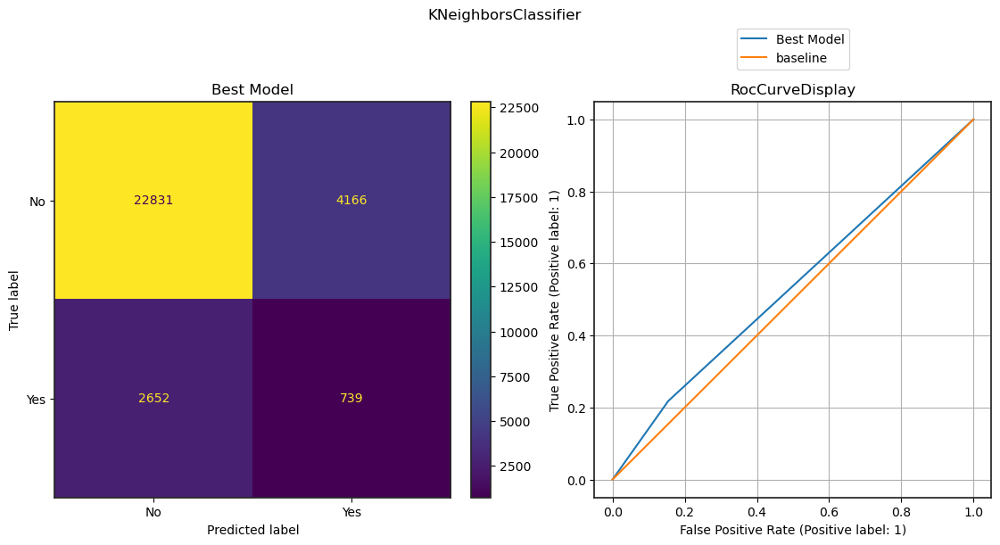

In [126]:
#Using the evaluateModel to GridSearchCV for KNeighborsClassifier 
knn_params =  {'model__n_neighbors': list(range(1, 100, 1)), 'model__weights': ['distance', 'uniform']}
knn_results_df_nmdc, knn_grid_nmdc = evaluateModel(
    KNeighborsClassifier(), knn_params, 'KNeighborsClassifier', column_transformer_nmdc,
                               X_train_nmdc, X_test_nmdc, y_train_nmdc, y_test_nmdc)

In [127]:
#print the KNN modeling results
knn_results_df_nmdc

,KNeighborsClassifier
Model_Results,
GridCV Accuracy Scoring Best Params,"[2, uniform]"
Accuracy,0.775635
Recall,0.21793


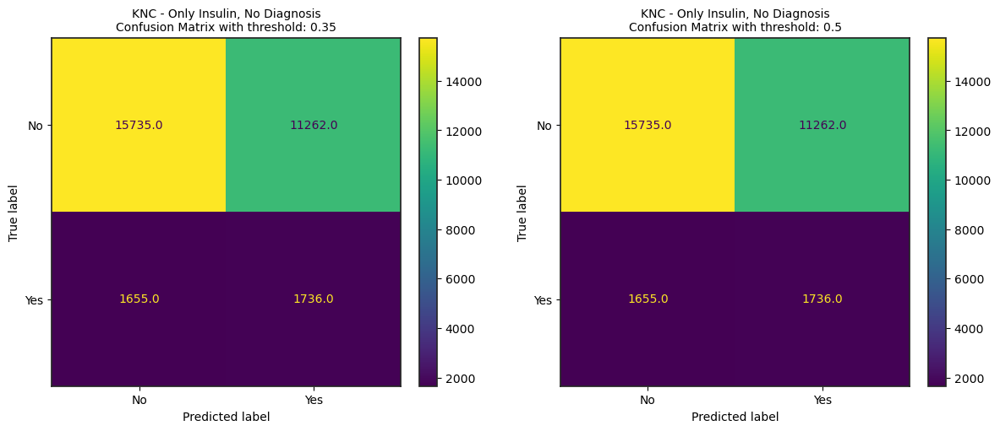

In [185]:
# Plot 
knn_threshold_nmdc_df, knn_cm_fig_nmdc = plotConfusionMatrixWithThreshold(X_test_nmdc, y_test_nmdc, 0.35, 0.5,
                                                   knn_grid_nmdc, 'KNC - Only Insulin, No Diagnosis')

In [186]:
knn_threshold_nmdc_df

,"KNC - Only Insulin, No Diagnosis"
Model_Results,
Accuracy Score - Threshold - 0.35,0.574931
Recall Score - Threshold - 0.35,0.511943
Precision Score - Threshold - 0.35,0.133559
Accuracy Score - Threshold - 0.5,0.574931
Recall Score - Threshold - 0.5,0.511943
Precision Score - Threshold - 0.5,0.133559


<div class="alert alert-block alert-info">
    <B>LogisticRegression</B>
</div>

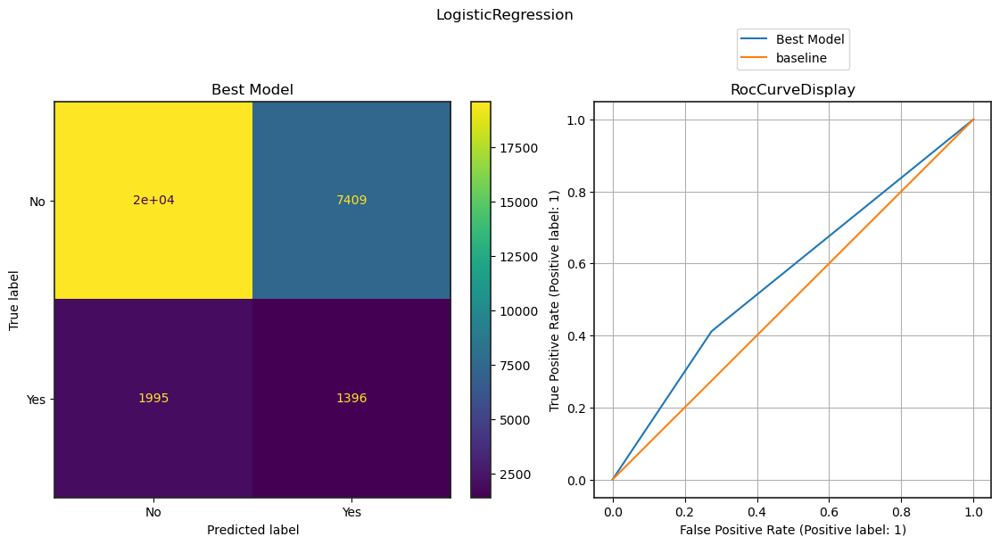

In [130]:
#Using the evaluateModel to GridSearchCV for LogisticRegression 

lr_params = {'model__max_iter': list(range(400, 800, 50)),
          'model__class_weight': [None, 'balanced'] }

lr_results_nmdc_df, lr_grid_nmdc = evaluateModel(
    LogisticRegression(random_state=42), lr_params, 'LogisticRegression', column_transformer_nmdc,
                X_train_nmdc, X_test_nmdc, y_train_nmdc, y_test_nmdc)

In [131]:
#print the LogisticRegression modeling results and scores
lr_results_nmdc_df

,LogisticRegression
Model_Results,
GridCV Accuracy Scoring Best Params,"[None, 400]"
Accuracy,0.690536
Recall,0.411678


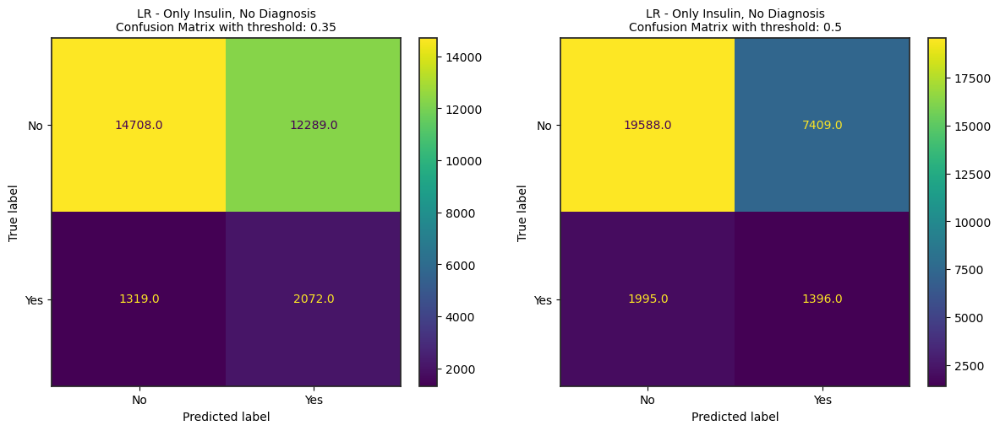

In [187]:
lr_threshold_nmdc_df, lr_cm_fig_nmdc = plotConfusionMatrixWithThreshold(X_test_nmdc, y_test_nmdc, 0.35, 0.5,
                                                   lr_grid_nmdc, 'LR - Only Insulin, No Diagnosis')

In [188]:
lr_threshold_nmdc_df

,"LR - Only Insulin, No Diagnosis"
Model_Results,
Accuracy Score - Threshold - 0.35,0.552192
Recall Score - Threshold - 0.35,0.611029
Precision Score - Threshold - 0.35,0.144280
Accuracy Score - Threshold - 0.5,0.690536
Recall Score - Threshold - 0.5,0.411678
Precision Score - Threshold - 0.5,0.158546


<div class="alert alert-block alert-info">
    <B>DecisionTreeClassifier</B>
</div>

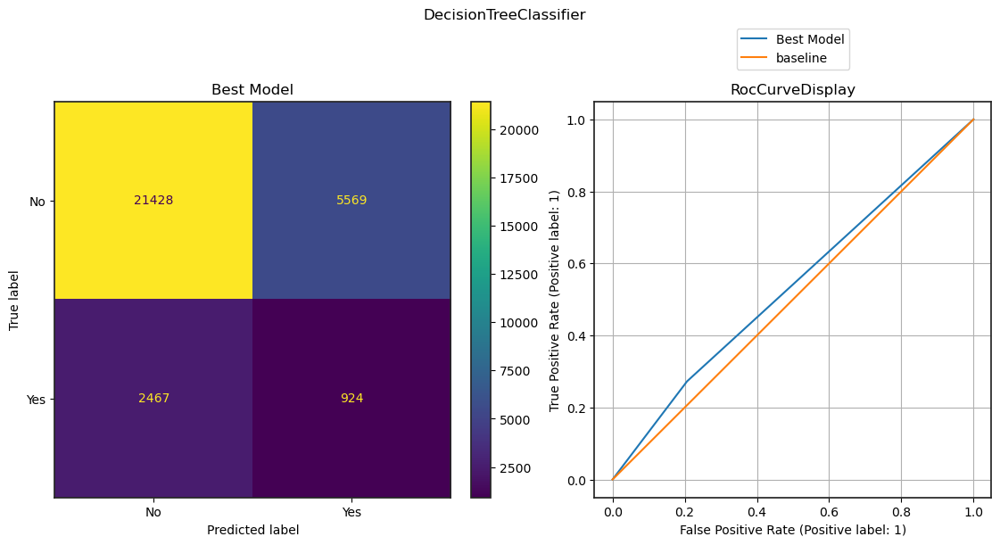

In [134]:
#Using the evaluateModel to GridSearchCV for DecisionTreeClassifier 
dt_params = {'model__min_samples_split': [2, 4, 6 ],
             'model__criterion': ['gini', 'entropy', 'log_loss' ],
             'model__min_samples_leaf': [2, 4, 6],
             'model__random_state': [15, 20, 42], 
             'model__splitter': ['best','random']
            }

dt_results_nmdc_df, dt_grid_nmdc = evaluateModel(
    DecisionTreeClassifier(), dt_params, 'DecisionTreeClassifier', column_transformer_nmdc,
                X_train_nmdc, X_test_nmdc, y_train_nmdc, y_test_nmdc, 8)


In [135]:
#print the DecisionTreeClassifier modeling results and scores
dt_results_nmdc_df

,DecisionTreeClassifier
Model_Results,
GridCV Accuracy Scoring Best Params,"[entropy, 2, 2, 15, best]"
Accuracy,0.735554
Recall,0.272486


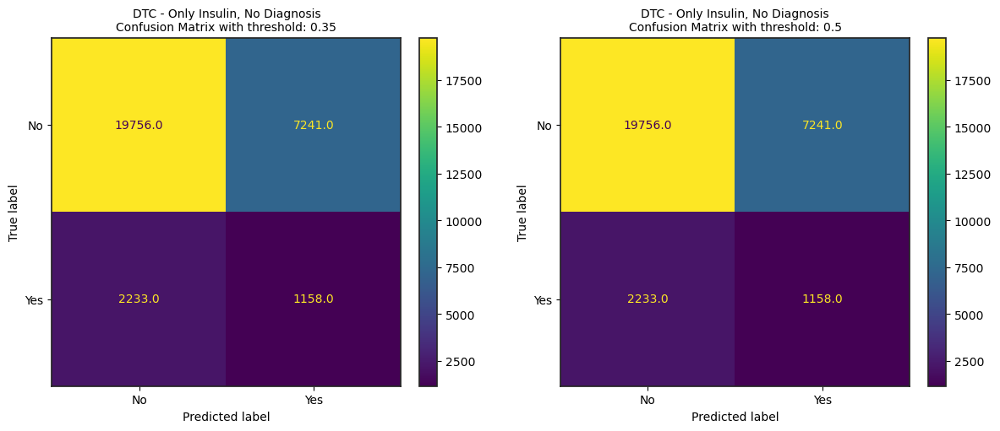

In [189]:
dt_threshold_nmdc_df, dt_cm_fig_nmdc = plotConfusionMatrixWithThreshold(X_test_nmdc, y_test_nmdc, 0.35, 0.5,
                                                   dt_grid_nmdc, 'DTC - Only Insulin, No Diagnosis') 

In [190]:
dt_threshold_nmdc_df

,"DTC - Only Insulin, No Diagnosis"
Model_Results,
Accuracy Score - Threshold - 0.35,0.688232
Recall Score - Threshold - 0.35,0.341492
Precision Score - Threshold - 0.35,0.137874
Accuracy Score - Threshold - 0.5,0.688232
Recall Score - Threshold - 0.5,0.341492
Precision Score - Threshold - 0.5,0.137874


<div class="alert alert-block alert-info">
    <H3>With Diagnosis Classifier and Medication</H2>
</div>

In [138]:
#Reload the cleaned data 
patients_records_cleaned = pd.read_csv('data/diabetic_data_cleaned.csv')

In [139]:
#Splliting data for train and test
X_train, X_test, y_train, y_test = train_test_split(patients_records_cleaned.drop(['readmitted less than 30 days'], axis = 1), 
                                                    patients_records_cleaned['readmitted less than 30 days'],
                                                    random_state=24, test_size = 0.3)

In [140]:
 cat_features = ['race', 'gender', 'A1Cresult_Tested', 'change', 'diabetesMed', 'admission_type', 
                'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 
                'discharge_disposition_type', 'outpatient_visits', 'inpatient_visits', 'emergency_visits',
              'metformin_used', 'repaglinide_used', 'nateglinide_used', 'glimepiride_used', 
              'glipizide_used', 'glyburide_used', 'tolbutamide_used', 'acarbose_used',
              'insulin_used', 'glyburide-metformin_used', 'diagnosis_1_classification']

cat_cols = []
for col in X_train.columns:
    if X_train[col].dtype == 'object': 
        cat_cols.append(True)
    else:
        cat_cols.append(False)
        
print('Before oversampleing: ', Counter(y_train))
oversample = SMOTENC(categorical_features=cat_cols, random_state=24)
X_train, y_train = oversample.fit_resample(X_train, y_train)
print('After oversampleing: ', Counter(y_train))

Before oversampleing:  Counter({0: 62984, 1: 7919})
After oversampleing:  Counter({0: 62984, 1: 62984})


In [141]:
# Creating a column transformer
column_transformer = make_column_transformer(
    (OneHotEncoder(drop="if_binary"),
     patients_records_cleaned.select_dtypes(include='object').columns),
    verbose_feature_names_out=False,
    remainder=StandardScaler())

<div class="alert alert-block alert-info">
    <B>KNeighborsClassifier</B>
</div>

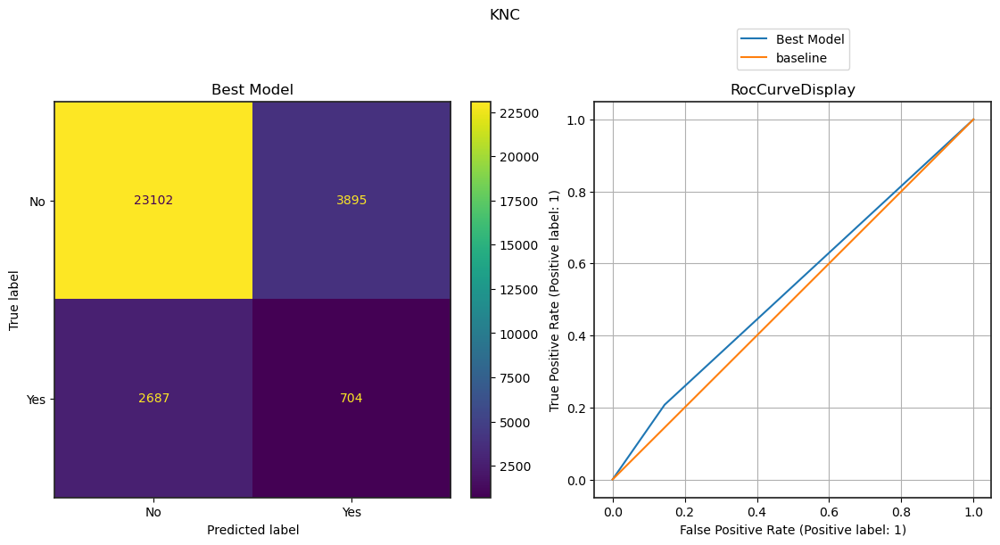

In [142]:
#Using the evaluateModel to GridSearchCV for KNeighborsClassifier 
knn_params =  {'model__n_neighbors': list(range(1, 100, 1)), 'model__weights': ['distance', 'uniform']}
knn_results_df, knn_grid = evaluateModel(
    KNeighborsClassifier(), knn_params, 'KNC', column_transformer,
                               X_train, X_test, y_train, y_test)

In [143]:
#print the KNN modeling results
knn_results_df

,KNC
Model_Results,
GridCV Accuracy Scoring Best Params,"[2, uniform]"
Accuracy,0.783401
Recall,0.207608


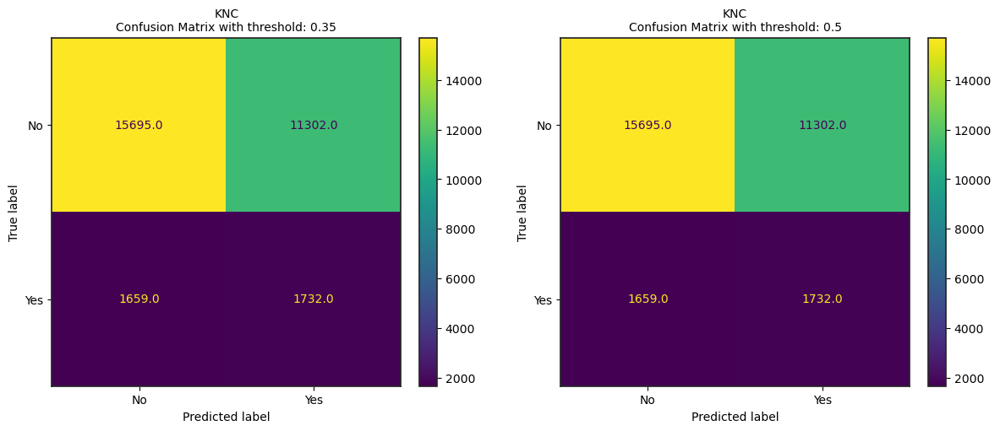

In [191]:
# Plot 
knn_threshold_df, knn_cm_fig = plotConfusionMatrixWithThreshold(X_test, y_test, 0.35, 0.5,
                                                   knn_grid, 'KNC')

In [192]:
knn_threshold_df

,KNC
Model_Results,
Accuracy Score - Threshold - 0.35,0.573483
Recall Score - Threshold - 0.35,0.510764
Precision Score - Threshold - 0.35,0.132883
Accuracy Score - Threshold - 0.5,0.573483
Recall Score - Threshold - 0.5,0.510764
Precision Score - Threshold - 0.5,0.132883


<div class="alert alert-block alert-info">
    <B>LogisticRegression</B>
</div>

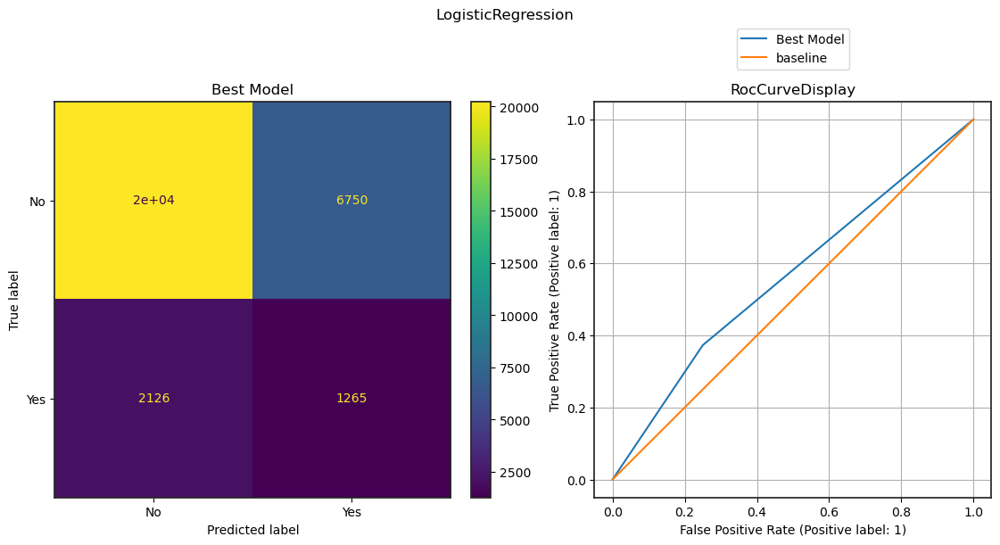

In [146]:
#Using the evaluateModel to GridSearchCV for LogisticRegression 

lr_params = {'model__max_iter': list(range(400, 800, 50)),
          'model__class_weight': [None, 'balanced'] }

lr_results_df, lr_grid = evaluateModel(
    LogisticRegression(random_state=42), lr_params, 'LogisticRegression', column_transformer,
                X_train, X_test, y_train, y_test)

In [147]:
#print the LogisticRegression modeling results and scores
lr_results_df

,LogisticRegression
Model_Results,
GridCV Accuracy Scoring Best Params,"[None, 400]"
Accuracy,0.707911
Recall,0.373046


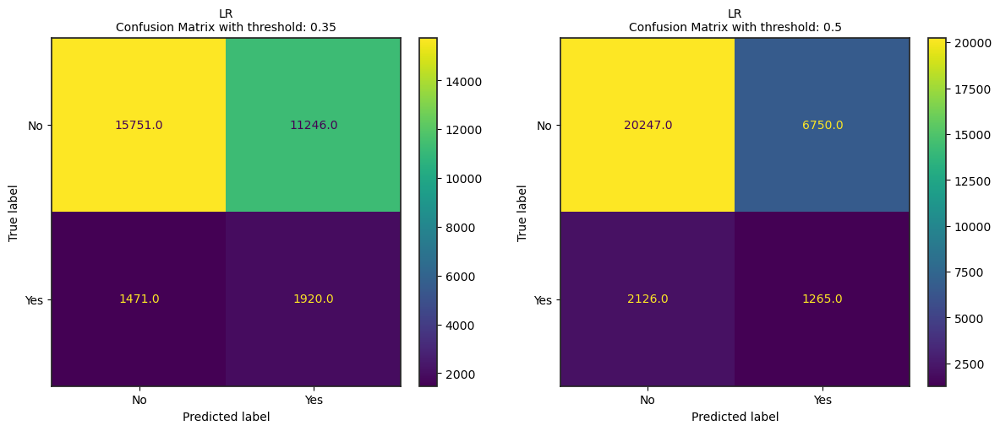

In [193]:
lr_threshold_df, lr_cm_fig = plotConfusionMatrixWithThreshold(X_test, y_test, 0.35, 0.5,
                                                   lr_grid, 'LR')

In [194]:
lr_threshold_df

,LR
Model_Results,
Accuracy Score - Threshold - 0.35,0.581512
Recall Score - Threshold - 0.35,0.566205
Precision Score - Threshold - 0.35,0.145830
Accuracy Score - Threshold - 0.5,0.707911
Recall Score - Threshold - 0.5,0.373046
Precision Score - Threshold - 0.5,0.157829


<div class="alert alert-block alert-info">
    <B>DecisionTreeClassifier</B>
</div>

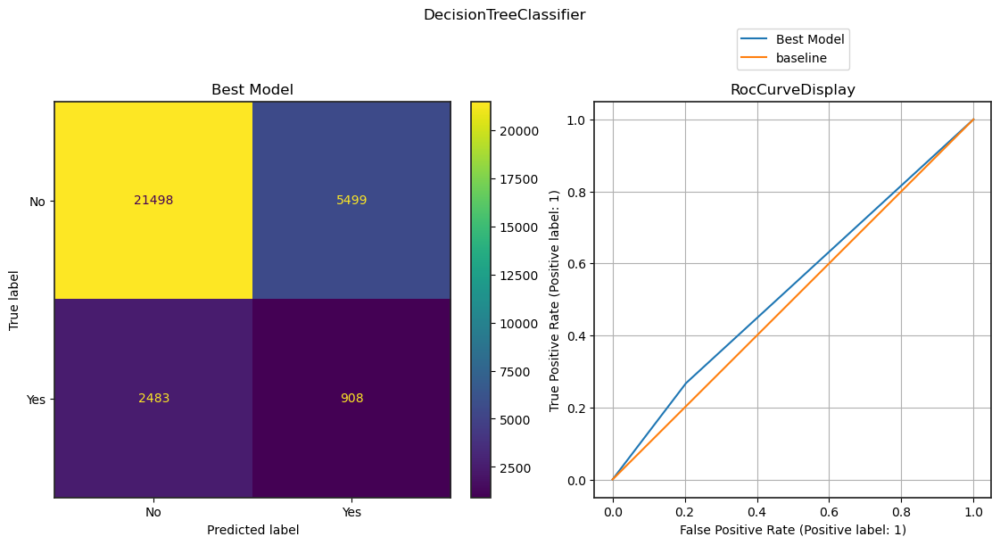

In [150]:
#Using the evaluateModel to GridSearchCV for DecisionTreeClassifier 
dt_params = {'model__min_samples_split': [2, 4, 6 ],
             'model__criterion': ['gini', 'entropy', 'log_loss' ],
             'model__min_samples_leaf': [2, 4, 6],
             'model__random_state': [15, 20, 42], 
             'model__splitter': ['best','random']
            }

dt_results_df, dt_grid = evaluateModel(
    DecisionTreeClassifier(), dt_params, 'DecisionTreeClassifier', column_transformer,
                X_train, X_test, y_train, y_test, 8)


In [151]:
#print the DecisionTreeClassifier modeling results and scores
dt_results_df

,DecisionTreeClassifier
Model_Results,
GridCV Accuracy Scoring Best Params,"[entropy, 2, 2, 20, best]"
Accuracy,0.737331
Recall,0.267768


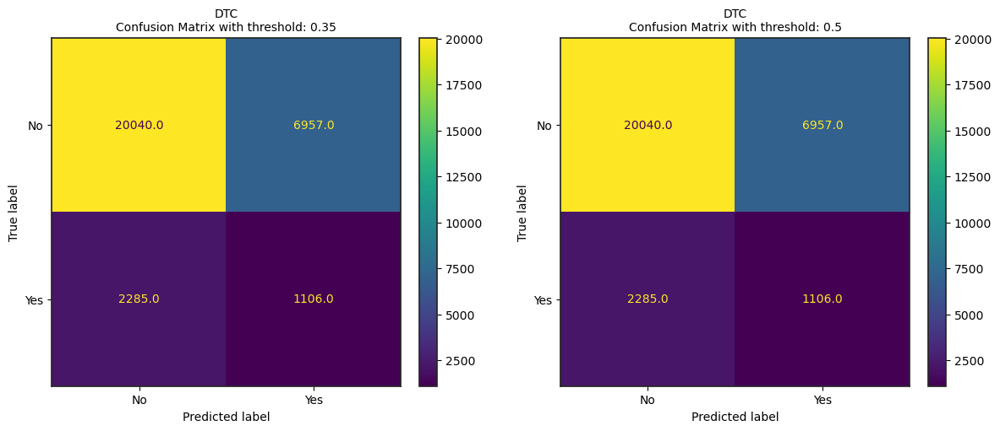

In [195]:
dt_threshold_df, dt_cm_fig_38 = plotConfusionMatrixWithThreshold(X_test, y_test, 0.35, 0.5,
                                                   dt_grid, 'DTC') 

In [196]:
dt_threshold_df

,DTC
Model_Results,
Accuracy Score - Threshold - 0.35,0.695867
Recall Score - Threshold - 0.35,0.326157
Precision Score - Threshold - 0.35,0.137170
Accuracy Score - Threshold - 0.5,0.695867
Recall Score - Threshold - 0.5,0.326157
Precision Score - Threshold - 0.5,0.137170


In [202]:
dt_results_all_models = pd.concat([knn_threshold_ndc_df, knn_threshold_nm_df, knn_threshold_nmdc_df, knn_threshold_df,
                                  lr_threshold_ndc_df, lr_threshold_nm_df, lr_threshold_nmdc_df, lr_threshold_df,
                                  dt_threshold_ndc_df, dt_threshold_nm_df, dt_threshold_nmdc_df, dt_threshold_df
                                  ], axis=1)

In [203]:
#Save the results data
dt_results_all_models.to_csv('results/Modelling_Results_With_OverSampling.csv', index = True)

In [204]:
dt_results_all_models

,KNC - No diagnosis,KNC - No Medication (Except Insulin),"KNC - Only Insulin, No Diagnosis",KNC,LR - No diagnosis,LR - No Medication (Except Insulin),"LR - Only Insulin, No Diagnosis",LR,DTC - No diagnosis,DTC - No Medication (Except Insulin),"DTC - Only Insulin, No Diagnosis",DTC
Model_Results,,,,,,,,,,,,
Accuracy Score - Threshold - 0.35,0.629294,0.557654,0.574931,0.573483,0.572265,0.561340,0.552192,0.581512,0.702218,0.684744,0.688232,0.695867
Recall Score - Threshold - 0.35,0.452669,0.541728,0.511943,0.510764,0.573872,0.590386,0.611029,0.566205,0.346211,0.337659,0.341492,0.326157
Precision Score - Threshold - 0.35,0.140260,0.133843,0.133559,0.132883,0.144159,0.143585,0.144280,0.145830,0.146640,0.135040,0.137874,0.137170
Accuracy Score - Threshold - 0.5,0.705015,0.557654,0.574931,0.573483,0.704522,0.696459,0.690536,0.707911,0.702218,0.684744,0.688232,0.695867
Recall Score - Threshold - 0.5,0.326747,0.541728,0.511943,0.510764,0.389266,0.400767,0.411678,0.373046,0.346211,0.337659,0.341492,0.326157
Precision Score - Threshold - 0.5,0.142252,0.133843,0.133559,0.132883,0.160428,0.158929,0.158546,0.157829,0.146640,0.135040,0.137874,0.137170


<div class="alert alert-block alert-success">
    <ul>
        <li><B>Technical </B>
            <ul>
				<li>KNeighborsClassifier, LogisticRegression and DecisionTreeClassifier are used for modeling.</li>
				<li>4 patterns of data was used for modeling using medication and primary diagnostic code
					<ul>
						<li>All medication data and primary diagnosis code was included</li>
						<li>Primary diagnosis code was not included</li>
						<li>Non Insulin medication data was not used</li>
						<li>Primary diagnosis and Non Insulin medication was not included</li>
					</ul>
				</li>
				<li> At 35% Probability threshold
					<ul>
						<li>Accuracy is around 55% to 70% </li>
						<li>Recall is around 35% to 60% </li>
						<li>Precision is around 13% to 14% </li>
                        <li> LR when not including non-insulan medications and Diagnosis performed better
                    </ul>
				</li>
				<li> At 50% Probability threshold
					<ul>
						<li>Accuracy is around 55% to 70% </li>
						<li>Recall is around 30% to 55% </li>
						<li>Precision is around 13% to 14% </li>
                        <li> LR when not including non-insulan medications and Diagnosis performed better
					</ul>
				</li>
		   </ul>
        </li>
    </ul>
</div>